In [ ]:
# %%

from __future__ import annotations

In [ ]:
# %%

from IPython import get_ipython

ipython = get_ipython()
if ipython is not None:
    ipython.run_line_magic("load_ext", "autoreload")
    ipython.run_line_magic("autoreload", "2")
else:
    print("Not in IPython, not loading autoreload")

In [ ]:
# %%

#!sudo apt-get install dvipng texlive-latex-extra texlive-fonts-recommended cm-super

In [ ]:
# %%

import traceback
import sys
import re
import time
import subprocess
from itertools import chain
from functools import reduce, partial, cache
from concurrent.futures import ThreadPoolExecutor
from PIL import Image
import io
import dataclasses
import math
import glob
from scipy import stats
from contextlib import contextmanager
from collections import defaultdict
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.figure
import seaborn as sns
import tikzplotly
import tikzplotlib
import matplotlib
from types import NoneType
from typing import (
    Callable,
    ClassVar,
    Literal,
    Sequence,
    Optional,
    Tuple,
    Union,
    Any,
    List,
    Iterator,
)
from plotly.subplots import make_subplots
import plotly.graph_objects as go

from gbmi.exp_max_of_n.plot import (
    scatter_attention_difference_vs_gap,
    hist_attention_difference_over_gap,
    hist_EVOU_max_minus_diag_logit_diff,
)
from gbmi.analysis_tools.plot import (
    hist_EVOU_max_logit_diff,
    weighted_histogram,
    Colorscale,
    colorscale_to_cmap,
    imshow,
    line,
)
from gbmi.analysis_tools.decomp import analyze_svd, split_svd_contributions
from gbmi.analysis_tools.utils import pm_round, pm_mean_std
from gbmi.analysis_tools.plot import scatter
from gbmi.exp_max_of_n.verification import LargestWrongLogitQuadraticConfig
from gbmi.utils.dataclass import enumerate_dataclass_values
from gbmi.utils.lowrank import LowRankTensor
import gbmi.utils.ein as ein
import gbmi.utils.images as image_utils
from gbmi.utils.images import trim_plotly_figure
from gbmi.utils.memoshelve import memoshelve
from gbmi.utils.latex_export import (
    to_latex_defs,
    latex_values_of_counter,
    latex_values_of_instruction_count,
)
from gbmi.exp_max_of_n.analysis import (
    find_second_singular_contributions,
    find_size_and_query_direction,
)
from gbmi.exp_max_of_n.plot import display_basic_interpretation
from gbmi.exp_max_of_n.train import (
    FullDatasetCfg,
    IterableDatasetCfg,
    MaxOfN,
    MaxOfNDataModule,
    MaxOfNTrainingWrapper,
    train_or_load_model,
)
from gbmi.model import Config, RunData
from torch.utils.data import DataLoader
import torch
from tqdm.auto import tqdm
import numpy as np
from jaxtyping import Float, Integer, Bool
from torch import Tensor
import pandas as pd
import plotly.express as px
from transformer_lens import HookedTransformerConfig, HookedTransformer
from pathlib import Path
from gbmi.utils import default_device, dropnan, shuffle_tensors, shuffle_tensor
from gbmi.utils.memocache import Memoize
from gbmi.utils.sequences import (
    SequenceDataset,
    ThunkedDataset,
    generate_all_sequences_for_model,
)
import shelve
from gbmi.verification_tools.decomp import (
    factor_contribution,
    split_SVD,
    max_row_diffs_per_dim,
    bound_max_row_diff_by_SVD,
)

from gbmi.verification_tools.general import EU_PU
from gbmi.verification_tools.l1h1 import (
    all_EQKE,
    all_EQKP,
    all_EVOU,
    all_PVOU,
    all_attention_scores,
)
from gbmi.verification_tools.utils import complexity_of
from gbmi.utils.hashing import get_hash_ascii
import gbmi.utils.git as git
import gbmi.exp_max_of_n.verification.cubic as cubic
import gbmi.exp_max_of_n.verification.subcubic as subcubic
import gbmi.exp_max_of_n.verification.quadratic as quadratic
import gbmi.exp_max_of_n.analysis.quadratic as analysis_quadratic
import gbmi.exp_max_of_n.analysis.subcubic as analysis_subcubic
import gbmi.utils.instructions as instructions
from gbmi.utils.instructions import (
    InstructionCount,
    CountTensor,
    PatchTorch,
    CountHookedTransformer,
    PerfCounter,
    PerfCollector,
    CountTensorOperations,
    PERF_WORKING,
)


try:
    import google.colab

    IN_COLAB = True
except:
    IN_COLAB = False

Failed to open event 1: Operation not permitted.


In [ ]:
# %%

DISPLAY_PLOTS: bool = True  # @param {type:"boolean"}
RENDERER: Optional[str] = "png"  # @param ["png", None]
PLOT_WITH: Literal["plotly", "matplotlib"] = (  # @param ["plotly", "matplotlib"]
    "matplotlib"
)
cache_dir = Path(__file__).parent / ".cache"
cache_dir.mkdir(exist_ok=True)
compute_expensive_average_across_many_models: bool = True  # @param {type:"boolean"}
LATEX_FIGURE_PATH = Path(__file__).with_suffix("") / "figures"
LATEX_FIGURE_PATH.mkdir(exist_ok=True, parents=True)
LATEX_VALUES_PATH = Path(__file__).with_suffix("") / "values.tex"
LATEX_VALUES_PATH.parent.mkdir(exist_ok=True, parents=True)
LATEX_TIKZPLOTLIB_PREAMBLE_PATH = (
    Path(__file__).with_suffix("") / "tikzplotlib-preamble.tex"
)
LATEX_TIKZPLOTLIB_PREAMBLE_PATH.parent.mkdir(exist_ok=True, parents=True)
LATEX_GIT_DIFF_PATH = Path(__file__).with_suffix("") / "git-diff-info.diff"
LATEX_GIT_DIFF_PATH.parent.mkdir(exist_ok=True, parents=True)
ALL_MODELS_PATH = (
    Path(__file__)
    .with_suffix("")
    .with_name(f"{Path(__file__).with_suffix('').name}_all_models")
)
TRAIN_CSV_PATH = ALL_MODELS_PATH / "all-models-train-values.csv"
TRAIN_CSV_PATH.parent.mkdir(exist_ok=True, parents=True)
BRUTE_FORCE_CSV_PATH = ALL_MODELS_PATH / "all-models-brute-force-values.csv"
BRUTE_FORCE_CSV_PATH.parent.mkdir(exist_ok=True, parents=True)
CUBIC_CSV_PATH = ALL_MODELS_PATH / "all-models-cubic-values.csv"
CUBIC_CSV_PATH.parent.mkdir(exist_ok=True, parents=True)
SUBCUBIC_CSV_PATH = ALL_MODELS_PATH / "all-models-subcubic-values.csv"
SUBCUBIC_CSV_PATH.parent.mkdir(exist_ok=True, parents=True)
SUBCUBIC_ANALYSIS_CSV_PATH = ALL_MODELS_PATH / "all-models-subcubic-analysis-values.csv"
SUBCUBIC_ANALYSIS_CSV_PATH.parent.mkdir(exist_ok=True, parents=True)
N_THREADS: Optional[int] = 2
matplotlib.rcParams["text.usetex"] = True
matplotlib.rcParams[
    "text.latex.preamble"
] = r"""\usepackage{amsmath}
\usepackage{amssymb}
\usepackage{xfrac}
\usepackage{lmodern}"""
default_OV_colorscale_2024_03_26: Colorscale = px.colors.get_colorscale(
    "RdBu"
)  # px.colors.get_colorscale("Picnic_r")
# default_OV_matplotlib_colorscale_2024_03_26: Colorscale = 'bwr_r'
default_QK_colorscale_2024_03_26: Colorscale = [
    [0, "#ff0000"],
    [0.25, "#ff8247"],
    [0.5, "white"],
    [0.75, "#ffc100"],
    [1, "#ff9c05"],
]
default_OV_colorscale: Colorscale = default_OV_colorscale_2024_03_26
default_QK_colorscale: Colorscale = default_QK_colorscale_2024_03_26
default_QK_SVD_colorscale: Colorscale = default_QK_colorscale

In [ ]:
# %%

latex_values: dict[str, Union[int, float, str]] = {}
latex_figures: dict[str, Union[go.Figure, matplotlib.figure.Figure]] = {}
latex_externalize_tables: dict[str, bool] = {}
latex_only_externalize_tables: dict[str, bool] = {}

In [ ]:
# %%

# hack around newlines of black formatting
seeds = (
    sorted(
        set(
            map(
                int,
                "50,104,123,519,742,913,1185,1283,1412,1490,1681,1696,1895,1951,2236,2306,2345,2549,2743,2773,3175,3254,3284,4157,4305,4430,4647,4729,4800,4810,5358,5615,5781,5928,6082,6155,6159,6204,6532,6549,6589,6910,7098,7238,7310,7467,7790,7884,8048,8299,8721,8745,8840,8893,9132,9134,9504,9816,10248,11124,11130,11498,11598,11611,12141,12287,12457,12493,12552,12561,13036,13293,13468,13654,13716,14095,14929,15043,15399,15622,15662,16069,16149,16197,16284,17080,17096,17194,17197,18146,18289,18668,19004,19093,19451,19488,19538,19917,20013,20294,20338,20415,20539,20751,20754,20976,21317,21598,22261,22286,22401,22545,23241,23367,23447,23633,23696,24144,24173,24202,24262,24438,24566,25516,26278,26374,26829,26932,27300,27484,27584,27671,27714,28090,28716,28778,29022,29052,29110,29195,29565,29725,29726,30371,30463,30684,30899,31308,32103,32374,32382".split(
                    ","
                ),
            )
        )
    )
    if compute_expensive_average_across_many_models
    else []
)
cfgs = {
    seed: Config(
        experiment=MaxOfN(
            model_config=HookedTransformerConfig(
                act_fn=None,
                attn_only=True,
                d_head=32,
                d_mlp=None,
                d_model=32,
                d_vocab=64,
                device="cpu",
                n_ctx=4,
                n_heads=1,
                n_layers=1,
                normalization_type=None,
            ),
            zero_biases=True,
            use_log1p=True,
            use_end_of_sequence=False,
            seq_len=4,
            optimizer="AdamW",
            optimizer_kwargs={"lr": 0.001, "betas": (0.9, 0.999)},
            train_dataset_cfg=IterableDatasetCfg(pick_max_first=False),
            test_dataset_cfg=IterableDatasetCfg(n_samples=1024),
        ),
        deterministic=True,
        seed=seed,
        batch_size=128,
        train_for=(3000, "steps"),
    )
    for seed in [123] + list(seeds)
}
cfg_hashes = {seed: get_hash_ascii(cfg) for seed, cfg in cfgs.items()}
cfg_hashes_for_filename = {
    seed: f"{seed}_{cfg_hashes[seed].replace('/', '__SLASH__')}"
    for seed, cfg in cfgs.items()
}
datamodules = {seed: MaxOfNDataModule(cfg) for seed, cfg in cfgs.items()}

In [ ]:
# %%

with memoshelve(
    train_or_load_model,
    filename=cache_dir / f"{Path(__file__).name}.train_or_load_model",
    get_hash=get_hash_ascii,
)() as memo_train_or_load_model:
    runtime_models = {}

    def _handle_memo_train_or_load_model(arg):
        seed, cfg = arg
        try:
            runtime_models[seed] = memo_train_or_load_model(cfg, force="load")
        except Exception as e:
            print(f"Error loading model for seed {seed}: {e}")

    with ThreadPoolExecutor(max_workers=N_THREADS) as executor:
        executor.map(_handle_memo_train_or_load_model, tqdm(cfgs.items()))

  0%|          | 0/151 [00:00<?, ?it/s]

In [ ]:
# %%

training_wrappers = {
    seed: MaxOfNTrainingWrapper(cfgs[seed], model)
    for seed, (_runtime, model) in runtime_models.items()
}
# training_wrapper.run_batch = Memoize(training_wrapper.run_batch, name=f"{__file__}.training_wrapper.run_batch", use_pandas=False, use_shelf=True)  # type: ignore

# %% [markdown]

 # Training stats

In [ ]:
# %%

train_total_loss = {}
train_total_accuracy = {}
train_total_samples = {}
train_measurement_deterministic: bool = False  # @param {type:"boolean"}
train_average_loss = {}
train_average_accuracy = {}
dataloader_iter: Iterator


# loop for computing overall loss and accuracy
@torch.no_grad()
def _run_train_batch_loss_accuracy(
    seed: int, i: int, batch_size: int
) -> Tuple[float, float, int]:
    xs, ys = next(dataloader_iter)
    device = default_device(deterministic=train_measurement_deterministic)
    xs.to(device)
    ys.to(device)
    loss, accuracy = training_wrappers[seed].run_batch((xs, ys), log_output=False)
    loss = loss.item()
    return loss, accuracy, batch_size


for seedi, seed in enumerate(tqdm(runtime_models.keys(), desc="seed", position=0)):
    leave = seedi == len(runtime_models.keys()) - 1
    train_total_loss[seed] = 0.0
    train_total_accuracy[seed] = 0.0
    train_total_samples[seed] = 0

    datamodule = datamodules[seed]
    datamodule.setup("train")
    dataloader = datamodule.train_dataloader()
    dataloader_iter = iter(dataloader)
    with memoshelve(
        _run_train_batch_loss_accuracy,
        filename=cache_dir
        / f"{Path(__file__).name}.run_batch_loss_accuracy-{cfg_hashes_for_filename[seed]}-{train_measurement_deterministic}",
        get_hash_mem=(lambda x: x[0]),
        get_hash=str,
    )() as run_batch_loss_accuracy:
        for i in tqdm(
            range(0, len(dataloader)),
            desc=f"batches",
            position=1,
            leave=leave,
        ):
            loss, accuracy, size = run_batch_loss_accuracy(seed, i, cfgs[seed].batch_size)  # type: ignore
            # Accumulate loss and accuracy
            train_total_loss[seed] += loss * size
            train_total_accuracy[seed] += accuracy * size
            train_total_samples[seed] += size

    # Calculate average loss and accuracy
    train_average_loss[seed] = train_total_loss[seed] / train_total_samples[seed]
    train_average_accuracy[seed] = (
        train_total_accuracy[seed] / train_total_samples[seed]
    )

seed:   0%|          | 0/151 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

batches:   0%|          | 0/3000 [00:00<?, ?it/s]

In [ ]:
# %%

num_seeds = len(train_average_loss)
avg_train_average_loss = sum(train_average_loss.values()) / num_seeds
avg_train_average_accuracy = sum(train_average_accuracy.values()) / num_seeds
std_dev_train_average_loss = float(np.std(list(train_average_loss.values())))
std_dev_train_average_accuracy = float(np.std(list(train_average_accuracy.values())))
latex_values["NumSeeds"] = num_seeds
latex_values["AvgTrainAccuracyFloat"] = avg_train_average_accuracy
latex_values["StdDevTrainAccuracyFloat"] = std_dev_train_average_accuracy
latex_values["AvgTrainLossFloat"] = avg_train_average_loss
latex_values["StdDevTrainLossFloat"] = std_dev_train_average_loss
print(f"Overall Training stats ({num_seeds} training runs):")
print(
    f"Model Accuracy: ({pm_round(avg_train_average_accuracy * 100, std_dev_train_average_accuracy * 100)})%"
)
print(f"Model Loss: {pm_round(avg_train_average_loss, std_dev_train_average_loss)}")

Overall Training stats (151 training runs):
Model Accuracy: (99.92 ± 0.15)%
Model Loss: 0.0044 ± 0.0077


In [ ]:
# %%

# import sys
# sys.exit(0)

In [ ]:
# %%

seed = 123
cfg = cfgs[seed]
cfg_hash = cfg_hashes[seed]
cfg_hash_for_filename = cfg_hashes_for_filename[seed]
runtime, model = runtime_models[seed]
training_wrapper = training_wrappers[seed]
latex_values["seed"] = seed
assert cfg.experiment.model_config.seed is not None
latex_values["ModelSeed"] = cfg.experiment.model_config.seed
latex_values["TrainAccuracyFloat"] = train_average_accuracy[seed]
latex_values["TrainLossFloat"] = train_average_accuracy[seed]

In [ ]:
# %%

print(f"Training stats:")
print(f"Model Accuracy: {train_average_accuracy[seed] * 100}%")
print(f"Model Loss: {train_average_loss[seed]}")

Training stats:
Model Accuracy: 99.73307291666667%
Model Loss: 0.009097257728581705


# %% [markdown]

 # Brute Force Proof

In [ ]:
# %%

all_tokens_dataset = SequenceDataset(
    seq_len=model.cfg.n_ctx, vocab_size=model.cfg.d_vocab
)


@torch.no_grad()
def _run_batch_loss_accuracy(
    i: int, batch_size: int, return_incorrect_sequences: bool = True
) -> Tuple[
    Union[Tuple[float, float, int], Tuple[Tuple[float, float, int], Tensor]], float
]:
    batch = all_tokens_dataset[i : i + batch_size]
    size = batch.shape[0]
    device = default_device(deterministic=brute_force_proof_deterministic)
    batch.to(device)
    duration = 0.0
    start = time.time()
    labels = training_wrapper.config.experiment.get_ground_truth(batch)
    xs, ys, y_preds = training_wrapper.compute_batch((batch, labels), device=device)
    loss = training_wrapper.loss_fn(
        y_preds, ys, log_softmax=training_wrapper.log_softmax
    ).item()
    full_accuracy = training_wrapper.acc_fn_per_seq(y_preds, ys)
    accuracy = full_accuracy.float().mean().item()
    duration += time.time() - start
    if return_incorrect_sequences:
        return ((loss, accuracy, size), xs[~full_accuracy]), duration
    return (loss, accuracy, size), duration

In [ ]:
# %%

batch_size = 4096  # 16_384 # 8182
brute_force_proof_deterministic: bool = True  # @param {type:"boolean"}
latex_values["BruteForceCPU"] = brute_force_proof_deterministic
latex_values["BruteForceBatchSize"] = batch_size
latex_values["BruteForceNumBatches"] = int(
    math.ceil(len(all_tokens_dataset) / batch_size)
)

In [ ]:
# %%


@torch.no_grad()
def single_batch_instruction_count(
    model: HookedTransformer, batch_size: int
) -> Tuple[InstructionCount, PerfCounter]:
    with PerfCollector() as collector:
        if PERF_WORKING:
            _run_batch_loss_accuracy(0, batch_size, return_incorrect_sequences=False)
    perf_instruction_count = collector.counters

    with CountTensorOperations() as result:
        batch = CountTensor.from_numpy(all_tokens_dataset[:batch_size])
        size = batch.shape[0]
        labels: CountTensor = training_wrapper.config.experiment.get_ground_truth(batch)  # type: ignore
        xs, ys = batch, labels
        y_preds: CountTensor = CountHookedTransformer(model)(xs)
        loss: CountTensor = training_wrapper.loss_fn(
            y_preds, ys, log_softmax=CountTensor.log_softmax  # type: ignore
        )  # type: ignore
        full_accuracy: CountTensor = training_wrapper.acc_fn_per_seq(y_preds, ys)  # type: ignore
        accuracy: CountTensor = full_accuracy.float().mean()

    return result, perf_instruction_count


def brute_force_instruction_count(
    model: HookedTransformer, batch_size: int
) -> Tuple[InstructionCount, PerfCounter]:
    n_full_batches = len(all_tokens_dataset) // batch_size
    final_batch_size = len(all_tokens_dataset) % batch_size
    single_batch, single_batch_perf = single_batch_instruction_count(model, batch_size)
    result = single_batch * n_full_batches
    result_perf = single_batch_perf * n_full_batches
    if final_batch_size != 0:
        final_batch, final_batch_perf = single_batch_instruction_count(
            model, final_batch_size
        )
        result += final_batch
        result_perf += final_batch_perf
    return result, result_perf


brute_force_count, brute_force_perf = brute_force_instruction_count(model, batch_size)
latex_values |= latex_values_of_instruction_count("BruteForce", brute_force_count)
latex_values |= latex_values_of_counter("BruteForce", brute_force_perf)

In [ ]:
# %%

# Resetting the DataLoader without shuffle for consistent processing
# data_loader = DataLoader(all_tokens_dataset, batch_size=batch_size, shuffle=False)

# Variables to accumulate total loss and accuracy
total_loss = 0.0
total_accuracy = 0.0
total_samples = 0
total_duration = 0.0
all_incorrect_sequences = []


with memoshelve(
    _run_batch_loss_accuracy,
    filename=cache_dir
    / f"{Path(__file__).name}.run_batch_loss_accuracy-{cfg_hash_for_filename}-{brute_force_proof_deterministic}",
    get_hash_mem=(lambda x: x[0]),
    get_hash=str,
)() as run_batch_loss_accuracy:
    for i in tqdm(range(0, len(all_tokens_dataset), batch_size)):
        ((loss, accuracy, size), incorrect_sequences), duration = run_batch_loss_accuracy(i, batch_size)  # type: ignore
        total_duration += duration
        # Accumulate loss and accuracy
        start = time.time()
        total_loss += loss * size
        total_accuracy += accuracy * size
        total_samples += size
        total_duration += time.time() - start
        all_incorrect_sequences.append(incorrect_sequences)

# Calculate average loss and accuracy
average_loss = total_loss / total_samples
average_accuracy = total_accuracy / total_samples
incorrect_sequences = torch.cat(all_incorrect_sequences, dim=0)
num_correct_sequences = int(round(average_accuracy * all_tokens_dataset.length))
num_incorrect_sequences = all_tokens_dataset.length - num_correct_sequences
latex_values["BruteForceLossFloat"] = average_loss
latex_values["BruteForceAccuracyFloat"] = average_accuracy
latex_values["BruteForceNumCorrect"] = num_correct_sequences
latex_values["BruteForceNumIncorrect"] = num_incorrect_sequences
latex_values["BruteForceTimeFloat"] = total_duration

  0%|          | 0/4096 [00:00<?, ?it/s]

In [ ]:
# %%

print(f"Brute force proof:")
print(f"Model Accuracy: {average_accuracy * 100}%")
print(f"Number Correct Sequences: {num_correct_sequences}")
print(f"Number Incorrect Sequences: {num_incorrect_sequences}")
print(f"Model Loss: {average_loss}")

Brute force proof:
Model Accuracy: 99.73089098930359%
Number Correct Sequences: 16732067
Number Incorrect Sequences: 45149
Model Loss: 0.009019244883034516


In [ ]:
# %%

fraction_of_incorrect_sequences_by_max = []
count_of_incorrect_sequences_by_query = []
for tok in range(model.cfg.d_vocab_out):
    cur_sequence_count = (
        1 if tok == 0 else (tok + 1) ** model.cfg.n_ctx - tok**model.cfg.n_ctx
    )
    fraction_of_incorrect_sequences_by_max.append(
        incorrect_sequences[incorrect_sequences.max(dim=-1).values == tok].shape[0]
        / cur_sequence_count
    )
    count_of_incorrect_sequences_by_query.append(
        incorrect_sequences[incorrect_sequences[:, -1] == tok].shape[0]
    )

# %% [markdown]

 Complexity: $$\mathcal{O}(\text{d\_vocab}^\text{n\_ctx} \cdot \text{n\_ctx} \cdot \text{d\_vocab} \cdot \text{d\_model})$$
 (batch size * number tensors in each sequence * cost of most expensive vector-matrix-multiplication)
 # %% [markdown]
 # # Brute Force Proof Standalone

In [ ]:
# %%

# brute_force_use_gpu: bool = True #@param {type:"boolean"}
# brute_force_device = "cuda" if brute_force_use_gpu and torch.cuda.is_available() else "cpu"
# def generate_all_sequences_in_batches(d_vocab: int, n_ctx: int, per_batch: int = 2, postfix: Optional[List[int]] = None):
#     if postfix is None: postfix = []
#     if n_ctx <= per_batch:
#         sequences = torch.cartesian_prod(*[torch.arange(d_vocab) for _ in range(n_ctx)])
#         # append broadcasted postfix if not none
#         if len(postfix):
#             sequences = torch.cat([sequences, torch.tensor(postfix).expand(sequences.shape[0], -1)], dim=-1)
#         yield sequences
#     else:
#         for last_tok in range(d_vocab):
#             for sequences in generate_all_sequences_in_batches(d_vocab, n_ctx - 1, per_batch=per_batch, postfix=[last_tok] + postfix):
#                 yield sequences
# with shelve.open(cache_dir / f"{Path(__file__).name}.brute-force-standalone-{cfg_hash_for_filename}-{brute_force_device}") as shelf:

In [ ]:
# %%

# # %% [markdown]
# # Brute Force Proof (with Memoization)
# TODO: Didn't want to implement it yet
# It's should be possible to get
# $$\mathcal{O}(\text{d\_vocab}^\text{n\_ctx} \cdot \left( \text{n\_ctx} \cdot \text{d\_model} + \text{d\_model} \cdot \text{d\_vocab}\right))$$
# (batch size * (sequence length * longest vector operated on per position + cost of unembed))
#
# [REDACTED] and [REDACTED] also tell me it's possible to do very clever caching and get this down to something like $\mathcal{O}(\text{vocab}^\text{n\_ctx} \cdot \text{d\_model}^2)$
# # %% [markdown]
# # # Important Sequences Only By Convexity
# # If we can iterate over the query tokens and the max tokens and the non-max tokens and do a forward pass for each, we can bound loss by convexity.

# %% [markdown]

 ## Convexity Property

 **Lemma**: For a single attention head, it suffices to consider sequences with at most two distinct tokens.

 Note that we are comparing sequences by pre-final-layernorm-scaling gap between the logit of the minimum token and the logit of any other fixed token.
 Layernorm scaling is non-linear, but if we only care about accuracy and not log-loss, then we can ignore it (neither scaling nor softmax changes which logit is the largest).

 **Proof sketch**:
 We show that any sequence with three token values, $x < y < z$, is strictly dominated either by a sequence with just $x$ and $y$ or a sequence with just $x$ and $z$.

 Suppose we have $k$ copies of $x$, $n$ copies of $y$, and $\ell - k - n$ copies of $z$, the attention scores are $s_x$, $s_y$, and $s_z$, and the differences between the logit of $x$ and our chosen comparison logit (as computed by the OV circuit for each token) are $v_x$, $v_y$, and $v_z$.
 Then the difference in logit between $x$ and the comparison token is
 $$\left(k e^{s_x} v_x + n e^{s_y} v_y + (\ell - k - n)e^{s_z}v_z \right)\left(k e^{s_x} + n e^{s_y} + (\ell - k - n)e^{s_z}\right)^{-1}$$
 Rearrangement gives
 $$\left(\left(k e^{s_x} v_x + (\ell - k) e^{s_z} v_z\right) + n \left(e^{s_y} v_y - e^{s_z}v_z\right) \right)\left(\left(k e^{s_x} + (\ell - k) e^{s_z}\right) + n \left(e^{s_y} - e^{s_z}\right)\right)^{-1}$$
 This is a fraction of the form $\frac{a + bn}{c + dn}$.  Taking the derivative with respect to $n$ gives $\frac{bc - ad}{(c + dn)^2}$.  Noting that $c + dn$ cannot equal zero for any valid $n$, we get that the derivative never changes sign.  Hence our logit difference is maximized either at $n = 0$ or at $n = \ell - k$, and the sequence with just two values dominates the one with three.

 This proof generalizes straightforwardly to sequences with more than three values.

 Similarly, this proof shows that, when considering only a single attention head, it suffices to consider sequences of $\ell$ copies of the minimum token and sequences with one copy of the minimum token and $\ell - 1$ copies of the non-minimum token, as intermediate values are dominated by the extremes.

In [ ]:
# %%

# # %%
# # build a map of max_tok -> query_tok -> non_max_tok -> sequence_count, max_loss, accuracy
# batch_size = 4096  # 16_384 # 8182
# loss_accuracy_cubic_memcache = {}

# run_batch_cubic_shelf_name = f"{__file__}.run_batch_cubic_shelf"
# results = {}
# with shelve.open(run_batch_cubic_shelf_name) as shelf:
#     with torch.no_grad():
#         for i in tqdm(range(0, len(all_tokens_dataset), batch_size)):
#             try:
#                 mapping = loss_accuracy_cubic_memcache[(i, batch_size)]
#             except KeyError:
#                 key = f"{i}_{batch_size}"
#                 try:
#                     mapping = loss_accuracy_cubic_memcache[(i, batch_size)] = shelf[key]
#                 except KeyError:
#                     batch = all_tokens_dataset[i : i + batch_size]
#                     # Mask to identify rows with duplicates
#                     mask = torch.tensor([row.unique().size(0) < 4 for row in batch])
#                     batch = batch[mask]
#                     batch.to(default_device(deterministic=True))
#                     q_toks = batch[:, -1]
#                     max_non_qtoks = batch[:, :-1].max(dim=-1).values
#                     min_non_qtoks = batch[:, :-1].min(dim=-1).values
#                     mapping = {}
#                     for q_tok in set(q_toks.tolist()):
#                         for max_non_qtok in set(max_non_qtoks.tolist()):
#                             for min_non_qtok in set(min_non_qtoks.tolist()):
#                                 subbatch = batch[
#                                     (q_toks == q_tok)
#                                     & (max_non_qtoks == max_non_qtok)
#                                     & (min_non_qtoks == min_non_qtok)
#                                 ]
#                                 if subbatch.shape[0] == 0:
#                                     continue
#                                 size = subbatch.shape[0]
#                                 loss, accuracy = training_wrapper.run_batch(
#                                     subbatch, return_accuracy=True, log_output=False
#                                 )
#                                 loss = loss.item()
#                                 mapping[(q_tok, max_non_qtok, min_non_qtok)] = (
#                                     loss,
#                                     accuracy,
#                                     size,
#                                 )
#                     loss_accuracy_cubic_memcache[(i, batch_size)] = shelf[key] = mapping
#             for key, (loss, accuracy, size) in mapping.items():
#                 cur_loss, cur_accuracy, cur_size = results.get(key, (0, True, 0))
#                 results[key] = (
#                     max(cur_loss, loss),
#                     cur_accuracy and (int(round(accuracy * size)) == size),
#                     cur_size + size,
#                 )

# %% [markdown]

 # Cubic proof
 Target Complexity: $$\mathcal{O}(\text{d\_vocab}^3 \cdot \text{n\_ctx}^2)$$

 This will leave us enough room to compute out all the matrices.
 We will get to run computations on $\text{d\_vocab}^2$ sequences, iterating over the query and max tokens.

In [ ]:
# %%

EUPU: Float[Tensor, "d_vocab_q d_vocab_out"] = EU_PU(model)  # noqa: F722
print(f"Complexity of EU_PU: {complexity_of(EU_PU)}")  # O(d_vocab^2 * d_model)
EVOU: Float[Tensor, "d_vocab d_vocab_out"] = all_EVOU(model)  # noqa: F722
print(f"Complexity of EVOU: {complexity_of(all_EVOU)}")  # O(d_vocab^2 * d_model)
PVOU: Float[Tensor, "n_ctx d_vocab_out"] = all_PVOU(model)  # noqa: F722
print(f"Complexity of PVOU: {complexity_of(all_PVOU)}")  # O(n_ctx * d_vocab * d_model)
# EPQKEP: Float[
#     Tensor, "n_ctx_k d_vocab_q d_vocab_k"  # noqa: F722
# ] = all_attention_scores(model)
# print(
#     f"Complexity of (E+P[-1])QKEP: {complexity_of(all_attention_scores)}"
# )  # O(d_vocab^2 * d_model * n_ctx)
EQKE: Float[Tensor, "d_vocab_q d_vocab_k"] = all_EQKE(model)  # noqa: F722
print(f"Complexity of EQKE: {complexity_of(all_EQKE)}")  # O(d_vocab^2 * d_model)
EQKP: Float[Tensor, "d_vocab_q n_ctx_k"] = all_EQKP(model)  # noqa: F722
print(f"Complexity of EQKP: {complexity_of(all_EQKP)}")  # O(d_vocab * d_model * n_ctx)

Complexity of EU_PU: O(d_vocab^2 * d_model)
Complexity of EVOU: O(d_vocab * (d_model * d_head + d_model * d_vocab_out)) ~ O(d_vocab^2 * d_model)
Complexity of PVOU: O(n_ctx * (d_model * d_head + d_model * d_vocab_out)) ~ O(n_ctx * d_vocab * d_model)
Complexity of EQKE: O(d_vocab^2 * d_model)
Complexity of EQKP: O(d_vocab * d_model * n_ctx)


In [ ]:
# %%

# @torch.no_grad()
# def compute_extrema_softmaxed_attention_cubic(
#     EQKE: Float[Tensor, "n_ctx_k d_vocab_q d_vocab_max"],  # noqa: F722
#     attn_scale: Union[Float[Tensor, ""], float] = model.blocks[  # noqa F722
#         0
#     ].attn.attn_scale,
# ) -> Float[
#     Tensor,
#     "order=5 attn=3 d_vocab_q d_vocab_max d_vocab_nonmax n_ctx_copies_nonmax",  # noqa: F722
# ]:
#     r"""
#     Computes the extreme post-softmax attention paid to the maximum (attn=0), non-maximum (attn=1), and query (attn=2) tokens by each query token, for each number of copies of the non max token.
#     Note that we could do a bit of a better job than this by taking in min_gap and a pre-computed extreme_attention matrix, if we wanted to.

#     The order determines which extreme we're at acconding to positional encoding:
#     0: max > nonmax
#     1: max > query > nonmax

#     min_gap is used only to determine when the result should be nan

#     Complexity: O(d_vocab^2 * n_ctx^2)

#     Preconditions:
#         Define:
#         EQKE[q, p, k] := (W_E[q] + W_pos[-1]) @ W_Q[0, 0] @ W_K[0, 0].T @ (W_E[k] + W_pos[p]).T
#         Then we demand:
#         . \forall q, m, p1, p2, k:
#           if ((q == m) or (q <= m - min_gap[q, m])) and (k <= m - min_gap[q, m]):
#             min_right_attention[q, m] + EQKE_pos_error[q, p1] - EKQE_pos_error[q, p2]
#             <= EQKE[q, p1, m] - EQKE[q, p2, k]
#     Postconditions:
#         \forall q, m, n_copies_nonmax:
#           if q > m: return[q, m, n_copies_nonmax] = nan
#           elif m - min_gap[q, m] < q < m: return[q, m, n_copies_nonmax] = nan
#           elif m < min_gap[q, m] and n_copies_nonmax != 0: return[q, m, n_copies_nonmax] = nan
#           elif m < min_gap[q, m]: return[q, m, 0] = nan
#           else: return[q, m, n_copies_nonmax] <= post-softmax attention paid to max token m amongst all sequences with query q, n_ctx - n_copies_nonmax tokens equal to m, and all other tokens <= m - min_gap[q, m]
#     """

# %% [markdown]

 # Mathematical Proof for Cubic

 Precompute:
 $$\begin{align*}\
 E_q &:= W_E[q] + W_\text{pos}[-1] \
 && \mathcal{O}(\text{d\_vocab} \cdot \text{d\_model}) \\
 \text{EQKE}[q,k] &:= E_q W_Q W_K^T (W_E[k])^T \
 && \mathcal{O}(\text{d\_vocab}^2 \cdot \text{d\_model}) \\
 \text{EQKP}[q,p] &:= E_q W_Q W_K^T (W_\text{pos}[p])^T \
 && \mathcal{O}(\text{d\_vocab} \cdot \text{d\_model} \cdot \text{n\_ctx}) \\
 \text{EUPU}[q] &:= E_q W_U \
 && \mathcal{O}(\text{d\_vocab}^2 \cdot \text{d\_model}) \\
 \text{EVOU}[k] &:= W_E[k] W_V W_O W_U \
 && \mathcal{O}(\text{d\_vocab}^2 \cdot \text{d\_model}) \\
 \text{PVOU}[p] &:= W_\text{pos}[p] W_V W_O W_U \
 && \mathcal{O}(\text{d\_vocab} \cdot \text{d\_model} \cdot \text{n\_ctx}) \\
 \end{align*}$$
 For a sequence $$\mathbf{x}$$, define
 $$\begin{align*}\
 \alpha(x_{-1},x_{i_k},i_k) &:= \frac{1}{\sqrt{\text{d\_head}}}(\text{EQKE}[x_{-1},x_{i_k}] + \text{EQKP}[x_{-1},i_k]) \\
 \mathbf{y}(\mathbf{x}) & :=\frac{1}{\sum_i e^{\alpha(x_{-1},x_i,i)}}\left[\sum_{i=0}^{n-1} e^{\alpha(x_{-1},x_i,i)}(\text{EVOU}[x_i] + \text{PVOU}[i]) \right] + \text{EUPU}[x_{-1}] \\
 \end{align*}$$
 We are interested in counting up the sequences with maximum token $m$ for which we have for all $t \neq m$ that
 $$y_t(\mathbf{x}) - y_m(\mathbf{x}) < 0$$
 Define
 $$w := \argmax_{t\text{ s.t. }t\neq m} y_t(\mathbf{x}) - y_m(\mathbf{x})$$
 Then
 $$\begin{align*}\
 &y_w(\mathbf{x}) - y_m(\mathbf{x})\\
 &= \max_{t \ne m}y_t(\mathbf{x}) - y_m(\mathbf{x}) \\
 &= \max_{t \ne m}\left(\frac{1}{\sum_i e^{\alpha(x_{-1},x_i,i)}}\left[\sum_{i=0}^{n-1} e^{\alpha(x_{-1},x_i,i)}(\text{EVOU}[x_i, t] - \text{EVOU}[x_i, m] + \text{PVOU}[i, t] - \text{PVOU}[i, m]) \right] + \text{EUPU}[x_{-1}, t] + \text{EUPU}[x_{-1}, m]\right) \\
 &= \max_{t \ne m}\left(\frac{1}{\sum_i e^{\alpha(x_{-1},x_i,i)}}\left[\sum_{i=0}^{n-1} e^{\alpha(x_{-1},x_i,i)}(\text{EVOU}[x_i, t] - \text{EVOU}[x_i, m] + \text{PVOU}[i, t] - \text{PVOU}[i, m]) \right] + \text{EUPU}[x_{-1}, t] + \text{EUPU}[x_{-1}, m]\right) \\
 \end{align*}$$

In [ ]:
# %%

# for q_tok in tqdm(range(model.cfg.d_vocab)):
#     for max_non_qtok in range(model.cfg.d_vocab):
#         for min_non_qtok in range(model.cfg.d_vocab):
# TODO COMPUTATION
# START HERE

In [ ]:
# %%

EUPU: Float[Tensor, "d_vocab_q d_vocab_out"] = EU_PU(model)  # noqa: F722
print(f"Complexity of EU_PU: {complexity_of(EU_PU)}")  # O(d_vocab^2 * d_model)
EVOU: Float[Tensor, "d_vocab d_vocab_out"] = all_EVOU(model)  # noqa: F722
print(f"Complexity of EVOU: {complexity_of(all_EVOU)}")  # O(d_vocab^2 * d_model)
PVOU: Float[Tensor, "n_ctx d_vocab_out"] = all_PVOU(model)  # noqa: F722
print(f"Complexity of PVOU: {complexity_of(all_PVOU)}")  # O(n_ctx * d_vocab * d_model)

Complexity of EU_PU: O(d_vocab^2 * d_model)
Complexity of EVOU: O(d_vocab * (d_model * d_head + d_model * d_vocab_out)) ~ O(d_vocab^2 * d_model)
Complexity of PVOU: O(n_ctx * (d_model * d_head + d_model * d_vocab_out)) ~ O(n_ctx * d_vocab * d_model)


In [ ]:
# %%

# @torch.no_grad()
# def find_min_gaps(
#     *,
#     EQKE: Float[Tensor, "d_vocab_q d_vocab_k"],  # noqa: F722
#     EQKE_err_upper_bound: Union[float, Float[Tensor, ""]],  # noqa: F722
#     EQKE_pos_err: Float[Tensor, "d_vocab_q n_ctx"],  # noqa: F722
#     EUPU: Float[Tensor, "d_vocab_q d_vocab_out"],  # noqa: F722
#     EVOU: Float[Tensor, "d_vocab_k d_vocab_out"],  # noqa: F722
#     PVOU: Float[Tensor, "n_ctx d_vocab_out"],  # noqa: F722
#     tricks: LargestWrongLogitQuadraticConfig = LargestWrongLogitQuadraticConfig(),
#     position: Optional[int] = None,
# ) -> Integer[Tensor, "d_vocab_q d_vocab_max n_ctx_nonmax_copies"]:  # noqa: F722
#     """
#     Run the argument across all possible min_gaps, and return the min_gap that works for each query token and max token.

#     Since here we are finding the argument/proof rather than verifying it, the complexity does not matter.
#     """
#     d_vocab_q, d_vocab_k = EQKE.shape
#     n_ctx, d_vocab_out = PVOU.shape
#     min_gaps = torch.ones((d_vocab_q, d_vocab_k, n_ctx), dtype=torch.long)
#     for min_gap in tqdm(list(reversed(range(1, d_vocab_k))), position=position):
#         min_right_attention = compute_min_right_attention_quadratic(
#             EQKE, min_gap=min_gap
#         )
#         min_right_attention_softmaxed = compute_min_softmaxed_right_attention_quadratic(
#             min_right_attention - EQKE_err_upper_bound, EQKE_pos_err, min_gap=min_gap
#         )
#         largest_wrong_logit = compute_largest_wrong_logit_quadratic(
#             min_right_attention_softmaxed,
#             EUPU=EUPU,
#             EVOU=EVOU,
#             PVOU=PVOU,
#             min_gap=min_gap,
#             tricks=tricks,
#         )
#         # if the largest wrong logit is negative, then this gap works
#         min_gaps[largest_wrong_logit < 0] = min_gap

#     return min_gaps

In [ ]:
# %%


@torch.no_grad()
def count_unaccounted_for_by_old_cubic_convexity_sequences(
    largest_wrong_logit: Float[
        Tensor, "d_vocab_q d_vocab_max d_vocab_nonmax n_ctx_nonmax_copies"  # noqa: F722
    ],
) -> Tuple[int, Integer[Tensor, "num_wrong_toks"]]:  # noqa: F821
    """Computes the number of sequences that we are leaving on the table by pessimizing over position, and returns the query tokens"""
    d_vocab_q, d_vocab_max, _, n_ctx = largest_wrong_logit.shape
    unaccounted_for = ein.array(
        lambda max_tok: largest_wrong_logit[max_tok, max_tok, max_tok, 0],
        sizes=[d_vocab_q],
    )
    assert not unaccounted_for.isnan().any(), f"unaccounted_for: {unaccounted_for}"
    unaccounted_for_toks = torch.arange(d_vocab_q)[unaccounted_for > 0]
    unaccounted_for_count = (
        ((unaccounted_for_toks + 1) ** n_ctx - unaccounted_for_toks**n_ctx).sum().item()
    )
    assert isinstance(
        unaccounted_for_count, int
    ), f"unaccounted_for_count: {unaccounted_for_count} ({type(unaccounted_for_count)})"
    return unaccounted_for_count, unaccounted_for_toks.long()

In [ ]:
# %%

with memoshelve(
    partial(cubic.verify_proof, model, include_perf=PERF_WORKING),
    filename=cache_dir
    / f"{Path(__file__).name}.cubic_verify_proof{'' if not PERF_WORKING else '-with-perf'}-{cfg_hash_for_filename}",
    get_hash_mem=(lambda x: 0),
    get_hash=(lambda x: "0"),
)() as verify_proof:
    cubic_proof_args = cubic.find_proof(model)
    cubic_proof_results = verify_proof(cubic_proof_args)

In [ ]:
# %%

if PERF_WORKING:
    latex_values |= latex_values_of_counter(
        "Cubic", cubic_proof_results["proofinstructions"]
    )

In [ ]:
# %%


def _cubic_count_verify_proof(
    model: HookedTransformer,
    proof_args: dict,
    *,
    sanity_check_instructions: bool = False,
) -> Tuple[InstructionCount, dict[str, Any]]:
    # must be outside PatchTorch to avoid triu, tril
    cmodel = CountHookedTransformer(model)
    with PatchTorch():
        with instructions.set_sanity_check(sanity_check_instructions):
            with CountTensorOperations() as cubic_instruction_count:
                cubic_proof_instruction_count_results = cubic.verify_proof(
                    cmodel,
                    cubic_proof_args,
                    print_complexity=False,
                    print_results=False,
                    sanity_check=False,
                    # print_types=True,
                )
    return cubic_instruction_count, cubic_proof_instruction_count_results


with memoshelve(
    partial(_cubic_count_verify_proof, model, sanity_check_instructions=False),
    filename=cache_dir
    / f"{Path(__file__).name}.cubic_count_verify_proof{'' if not PERF_WORKING else '-with-perf'}-{cfg_hash_for_filename}",
    get_hash_mem=(lambda x: 0),
    get_hash=(lambda x: "0"),
)() as count_verify_proof:
    # count_verify_proof = partial(
    #     _cubic_count_verify_proof, model, sanity_check_instructions=False
    # )
    cubic_instruction_count, cubic_proof_instruction_count_results = count_verify_proof(
        cubic_proof_args
    )

latex_values |= latex_values_of_instruction_count("Cubic", cubic_instruction_count)

In [ ]:
# %%

# try:
#     pass
# except Exception as ex:
#     tb = traceback.TracebackException.from_exception(ex, capture_locals=True)
#     print("".join(tb.format()))
#     raise ex

In [ ]:
# %%

# cubic_proof_instruction_count_results_counts = {
#     k: v.global_count_at_creation if isinstance(v, CountTensor) else v
#     for k, v in cubic_proof_instruction_count_results.items()
# }
# latex_values |= latex_values_of_instruction_count(
#     "CubicLargestWrongLogit",
#     cubic_proof_instruction_count_results_counts["largest_wrong_logit"],
# )
# latex_values |= latex_values_of_instruction_count(
#     "CubicCorrectCount",
#     cubic_proof_instruction_count_results_counts["correct_count_lower_bound"],
# )
# latex_values |= latex_values_of_instruction_count(
#     "CubicAccuracy",
#     cubic_proof_instruction_count_results_counts["accuracy_lower_bound"],
# )

In [ ]:
# %%

largest_wrong_logit_cubic = cubic_proof_results["largest_wrong_logit"]
total_sequences = cubic_proof_results["total_sequences"]
accuracy_bound_cubic = cubic_proof_results["accuracy_lower_bound"]
correct_count_cubic = cubic_proof_results["correct_count_lower_bound"]
prooftime = cubic_proof_results["prooftime"]
cubic_old_dropped_sequences, wrong_toks_full_attention = (
    count_unaccounted_for_by_old_cubic_convexity_sequences(largest_wrong_logit_cubic)
)
cubic_old_dropped_sequences_frac = cubic_old_dropped_sequences / total_sequences
print(
    f"Note that we would be (but are not) leaving {cubic_old_dropped_sequences} sequences on the floor, which is {cubic_old_dropped_sequences_frac * 100}% of the total ({wrong_toks_full_attention.tolist()})"
)
assert (
    cubic_old_dropped_sequences
    == (wrong_toks_full_attention.max().item() + 1) ** model.cfg.n_ctx
), f"LaTeX will be wrong in 4-results.tex: {cubic_old_dropped_sequences} != ({wrong_toks_full_attention.max().item()} + 1) ** {model.cfg.n_ctx}, {wrong_toks_full_attention.tolist()}"
latex_values["CubicLargestWrongTokenFullAttention"] = (
    wrong_toks_full_attention.max().item()
)
latex_values["CubicAccuracyFloat"] = accuracy_bound_cubic
latex_values["CubicCorrectCount"] = correct_count_cubic
latex_values["CubicProofTimeFloat"] = prooftime
latex_values["CubicOldDroppedSequences"] = cubic_old_dropped_sequences
latex_values["CubicOldDroppedSequencesFracFloat"] = cubic_old_dropped_sequences_frac

# # %%

Note that we would be (but are not) leaving 1296 sequences on the floor, which is 0.007724761962890625% of the total ([0, 1, 2, 3, 4, 5])


/root/gbmi_code/guarantees-based-mechanistic-interpretability/gbmi/utils/ein.py:96: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(


# %% [markdown]

 # Plots

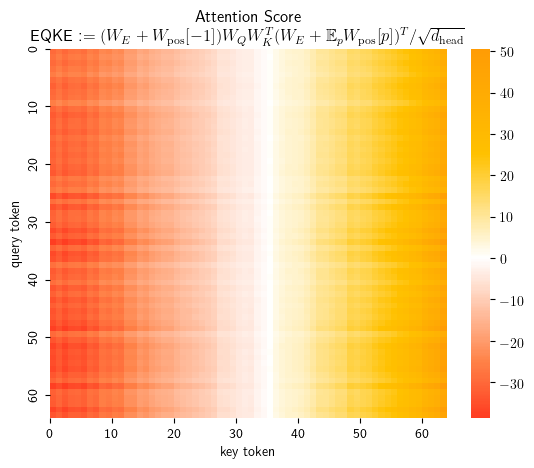

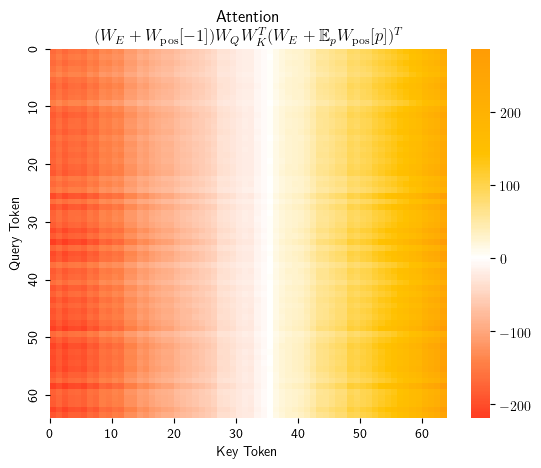

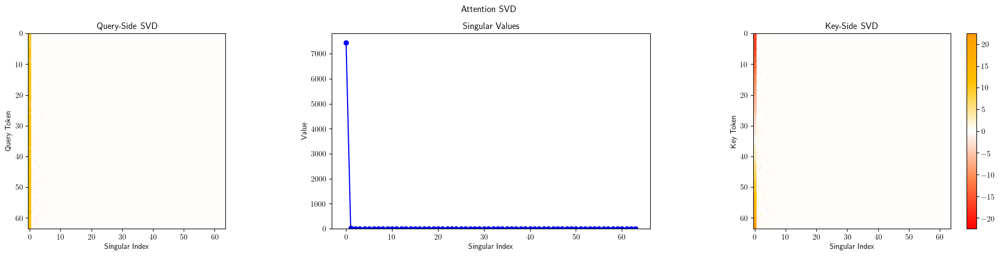

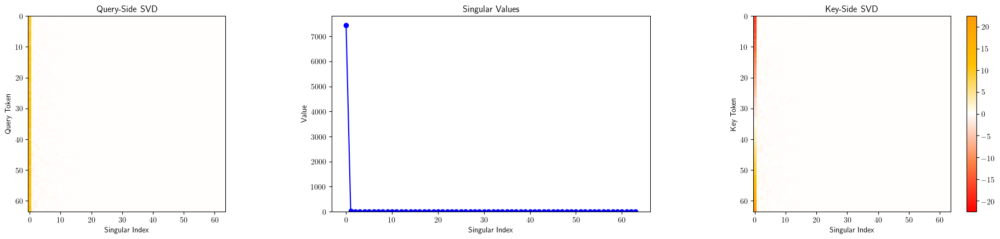

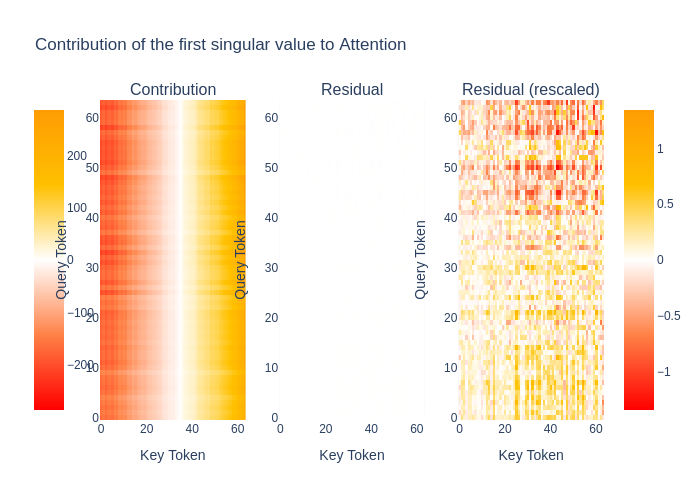

...

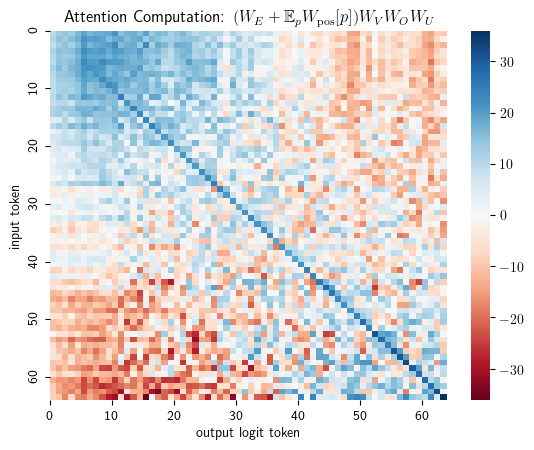

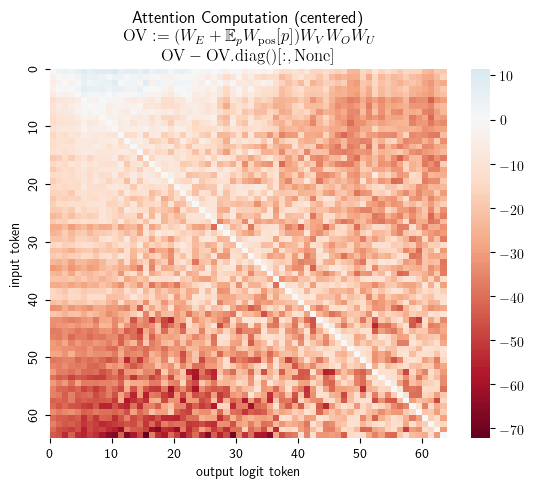

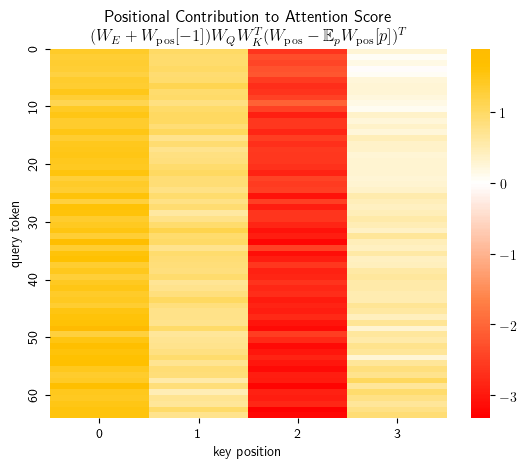

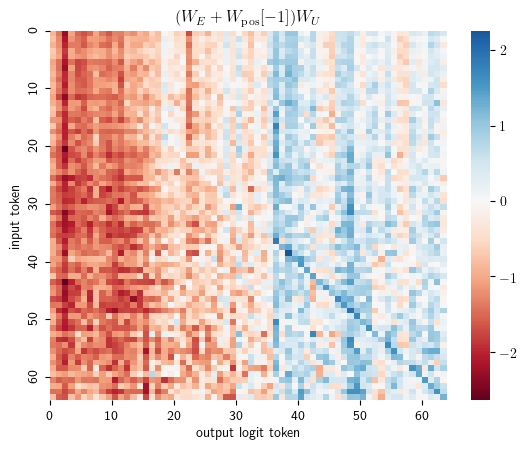

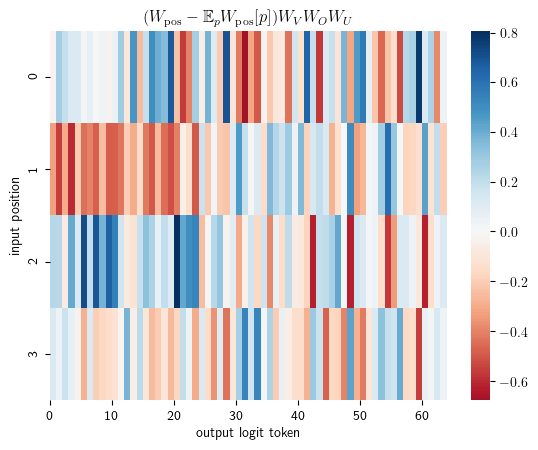

Unused keys: ['EQKE Attention', 'EQKE Directions in Token Space']


In [ ]:
# %%

if DISPLAY_PLOTS:
    figs = display_basic_interpretation(
        model,
        include_uncentered=True,
        OV_colorscale=default_OV_colorscale,
        QK_colorscale=default_QK_colorscale,
        QK_SVD_colorscale=default_QK_SVD_colorscale,
        tok_dtick=10,
        plot_with=PLOT_WITH,
        renderer=RENDERER,
    )
    latex_figures["EQKE"] = figs["EQKE"]
    latex_figures["EVOU"] = figs["EVOU"]
    latex_figures["EVOU-centered"] = figs["EVOU-centered"]
    latex_figures["EQKP"] = figs["EQKP"]
    latex_figures["EQKE-SVD"] = figs["EQKE Attention SVD"]
    del figs["EQKE Attention SVD"]
    PVOU_keys = [k for k in figs.keys() if k.startswith("irrelevant_") and "V" in k]
    assert len(PVOU_keys) == 1, f"PVOU_keys: {PVOU_keys}"
    latex_figures["PVOU"] = figs[PVOU_keys[0]]
    del figs[PVOU_keys[0]]
    EUPU_keys = [k for k in figs.keys() if k.startswith("irrelevant_")]
    assert len(EUPU_keys) == 1, f"EUPU_keys: {EUPU_keys}"
    latex_figures["EUPU"] = figs[EUPU_keys[0]]
    del figs[EUPU_keys[0]]
    latex_figures["PVOU-scatter"] = figs["irrelevant"]
    del figs["irrelevant"]
    unused_keys = [k for k in figs if k not in latex_figures]
    if unused_keys:
        print(f"Unused keys: {unused_keys}")

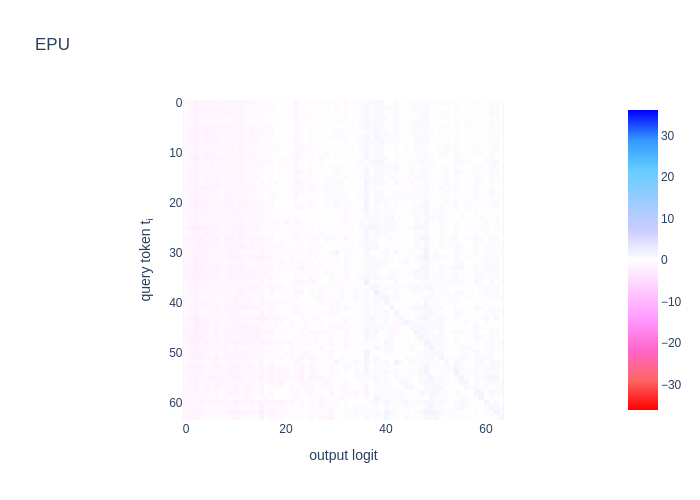

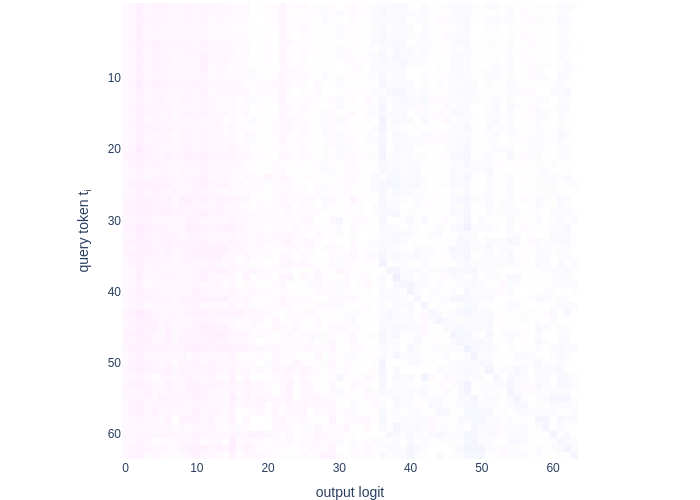

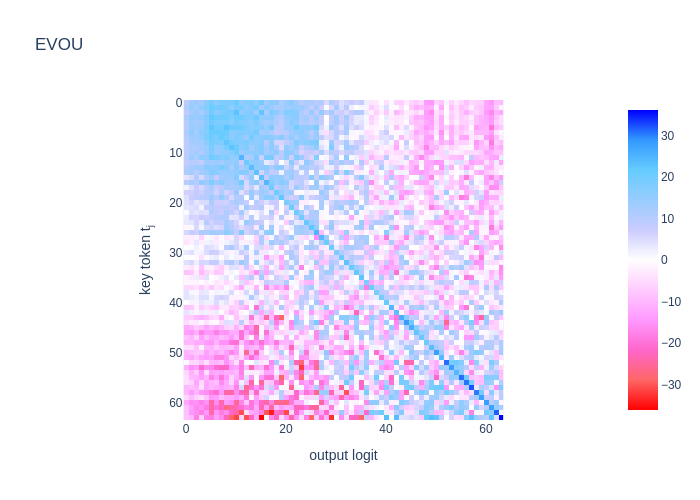

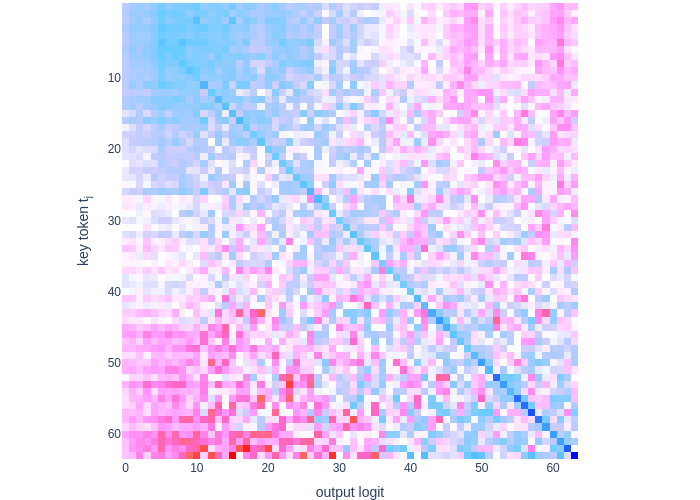

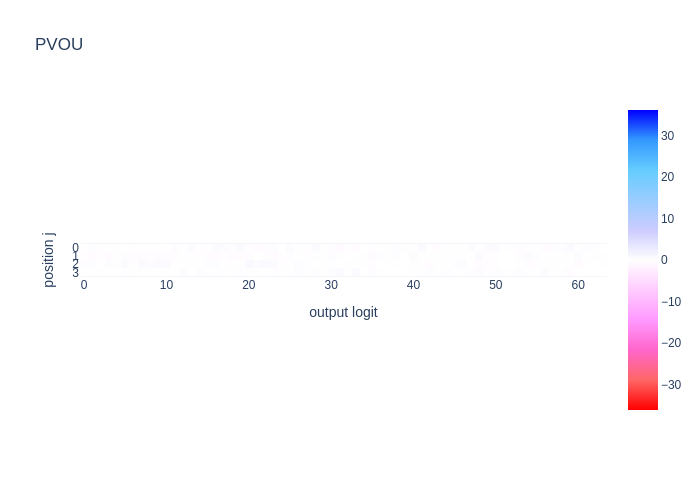

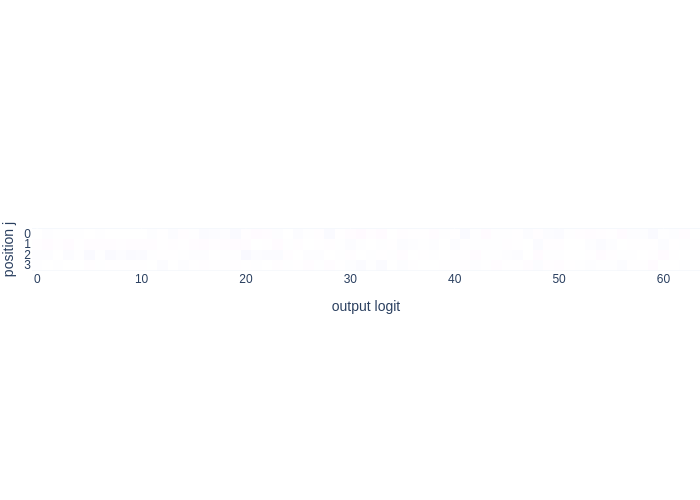

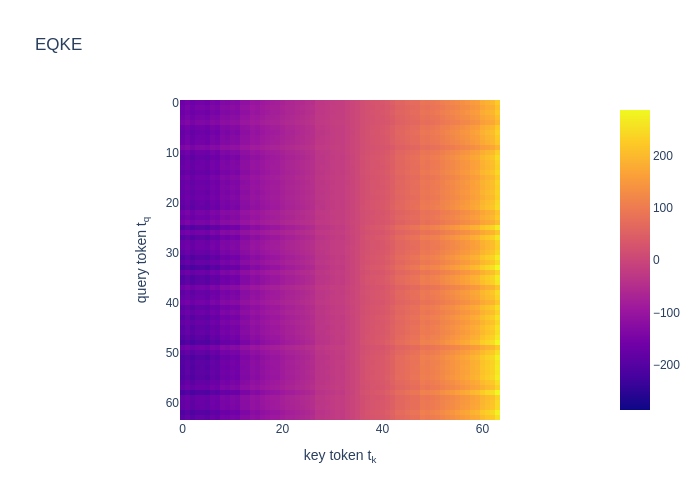

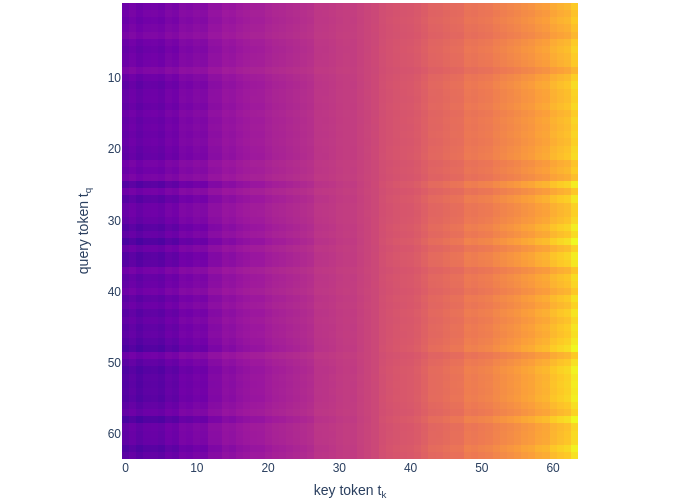

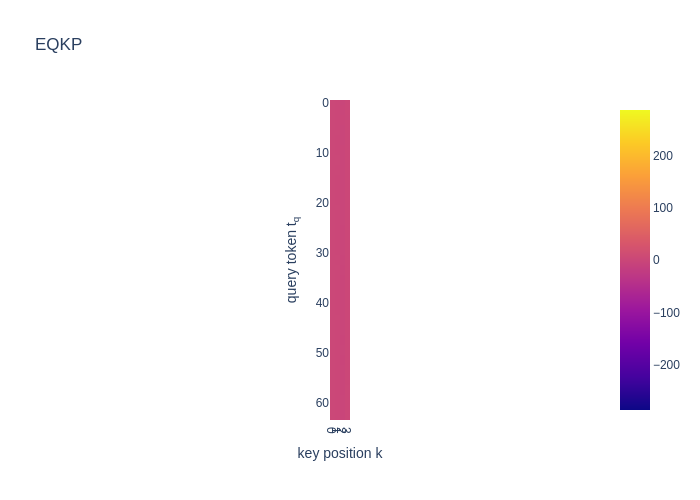

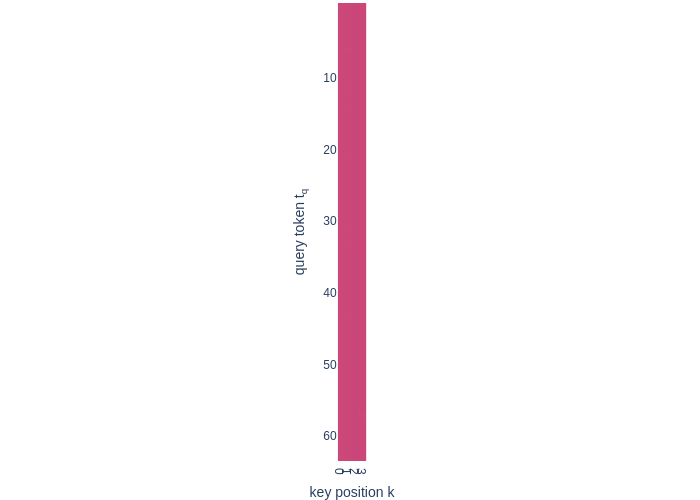

In [ ]:
# %%


# for slides
@torch.no_grad()
def make_FAR_slides_plots(
    model: HookedTransformer,
    OV_colorscale="Picnic_r",
    QK_colorscale="Plasma",
    renderer=None,
):
    W_E, W_pos, W_U, W_V, W_O, W_Q, W_K = (
        model.W_E,
        model.W_pos,
        model.W_U,
        model.W_V[0, 0],
        model.W_O[0, 0],
        model.W_Q[0, 0],
        model.W_K[0, 0],
    )
    EPq = W_E + W_pos[-1]
    EPk = W_E + W_pos.mean(dim=0)
    Pk = W_pos - W_pos.mean(dim=0)
    EPU = EPq @ W_U
    EVOU = EPk @ W_V @ W_O @ W_U
    EVOU_centered = EVOU - EVOU.diag()[:, None]
    PVOU = Pk @ W_V @ W_O @ W_U
    EQKE = EPq @ W_Q @ W_K.T @ EPk.T
    EQKP = EPq @ W_Q @ W_K.T @ Pk.T
    OV_zmax = np.max(
        [EVOU.abs().max().item(), PVOU.abs().max().item(), EPU.abs().max().item()]
    )
    QK_zmax = np.max([EQKE.abs().max().item(), EQKP.abs().max().item()])
    for m, title, colorscale, zmax, labels in (
        (
            EPU,
            "EPU",
            OV_colorscale,
            OV_zmax,
            {"x": "output logit", "y": "query token t<sub>i</sub>"},
        ),
        (
            EVOU,
            "EVOU",
            OV_colorscale,
            OV_zmax,
            {"x": "output logit", "y": "key token t<sub>j</sub>"},
        ),
        (
            PVOU,
            "PVOU",
            OV_colorscale,
            OV_zmax,
            {"x": "output logit", "y": "position j"},
        ),
        (
            EQKE,
            "EQKE",
            QK_colorscale,
            QK_zmax,
            {"x": "key token t<sub>k</sub>", "y": "query token t<sub>q</sub>"},
        ),
        (
            EQKP,
            "EQKP",
            QK_colorscale,
            QK_zmax,
            {"x": "key position k", "y": "query token t<sub>q</sub>"},
        ),
    ):
        fig = px.imshow(
            m,
            title=title,
            color_continuous_scale=colorscale,
            color_continuous_midpoint=0,
            zmin=-zmax,
            zmax=zmax,
            labels=labels,
        )
        fig.show(renderer)
        # remove title
        fig.update_layout(title_text="")
        fig.update(layout_coloraxis_showscale=False)
        # crop whitespace
        fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
        fig.show(renderer)


## %%
if DISPLAY_PLOTS:
    make_FAR_slides_plots(model, renderer=RENDERER)

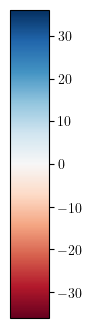

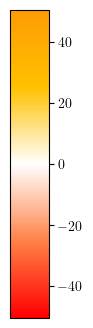

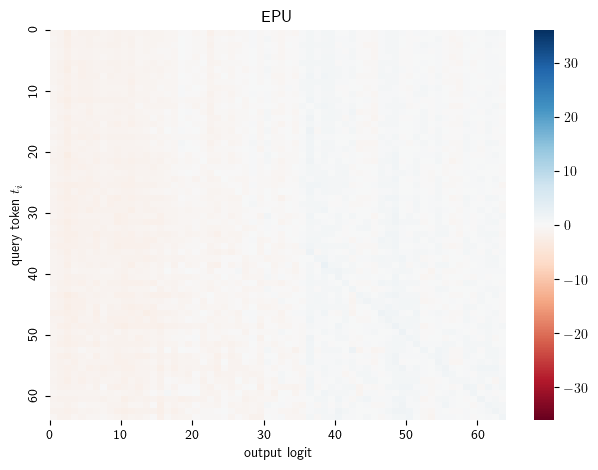

!! Manually removing colorbar from <matplotlib.collections.QuadMesh object at 0x7f7b8fc30ca0>


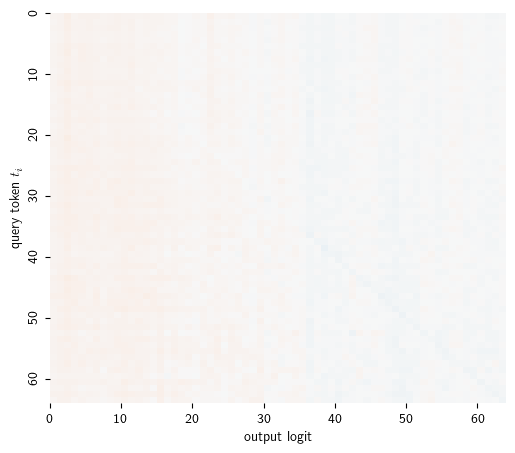

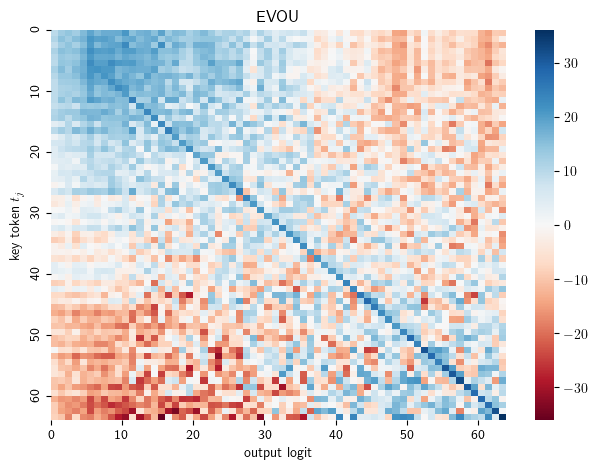

!! Manually removing colorbar from <matplotlib.collections.QuadMesh object at 0x7f7b8fb62a10>


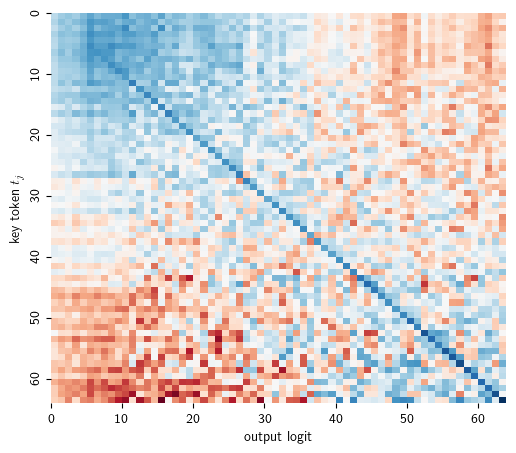

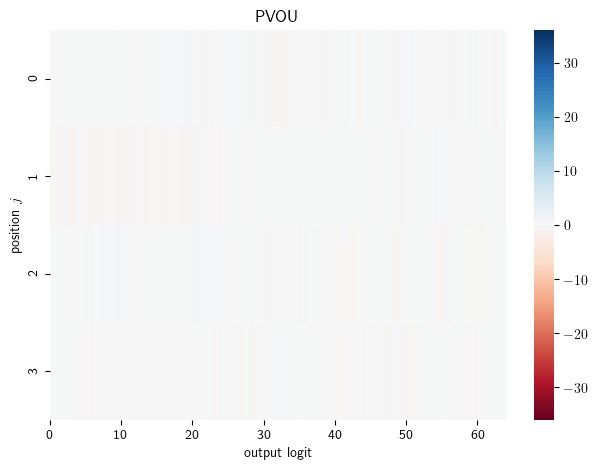

!! Manually removing colorbar from <matplotlib.collections.QuadMesh object at 0x7f7b8fb8ae60>


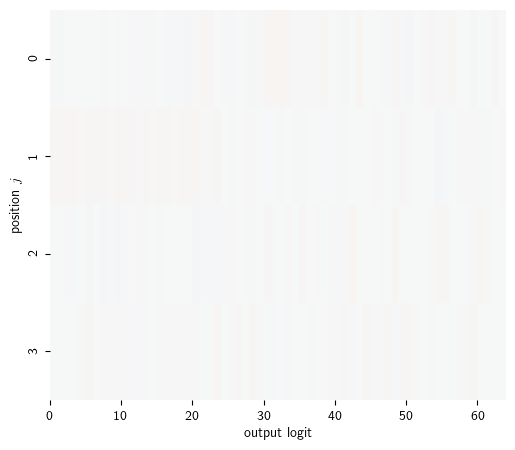

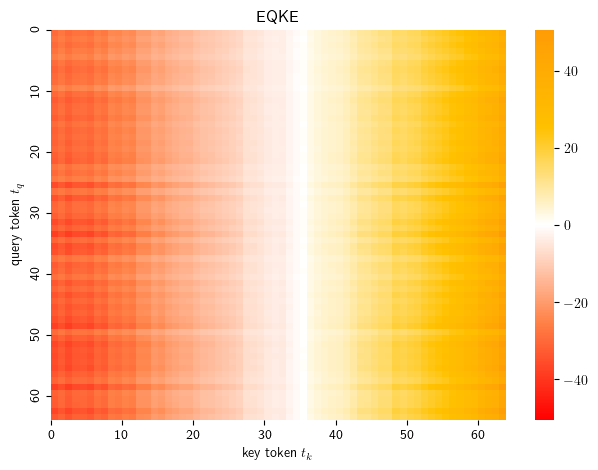

!! Manually removing colorbar from <matplotlib.collections.QuadMesh object at 0x7f7b8f95ca90>


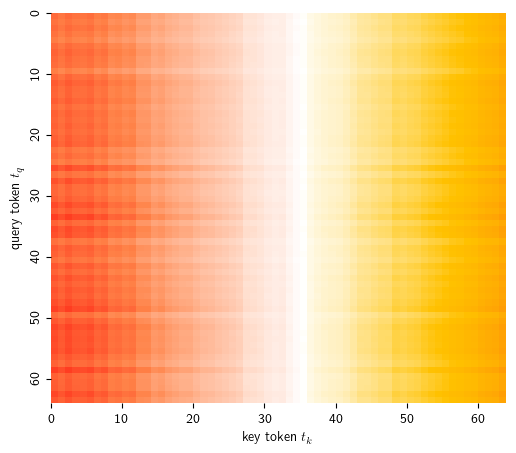

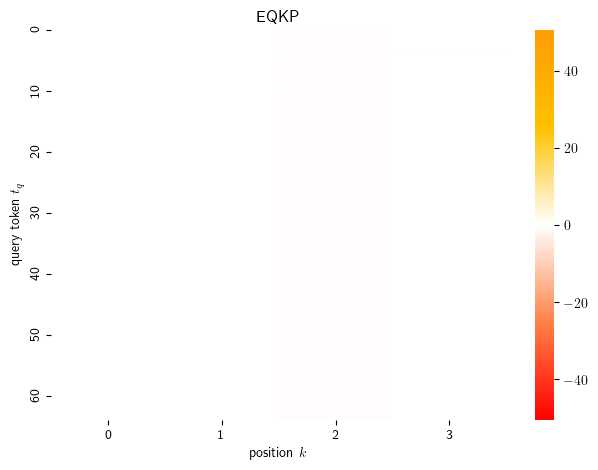

!! Manually removing colorbar from <matplotlib.collections.QuadMesh object at 0x7f7b8f721fc0>


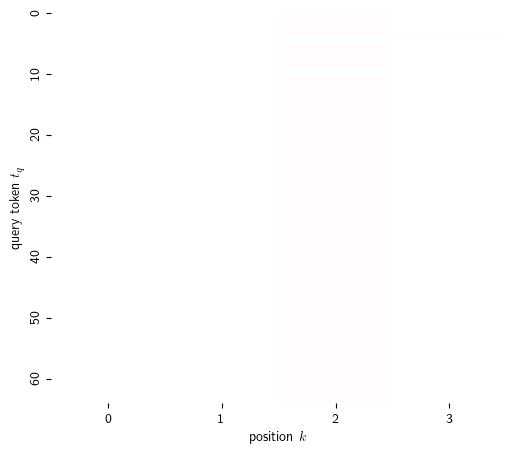

In [ ]:
# %%


# for slides
@torch.no_grad()
def make_better_slides_plots_00(
    model: HookedTransformer,
    OV_colorscale: Colorscale = "Picnic_r",
    QK_colorscale: Colorscale = "Plasma",
    tok_dtick: Optional[int | float] = None,
    pos_dtick: Optional[int | float] = None,
    plot_with: Literal["plotly", "matplotlib"] = PLOT_WITH,
    renderer: Optional[str] = None,
) -> dict[str, go.Figure]:
    W_E, W_pos, W_U, W_V, W_O, W_Q, W_K = (
        model.W_E.cpu(),
        model.W_pos.cpu(),
        model.W_U.cpu(),
        model.W_V[0, 0].cpu(),
        model.W_O[0, 0].cpu(),
        model.W_Q[0, 0].cpu(),
        model.W_K[0, 0].cpu(),
    )
    attn_scale = model.blocks[0].attn.attn_scale
    EPq = W_E + W_pos[-1]
    EPk = W_E + W_pos.mean(dim=0)
    Pk = W_pos - W_pos.mean(dim=0)
    EPU = EPq @ W_U
    EVOU = EPk @ W_V @ W_O @ W_U
    EVOU_centered = EVOU - EVOU.diag()[:, None]
    PVOU = Pk @ W_V @ W_O @ W_U
    EQKE = EPq @ W_Q @ W_K.T @ EPk.T / attn_scale
    EQKP = EPq @ W_Q @ W_K.T @ Pk.T / attn_scale
    OV_zmax = np.max(
        [EVOU.abs().max().item(), PVOU.abs().max().item(), EPU.abs().max().item()]
    )
    QK_zmax = np.max([EQKE.abs().max().item(), EQKP.abs().max().item()])
    results = {}
    for key, zmax, colorscale in (
        ("OV", OV_zmax, OV_colorscale),
        ("QK", QK_zmax, QK_colorscale),
    ):
        match plot_with:
            case "plotly":
                results[f"{key}-colorbar"] = fig = go.Figure(
                    data=go.Heatmap(
                        z=[[0]],
                        colorscale=colorscale,
                        showscale=True,
                        zmin=-zmax,
                        zmax=zmax,
                        zmid=0,
                        colorbar=dict(x=0),
                    )
                )
                fig.add_trace(
                    go.Heatmap(
                        z=[[0]],
                        colorscale="Picnic_r",
                        showscale=False,
                        zmin=-zmax,
                        zmax=zmax,
                        zmid=0,
                    )
                )
                fig.update_layout(
                    width=75,
                    xaxis_showgrid=False,
                    yaxis_showgrid=False,
                    xaxis_zeroline=False,
                    yaxis_zeroline=False,
                    xaxis_visible=False,
                    yaxis_visible=False,
                    margin=dict(l=0, r=0, b=0, t=0),
                )
                fig.show(renderer)
            case "matplotlib":
                cmap = colorscale_to_cmap(colorscale)
                results[f"{key}-colorbar"] = fig = plt.figure(figsize=(0.5, 4))
                norm = matplotlib.colors.Normalize(vmin=-zmax, vmax=zmax)
                cbar = fig.colorbar(
                    cm.ScalarMappable(norm=norm, cmap=cmap),
                    cax=fig.gca(),
                    orientation="vertical",
                )
                # cbar = matplotlib.colorbar.ColorbarBase(
                #     plt.gca(), cmap=cmap, norm=norm, orientation="vertical"
                # )
                plt.show()
    to_latex = (
        lambda s: re.sub(r"([a-zA-Z]*)<sub>([^>]*)</sub>", r"$\1_{\2}$", s)
        .replace("position j", "position $j$")
        .replace("key position k", "position $k$")
    )
    maybe_to_latex = to_latex if plot_with == "matplotlib" else (lambda x: x)
    for m, title, colorscale, zmax, labels, dtick_x, dtick_y in (
        (
            EPU,
            "EPU",
            OV_colorscale,
            OV_zmax,
            {"x": "output logit", "y": "query token t<sub>i</sub>"},
            tok_dtick,
            tok_dtick,
        ),
        (
            EVOU,
            "EVOU",
            OV_colorscale,
            OV_zmax,
            {"x": "output logit", "y": "key token t<sub>j</sub>"},
            tok_dtick,
            tok_dtick,
        ),
        (
            PVOU,
            "PVOU",
            OV_colorscale,
            OV_zmax,
            {"x": "output logit", "y": "position j"},
            tok_dtick,
            pos_dtick,
        ),
        (
            EQKE,
            "EQKE",
            QK_colorscale,
            QK_zmax,
            {"x": "key token t<sub>k</sub>", "y": "query token t<sub>q</sub>"},
            tok_dtick,
            tok_dtick,
        ),
        (
            EQKP,
            "EQKP",
            QK_colorscale,
            QK_zmax,
            {"x": "key position k", "y": "query token t<sub>q</sub>"},
            pos_dtick,
            tok_dtick,
        ),
    ):
        key = title
        results[key] = fig = imshow(
            m,
            title=title,
            colorscale=colorscale,
            zmax=zmax,
            zmin=-zmax,
            xaxis=maybe_to_latex(labels["x"]),
            yaxis=maybe_to_latex(labels["y"]),
            show=False,
            renderer=renderer,
            plot_with=plot_with,
            dtick_x=dtick_x,
            dtick_y=dtick_y,
        )
        match plot_with:
            case "plotly":
                assert isinstance(fig, go.Figure), f"fig: {type(fig)}"
                fig.show(renderer)
                # remove title
                fig.update_layout(title_text="")
                fig.update(layout_coloraxis_showscale=False)
                # crop whitespace
                fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
                trim_plotly_figure(fig)
                fig.show(renderer)
            case "matplotlib":
                assert isinstance(fig, plt.Figure), f"fig: {type(fig)}"
                ax, cbar_ax = fig.axes
                plt.tight_layout()
                plt.show()
                ax.set_title("")
                assert hasattr(cbar_ax, "_colorbar"), cbar_ax
                cbar = cbar_ax._colorbar
                cbar_ax.remove()
                # fig.colorbar(cbar_ax.collections[0], ax=ax, use_gridspec=False).remove()
                for c in ax.get_children():
                    if getattr(c, "colorbar", None) is cbar:
                        print(f"!! Manually removing colorbar from {c}")
                        del c.colorbar
                plt.tight_layout()
                plt.figure(fig)
                plt.show()

    return results


## %%
if DISPLAY_PLOTS:
    figs = make_better_slides_plots_00(
        model,
        OV_colorscale=default_OV_colorscale,
        QK_colorscale=default_QK_colorscale,
        tok_dtick=10,
        plot_with=PLOT_WITH,
        renderer=RENDERER,
    )
    for k, fig in figs.items():
        latex_figures[f"Decomposition-{k}"] = fig

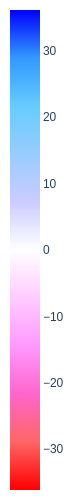

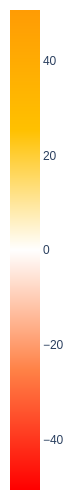

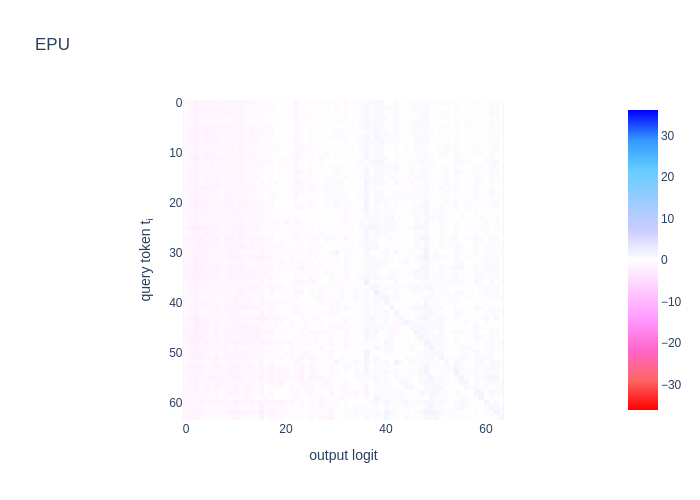

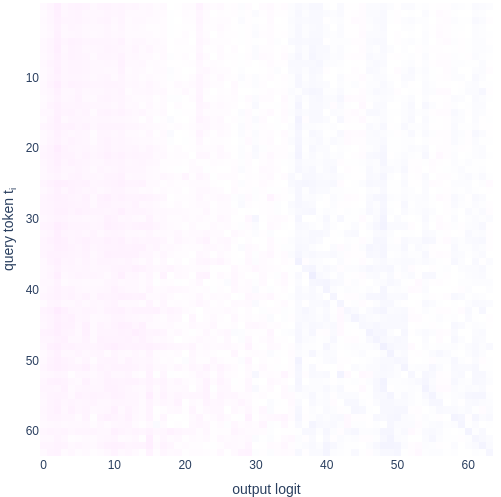

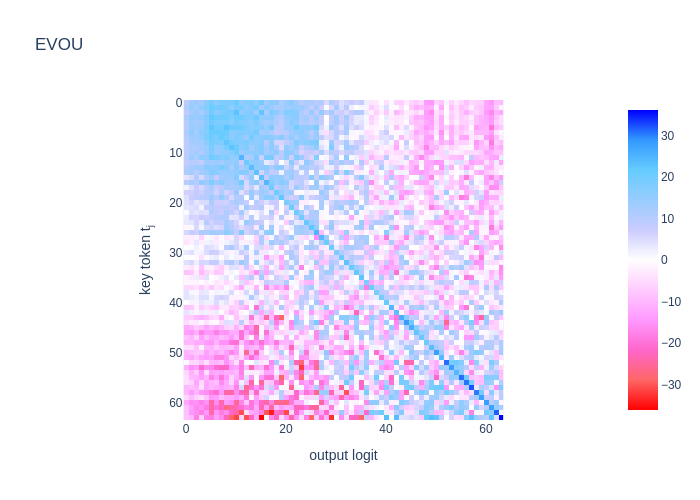

...

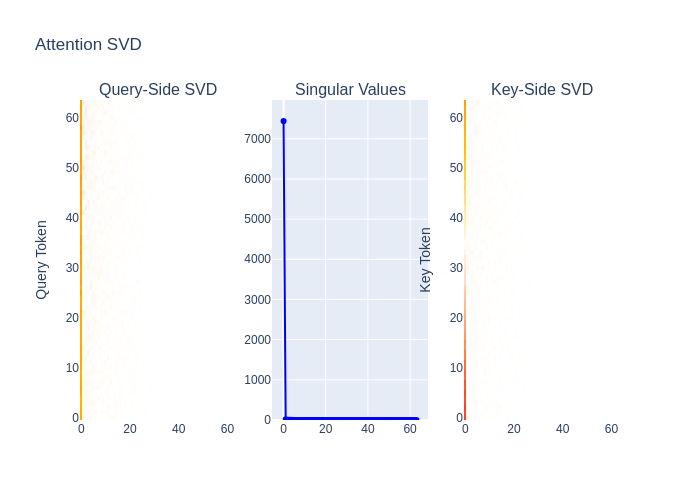

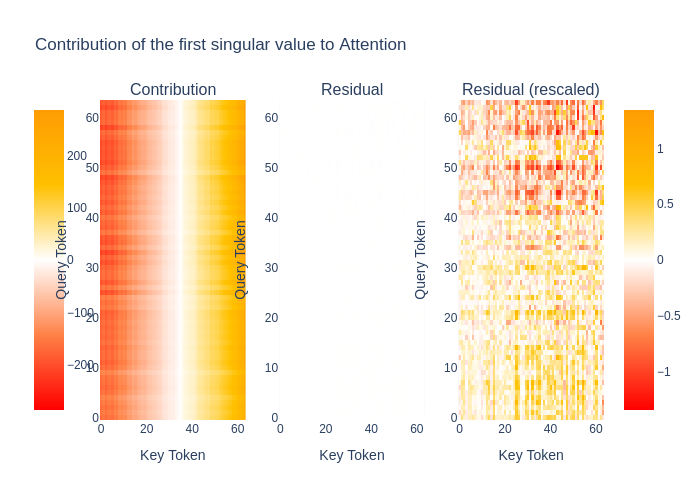

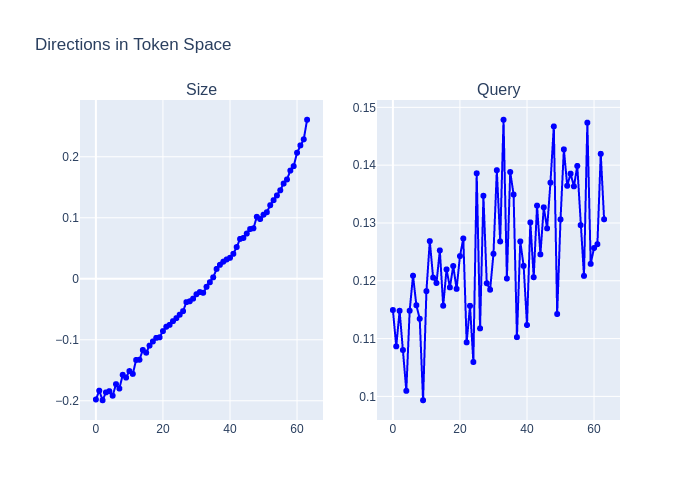

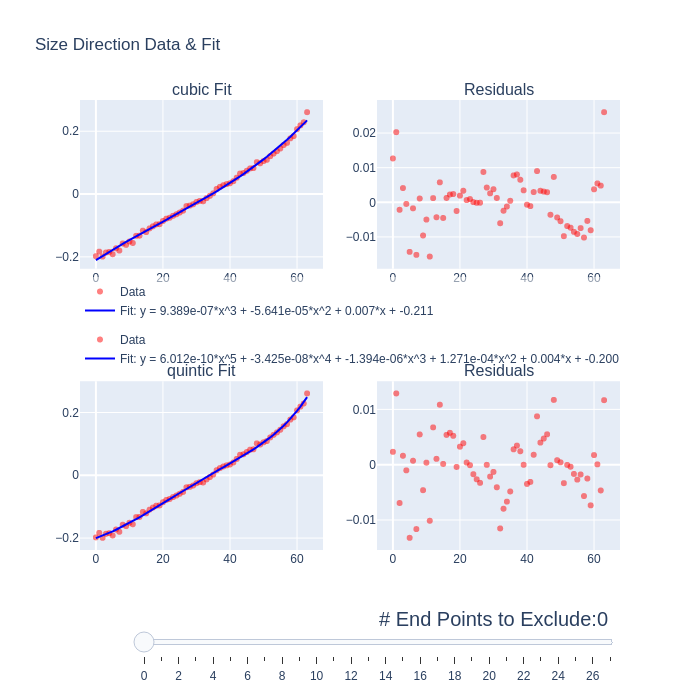

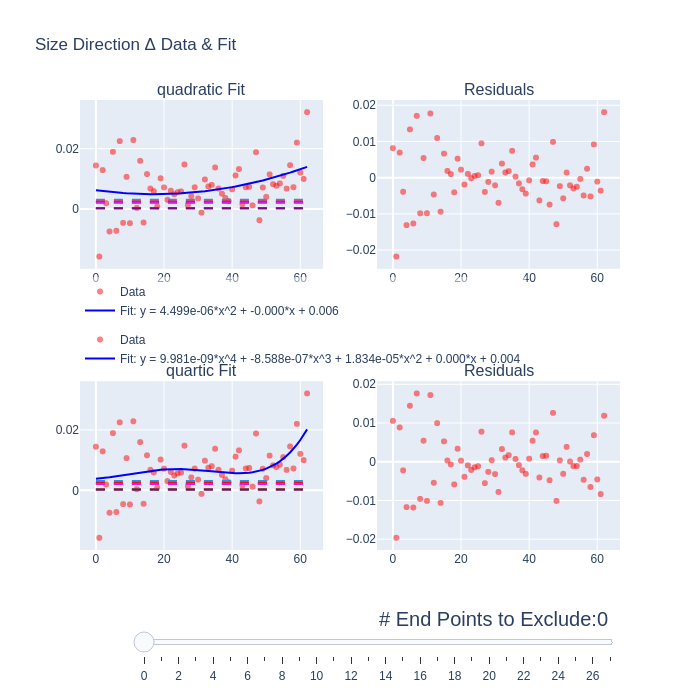

In [ ]:
# %%


# for slides
@torch.no_grad()
def make_better_slides_plots_2024_03_26(
    model: HookedTransformer,
    OV_colorscale: Colorscale = "Picnic_r",
    # [
    #     [0, "#FF8247"],  # Start of the scale
    #     [0.5, "white"],  # Middle of the scale
    #     [1, "#beb2d5"],  # End of the scale
    # ],  # "Picnic_r",
    QK_colorscale: Colorscale = default_QK_colorscale_2024_03_26,
    # [
    #     [0, '#6bd2db'],  # Start of the scale
    #     [0.5, 'white'],  # Middle of the scale
    #     [1, '#ff4e50']  # End of the scale
    # ],
    #  Union[str, list[Tuple[float, str]]] = "PiYG",
    #     [
    #     (0, 'pink'),  # Start of the scale
    #     (0.5, 'white'),  # Middle of the scale
    #     (1, 'blue')  # End of the scale
    # ],#"PiYG",
    renderer: Optional[str] = None,
) -> dict[str, go.Figure]:
    W_E, W_pos, W_U, W_V, W_O, W_Q, W_K = (
        model.W_E.cpu(),
        model.W_pos.cpu(),
        model.W_U.cpu(),
        model.W_V[0, 0].cpu(),
        model.W_O[0, 0].cpu(),
        model.W_Q[0, 0].cpu(),
        model.W_K[0, 0].cpu(),
    )
    attn_scale = model.blocks[0].attn.attn_scale
    EPq = W_E + W_pos[-1]
    EPk = W_E + W_pos.mean(dim=0)
    Pk = W_pos - W_pos.mean(dim=0)
    EPU = EPq @ W_U
    EVOU = EPk @ W_V @ W_O @ W_U
    EVOU_centered = EVOU - EVOU.diag()[:, None]
    PVOU = Pk @ W_V @ W_O @ W_U
    EQKE = EPq @ W_Q @ W_K.T @ EPk.T / attn_scale
    EQKP = EPq @ W_Q @ W_K.T @ Pk.T / attn_scale
    OV_zmax = np.max(
        [EVOU.abs().max().item(), PVOU.abs().max().item(), EPU.abs().max().item()]
    )
    OV_centered_zmax = np.max(
        [
            EVOU_centered.abs().max().item(),
            PVOU.abs().max().item(),
            EPU.abs().max().item(),
        ]
    )
    QK_zmax = np.max([EQKE.abs().max().item(), EQKP.abs().max().item()])
    results = {}
    for key, zmax, colorscale in (
        ("OV", OV_zmax, OV_colorscale),
        ("QK", QK_zmax, QK_colorscale),
    ):
        results[f"{key}-colorbar"] = fig = go.Figure(
            data=go.Heatmap(
                z=[[0]],
                colorscale=colorscale,
                showscale=True,
                zmin=-zmax,
                zmax=zmax,
                zmid=0,
                colorbar=dict(x=0),
            )
        )
        fig.add_trace(
            go.Heatmap(
                z=[[0]],
                colorscale="Picnic_r",
                showscale=False,
                zmin=-zmax,
                zmax=zmax,
                zmid=0,
            )
        )
        fig.update_layout(
            width=75,
            xaxis_showgrid=False,
            yaxis_showgrid=False,
            xaxis_zeroline=False,
            yaxis_zeroline=False,
            xaxis_visible=False,
            yaxis_visible=False,
            margin=dict(l=0, r=0, b=0, t=0),
        )
        fig.show(renderer)
    for m, title, colorscale, zmax, labels in (
        (
            EPU,
            "EPU",
            OV_colorscale,
            OV_zmax,
            {"x": "output logit", "y": "query token t<sub>i</sub>"},
        ),
        (
            EVOU,
            "EVOU",
            OV_colorscale,
            OV_zmax,
            {"x": "output logit", "y": "key token t<sub>j</sub>"},
        ),
        (
            EVOU_centered,
            "EVOU centered",
            OV_colorscale,
            None,
            {"x": "output logit", "y": "key token t<sub>j</sub>"},
        ),
        (
            PVOU,
            "PVOU",
            OV_colorscale,
            OV_zmax,
            {"x": "output logit", "y": "position j"},
        ),
        (
            EQKE,
            "EQKE",
            QK_colorscale,
            QK_zmax,
            {"x": "key token t<sub>k</sub>", "y": "query token t<sub>q</sub>"},
        ),
        (
            EQKP,
            "EQKP",
            QK_colorscale,
            QK_zmax,
            {"x": "key position k", "y": "query token t<sub>q</sub>"},
        ),
    ):
        key = title
        results[key] = fig = px.imshow(
            m,
            title=title,
            color_continuous_scale=colorscale,
            color_continuous_midpoint=0,
            labels=labels,
            **(dict(zmin=-zmax, zmax=zmax) if zmax is not None else {}),
        )
        fig.show(renderer)
        # remove title
        fig.update_layout(title_text="")
        fig.update(layout_coloraxis_showscale=False)
        # crop whitespace
        fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
        trim_plotly_figure(fig)
        fig.show(renderer)
    _, figs = find_size_and_query_direction(
        model, plot_heatmaps=True, renderer=renderer, colorscale=QK_colorscale
    )
    assert figs is not None
    for k, fig in figs.items():
        results[f"EQKE {k}"] = fig
    return results


## %%
if DISPLAY_PLOTS:
    figs = make_better_slides_plots_2024_03_26(model, renderer=RENDERER)
    # for k, fig in figs.items():
    #     latex_figures[f"Decomposition-{k}"] = fig

# %% [markdown]

 # Back of the envelope math for sub-cubic

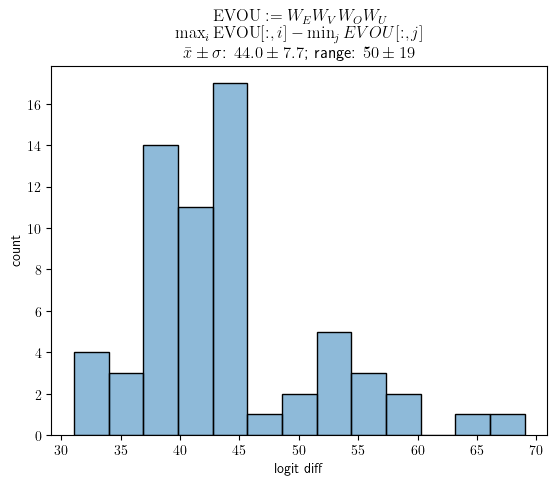

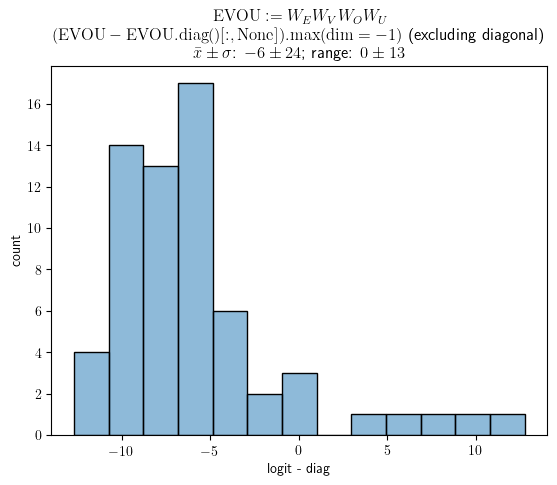

EVOU-hist-min-above-diag: most (100.0%) sequences are <= 18 (based on + 1 std)


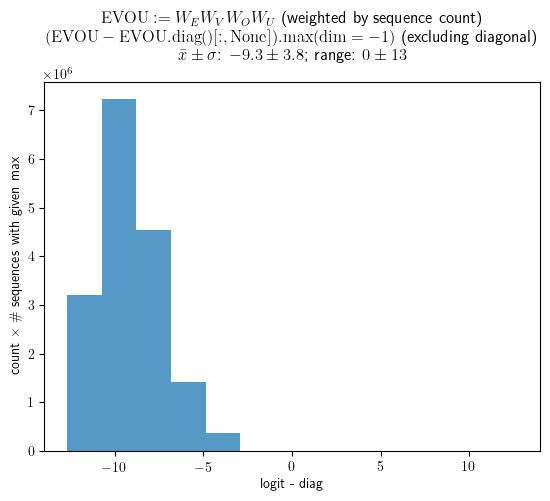

EVOU-hist-min-above-diag-dup-by-seq-count: most (97.73527979850769%) sequences are <= -5 (based on + 1 std)


In [ ]:
# %%

if DISPLAY_PLOTS:
    latex_figures["EVOU-hist-max-row-diff"], max_logit_diff = hist_EVOU_max_logit_diff(
        model, plot_with=PLOT_WITH, renderer=RENDERER
    )
    latex_values["EVOUMeanMaxRowDiffFloat"] = max_logit_diff.mean().item()
    for duplicate_by_sequence_count in [False, True]:
        key = "EVOU-hist-min-above-diag"
        if duplicate_by_sequence_count:
            key += "-dup-by-seq-count"
        latex_figures[key], (max_logit_minus_diag, duplication_factors) = (
            hist_EVOU_max_minus_diag_logit_diff(
                model,
                duplicate_by_sequence_count=duplicate_by_sequence_count,
                plot_with=PLOT_WITH,
                renderer=RENDERER,
            )
        )
        mean = np.average(
            max_logit_minus_diag.numpy(), weights=duplication_factors.numpy()
        )
        std = np.average(
            (max_logit_minus_diag - mean).numpy() ** 2,
            weights=duplication_factors.numpy(),
        )
        num_std = 1
        most_below_value = int(mean + num_std * std)
        frac_below = (
            duplication_factors[max_logit_minus_diag <= most_below_value].sum()
            / duplication_factors.sum()
        ).item()
        value_key = "".join(
            v.capitalize() if v[0] != v[0].capitalize() else v for v in key.split("-")
        )
        latex_values[value_key + "MostBelowValue"] = most_below_value
        latex_values[value_key + "MostBelowValueNumStd"] = num_std
        latex_values[value_key + "MostBelowValueSequenceFracFloat"] = frac_below
        print(
            f"{key}: most ({frac_below*100}%) sequences are <= {most_below_value} (based on + {num_std} std)"
        )

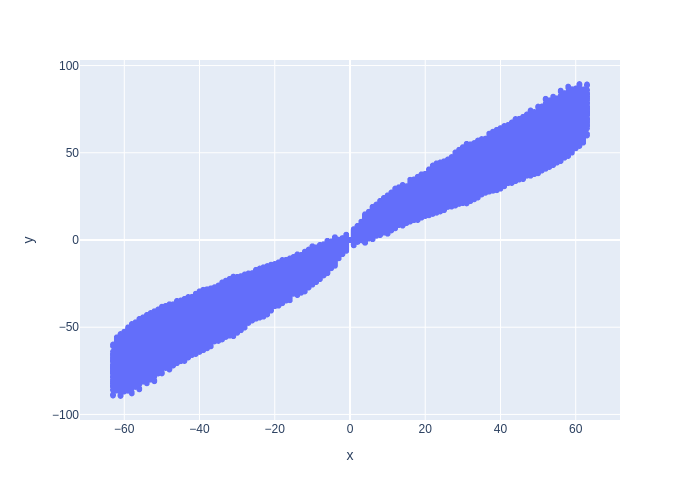

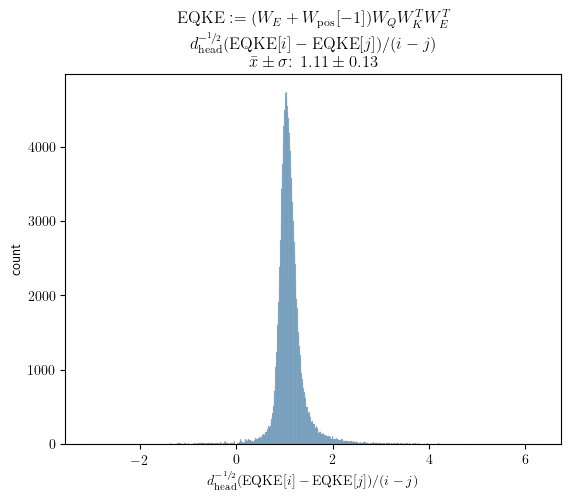

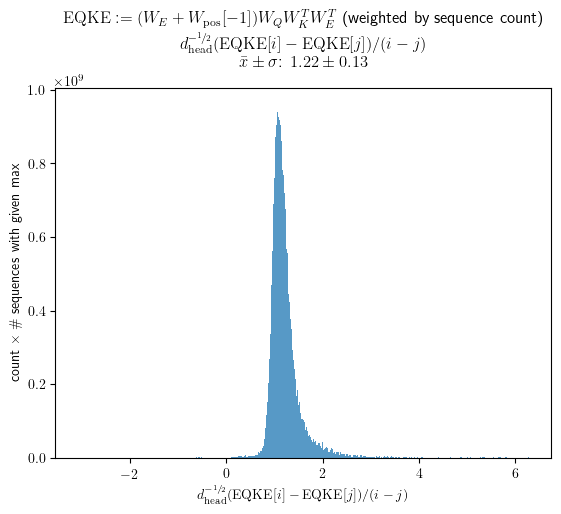

In [ ]:
# %%

if DISPLAY_PLOTS:
    latex_figures["EQKE-scatter-attention-difference-vs-gap"] = (
        scatter_attention_difference_vs_gap(
            model, plot_with="plotly", renderer=RENDERER
        )  # this one is too big to export to TeX
    )
    for duplicate_by_sequence_count in [False, True]:
        fig, (flat_diffs, duplication_factors) = hist_attention_difference_over_gap(
            model,
            duplicate_by_sequence_count=duplicate_by_sequence_count,
            plot_with=PLOT_WITH,
            renderer=RENDERER,
        )
        key = "EQKE-hist-attention-difference-over-gap" + (
            "-dup-by-seq-count" if duplicate_by_sequence_count else ""
        )
        latex_figures[key] = fig
        mean = np.average(flat_diffs.numpy(), weights=duplication_factors.numpy())
        std = np.average(
            (flat_diffs - mean).numpy() ** 2,
            weights=duplication_factors.numpy(),
        )
        value_key = "".join(
            v.capitalize() if v[0] != v[0].capitalize() else v for v in key.split("-")
        )
        latex_values[value_key + "MeanFloat"] = mean
        latex_values[value_key + "StdFloat"] = std

# %% [markdown]

 # Size-Query analysis

 We find the size direction and the query direction, and approximate the QK computation using only these vectors.  Then we'll look at the error terms.

 We compute as follows:
 $$
 \begin{align*}
 \overline{W_\text{pos}} & := W_\text{pos}\text{.mean}(\text{dim}=0) \\
 \widetilde{E_q} & := W_E + W_\text{pos}[-1] \\
 \widetilde{E_k} & := W_E + \overline{W_\text{pos}} \\
 \text{EQKE}_p
 & := \widetilde{E_q}W_QW_K^T \widetilde{E_k}^T + \widetilde{E_q}W_QW_K^T(W_{\text{pos}}[p] - \overline{W_\text{pos}})^T \\
 & = \widetilde{E_q}W_QW_K^T \widetilde{E_k}^T + \text{EQKE\_pos\_err}
 \end{align*}
 $$
 We can decompose $\widetilde{E_k}$ as a sum of a rank 1 matrix in the given key direction and a matrix orthogonal to the key direction, say $E_k = E_{k,\text{key}} + E_{k,\text{key}}^\perp$.
 We can decompose $\widetilde{E_q}$ as a sum of a rank 1 matrix in the given query direction and a matrix orthogonal to the query direction, say $E_q = E_{q,\text{query}} + E_{q,\text{query}}^\perp$.
 We can decompose $E_{k,\text{key}}^\perp$, $E_{q,\text{query}}^\perp$, $W_Q$, and $W_K$ as sums of rank 1 matrices in the second key direction, second query direction, W\_Q\_U, and W\_K\_U, respectively.
 $$
 \begin{align*}
 E_{k,\text{key}}^\perp & = E_{k,\text{key},\text{second}} + E_{k,\text{key},\text{second}}^\perp \\
 E_{q,\text{query}}^\perp & = E_{q,\text{query},\text{second}} + E_{q,\text{query},\text{second}}^\perp \\
 W_Q & = W_{Q,\text{U}} + W_{Q,\text{U}}^\perp \\
 W_K & = W_{K,\text{U}} + W_{K,\text{U}}^\perp
 \end{align*}
 $$
 Then we can write
 $$
 \begin{align*}
 \text{EQKE}_p - \text{EQKE\_pos\_err}
 & = \widetilde{E_q}W_QW_K^T \widetilde{E_k}^T \\
 & = E_{k,\text{key}}W_QW_K^T E_{q,\text{query}}^T \\
 & \phantom{{}={}}{} + E_{k,\text{key}}W_QW_K^T {E_{q,\text{query}}^\perp}^T + E_{k,\text{key}}^\perp W_QW_K^T E_{q,\text{query}}^T \\
 & \phantom{{}={}}{} + E_{k,\text{key},\text{second}}W_QW_K^T E_{q,\text{query},\text{second}}^T \\
 & \phantom{{}={}}{} + E_{k,\text{key},\text{second}}W_QW_K^T {E_{q,\text{query},\text{second}}^\perp}^T + E_{k,\text{key},\text{second}}^\perp W_QW_K^T E_{q,\text{query},\text{second}}^T \\
 & \phantom{{}={}}{} + E_{k,\text{key},\text{second}}^\perp W_{Q,\text{U}}W_{K,\text{U}}^T {E_{q,\text{query},\text{second}}^\perp}^T \\
 & \phantom{{}={}}{} + E_{k,\text{key},\text{second}}^\perp W_{Q,\text{U}}^\perp W_{K,\text{U}}^T {E_{q,\text{query},\text{second}}^\perp}^T + E_{k,\text{key},\text{second}}^\perp W_{Q,\text{U}} {W_{K,\text{U}}^\perp}^T {E_{q,\text{query},\text{second}}^\perp}^T \\
 & \phantom{{}={}}{} + E_{k,\text{key},\text{second}}^\perp W_{Q,\text{U}}^\perp {W_{K,\text{U}}^\perp}^T {E_{q,\text{query},\text{second}}^\perp}^T
 \end{align*}
 $$
 Except for the last line, all of these components are rank 1 matrices, and we can compute them efficiently.
 We compute an upper bound on what the final component can contribute to differences in elements in the same row:
 Since $\sigma_1(M) = \sup_x \| M x \| / \|x\|$, considering vectors with one 1, one -1, and zero elsewhere, the maximum difference between elements in a row is $\sqrt{2} \sigma_1(M)$.
 This is the value we return, computing an upper bound on the first singular value by multiplying the first singular values of each matrix.

In [ ]:
# %%

# This stuff is old, probably delete
# Define
# - $W_{E,\text{qerr}}=(W_E - \text{query} W_E)$
# - $W_{E,\text{kerr}}=(W_E - \text{size} W_E)$
# - $\overline{W_{\text{pos}}} = W_{\text{pos}}.\text{mean}(\text{dim}=0)$
# - $W_{\text{pos},\text{err}} = W_{\text{pos}} - \overline{W_\text{pos}}$
# $$\begin{align*}
# & \phantom{{}={}} (W_E + W_\text{pos}[-1])W_Q W_K^T (W_E + W_\text{pos})^T \\
# & = (\text{query} W_E + W_\text{pos}[-1] + W_{E,\text{qerr}})W_Q W_K^T (\text{size}W_E + \overline{W_\text{pos}} + W_{E,\text{kerr}} + W_{\text{pos},\text{err}})^T \\
# & = (\text{query} W_E + W_\text{pos}[-1])W_Q W_K^T(\text{size}W_E + \overline{W_\text{pos}}) \\
# & \phantom{{}={}}{} + W_{E,\text{qerr}}W_Q W_K^T (W_{E,\text{kerr}} + W_{\text{pos},\text{err}})^T \\
# & \phantom{{}={}}{} + (\text{query} W_E + W_\text{pos}[-1])W_Q W_K^T (W_{E,\text{kerr}} + W_{\text{pos},\text{err}})^T \\
# & \phantom{{}={}}{} + W_{E,\text{qerr}}W_Q W_K^T (\text{size}W_E + \overline{W_\text{pos}})^T \\
# \end{align*}$$

In [ ]:
# %%

(
    size_direction,
    query_direction,
    size_query_singular_value,
), _ = find_size_and_query_direction(model)
(second_key_direction, second_key_singular_value), (
    second_query_direction,
    second_query_singular_value,
) = find_second_singular_contributions(model, size_direction, query_direction)
(W_Q_U, W_Q_S, W_Q_Vh), (W_Q_contrib, W_Q_err) = split_svd_contributions(
    model.W_Q[0, 0]
)
(W_K_U, W_K_S, W_K_Vh), (W_K_contrib, W_K_err) = split_svd_contributions(
    model.W_K[0, 0]
)
(
    (EQKE_query_key, err_accumulator),
    EQKE_pos_err,
    (err_upper_bound, (W_E_query_err2, W_Q_err, W_K_errT, W_E_key_err2T)),
) = quadratic.decompose_EQKE_error_quadratic(
    model,
    key_direction=size_direction,
    query_direction=query_direction,
    second_key_direction=second_key_direction,
    second_query_direction=second_query_direction,
    W_Q_U=W_Q_U,
    W_K_U=W_K_U,
    sanity_check=True,
)

# %% [markdown]

 # more plots

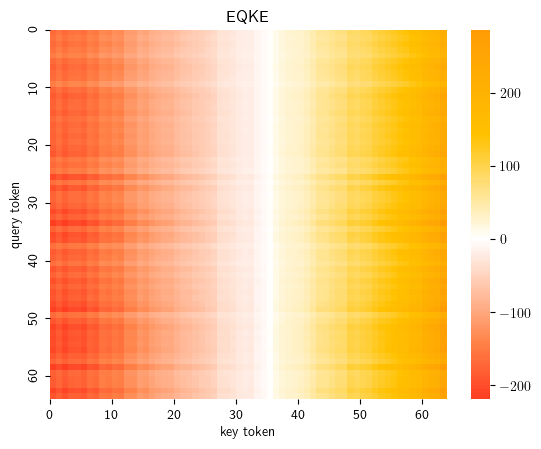

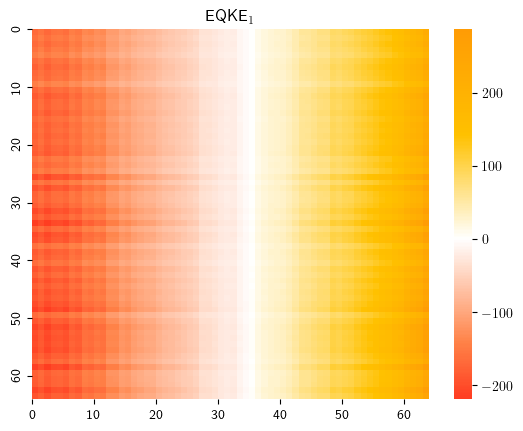

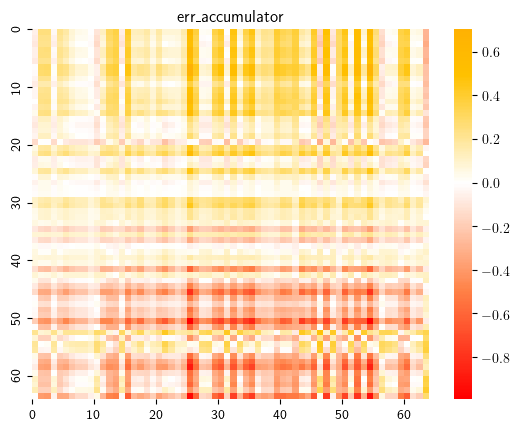

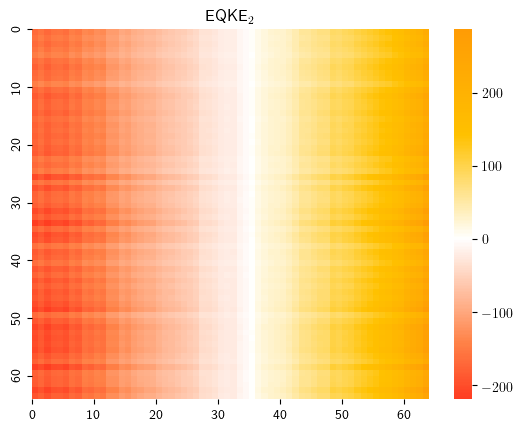

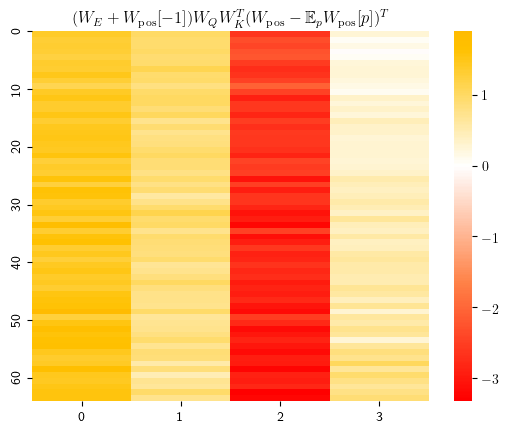

EQKEErrMaxRowDiffFloat: 1.8400928974151611
EQKEErrMaxAbsFloat: 1.0027103424072266
EQKEErrMeanDimZeroNormFloat: 0.02467716485261917


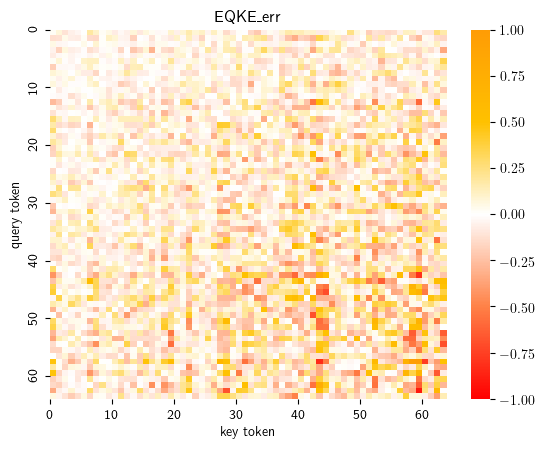

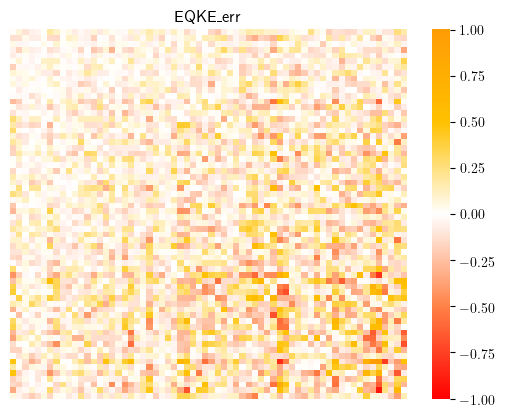

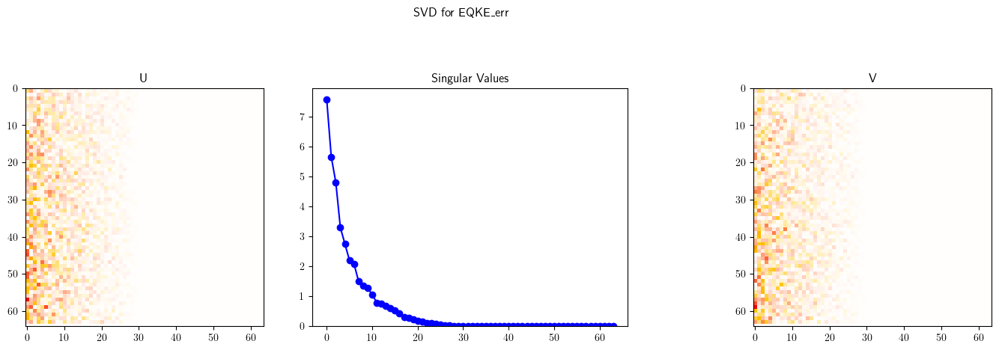

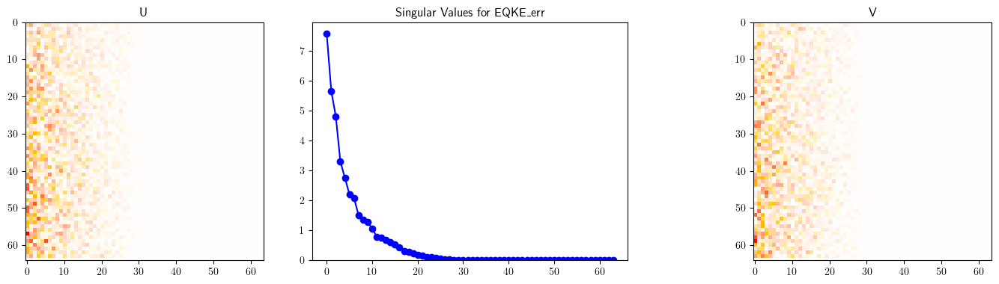

σ₁(EQKE_err)√2 = 7.58729887008667√2 = 10.730060577392578
singular values: [3.950699806213379, 1.4305466413497925, 1.3787505626678467, 3.905992269515991]
√2∏σ₁ = 30.4363896426074√2 = 43.04355502224738


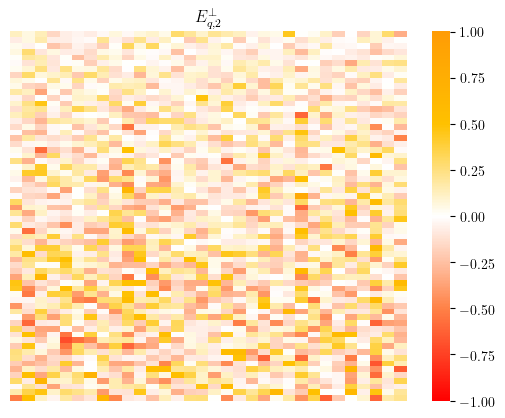

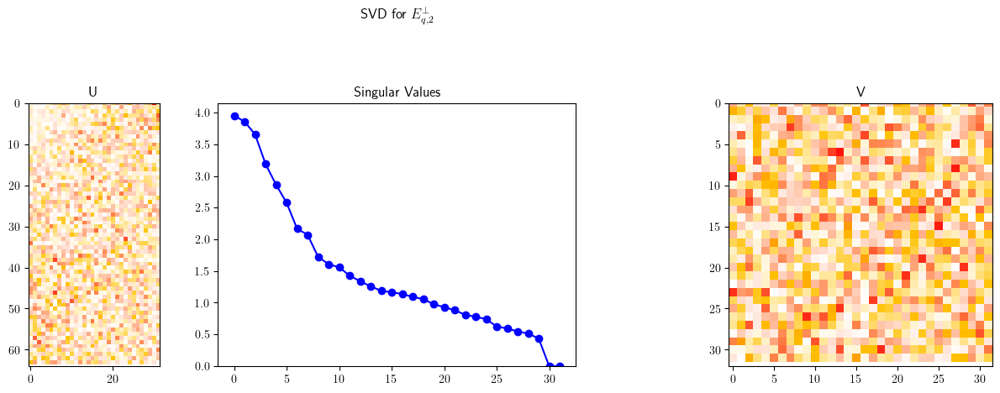

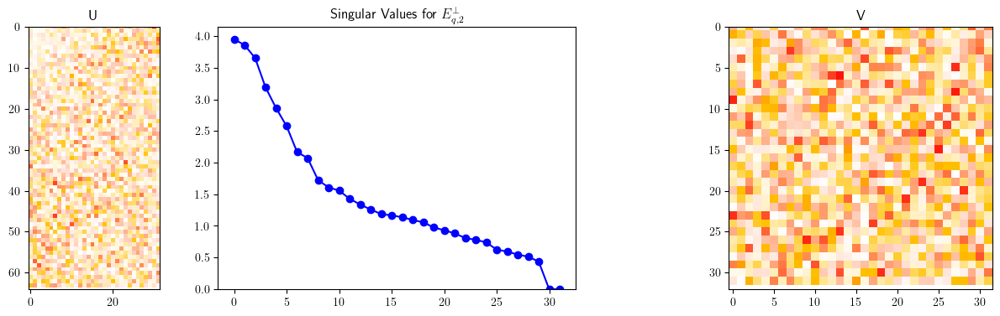

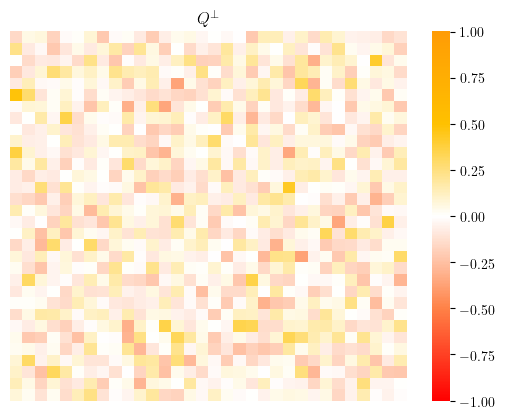

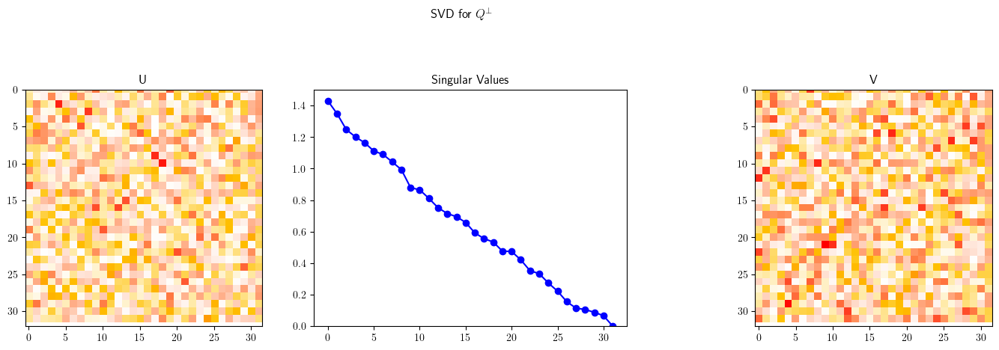

...

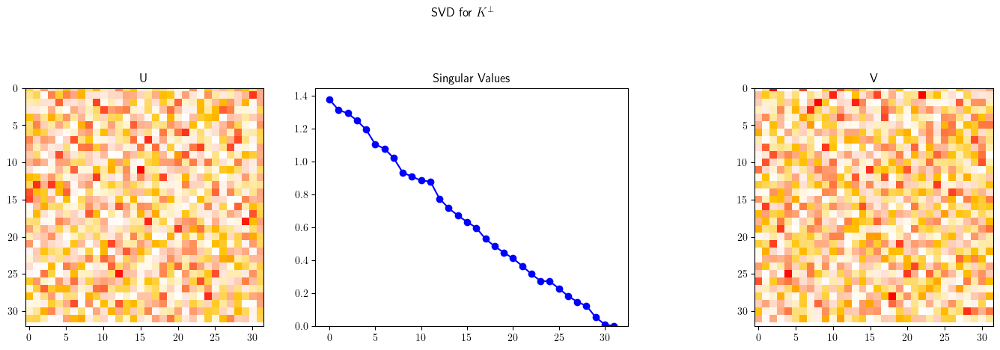

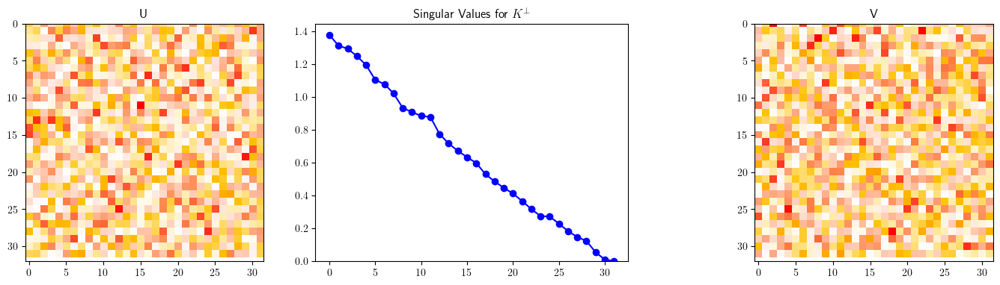

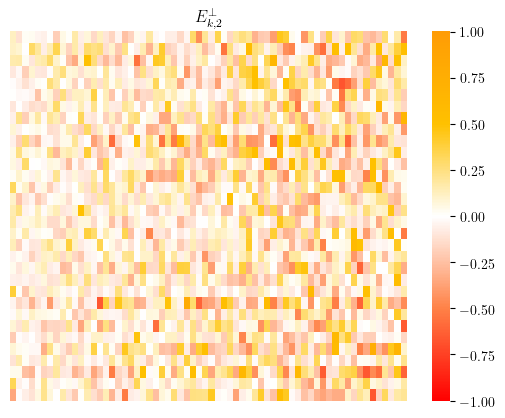

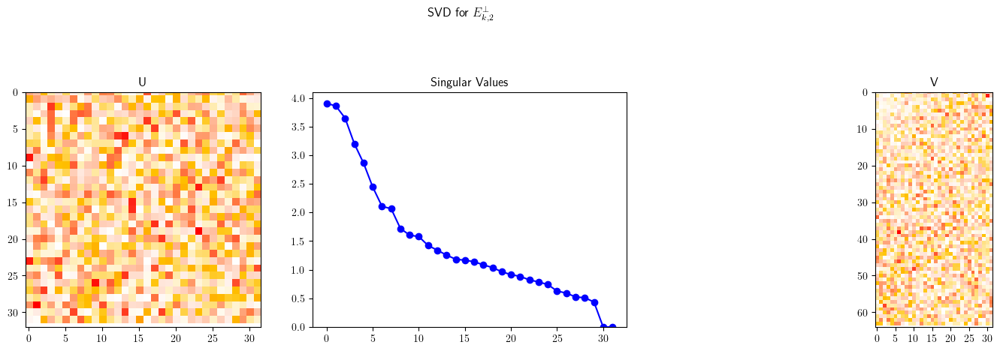

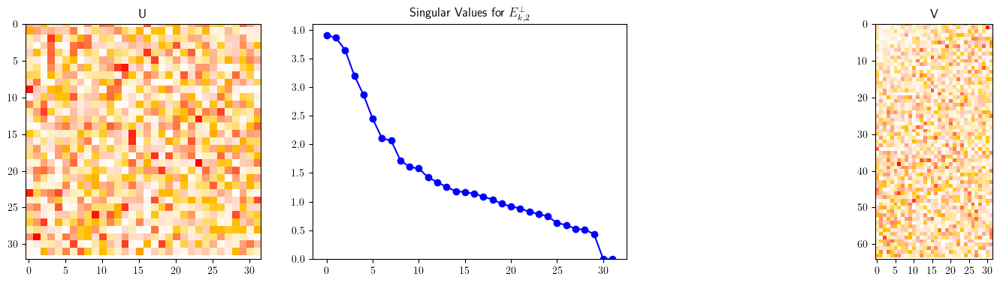

σf₁(EQKE_err)√2 = 12.243626594543457√2 = 17.315101623535156
singular fro values: [10.17265510559082, 4.345831394195557, 4.322939395904541, 10.108353614807129]
√2∏σf₁ = 1931.8204833546513√2 = 2732.006727630296
err_upper_bound: 2732.006831272314


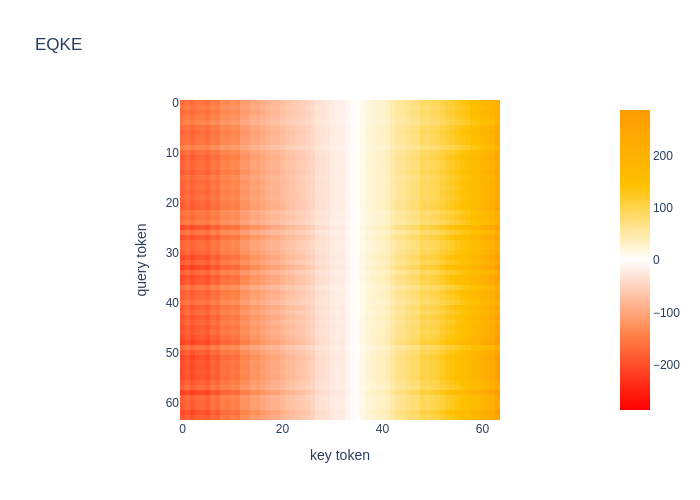

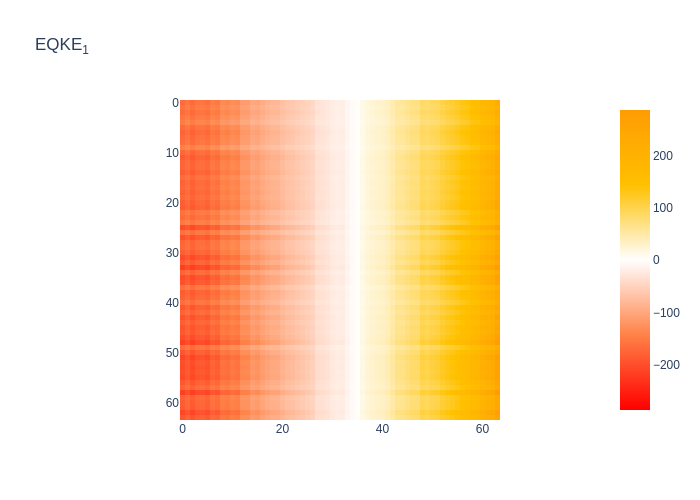

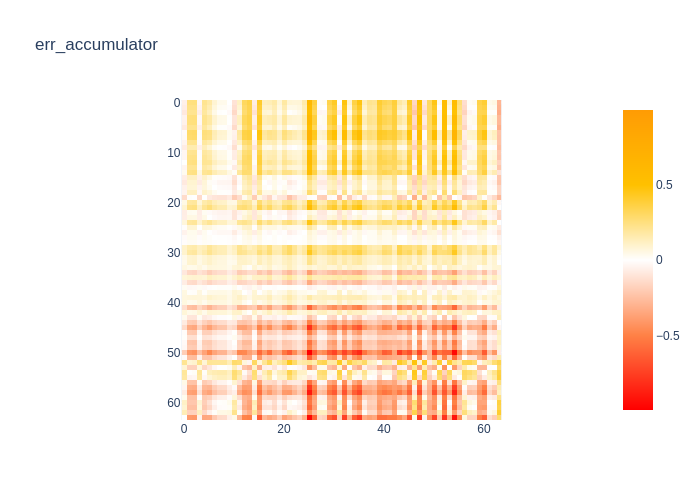

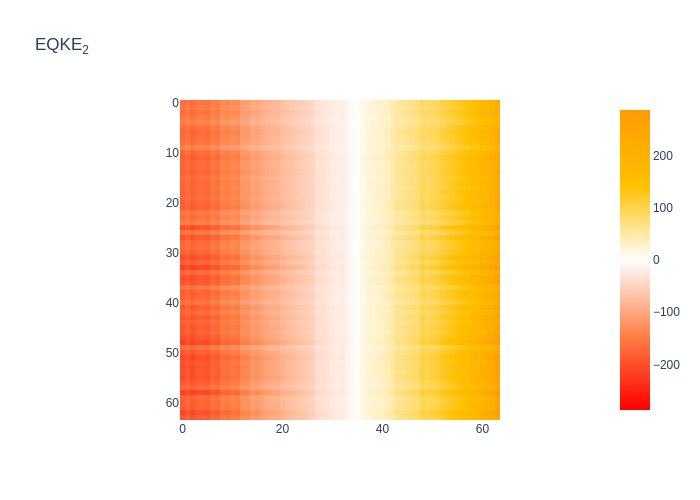

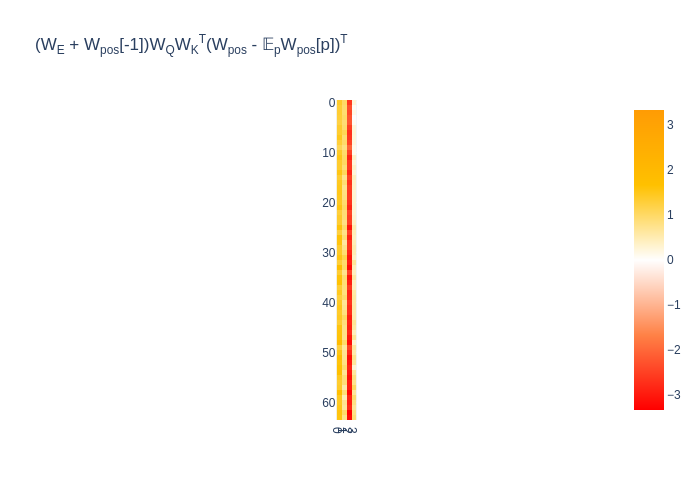

EQKEErrMaxRowDiffFloat: 1.8400928974151611
EQKEErrMaxAbsFloat: 1.0027103424072266
EQKEErrMeanDimZeroNormFloat: 0.02467716485261917


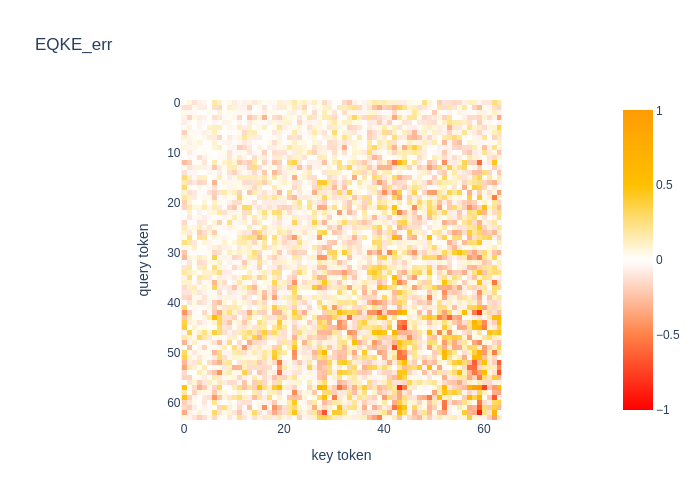

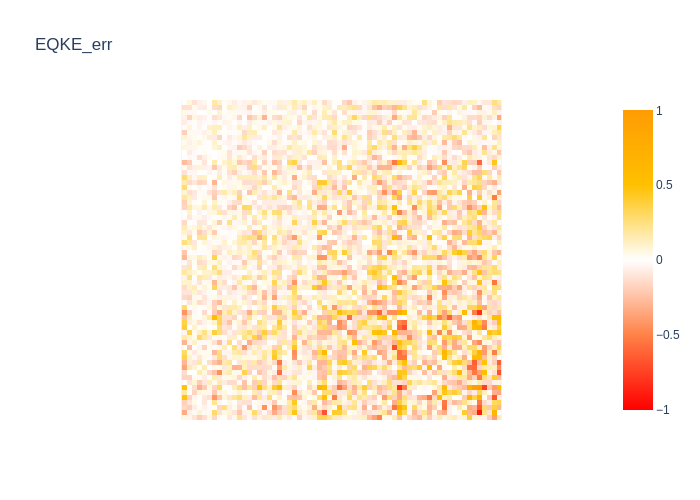

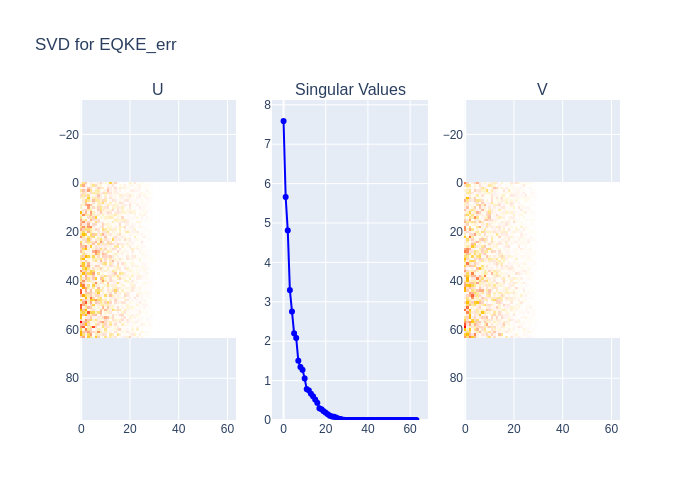

σ₁(EQKE_err)√2 = 7.58729887008667√2 = 10.730060577392578
singular values: [3.950699806213379, 1.4305466413497925, 1.3787505626678467, 3.905992269515991]
√2∏σ₁ = 30.4363896426074√2 = 43.04355502224738


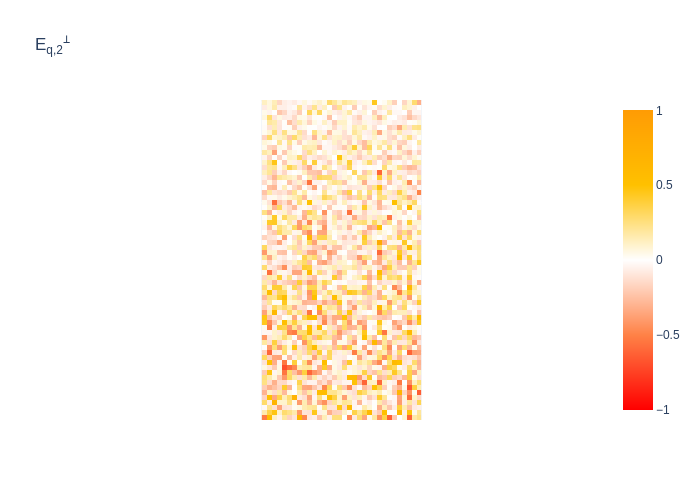

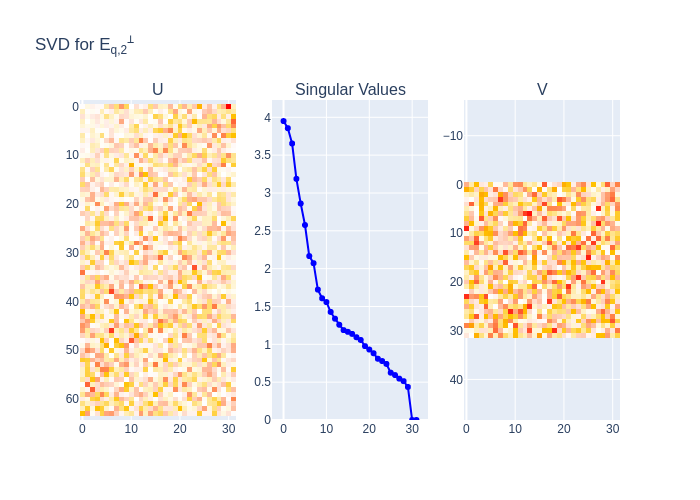

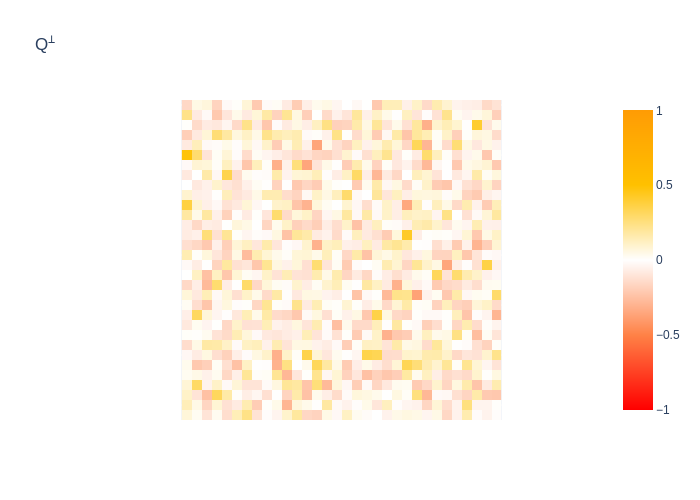

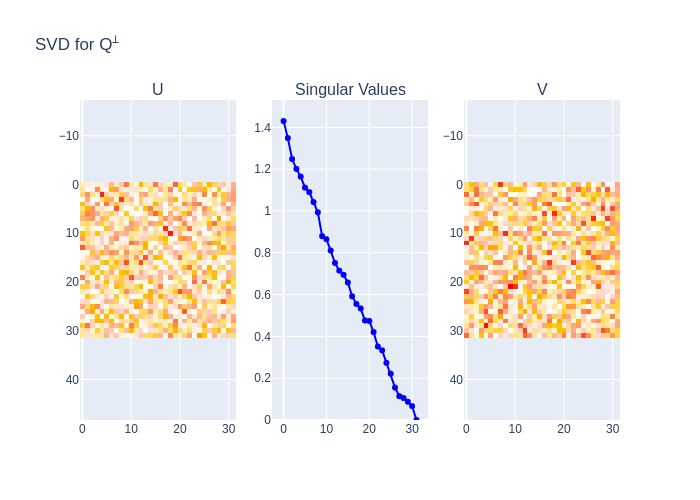

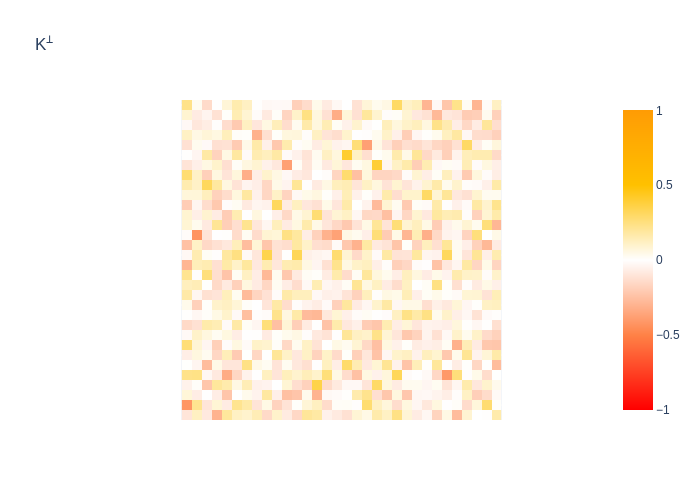

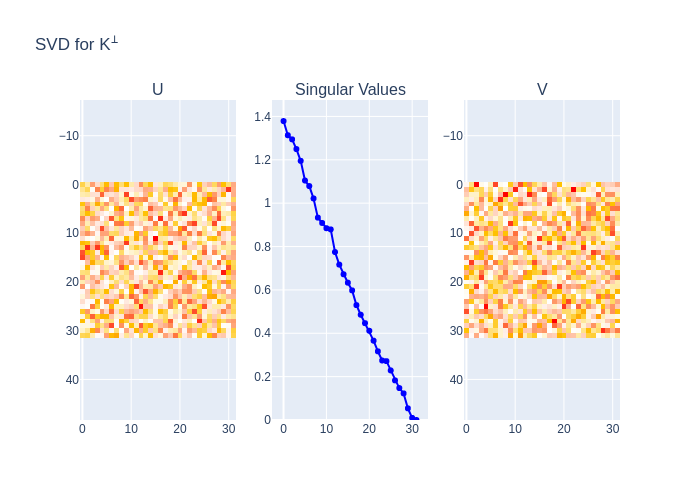

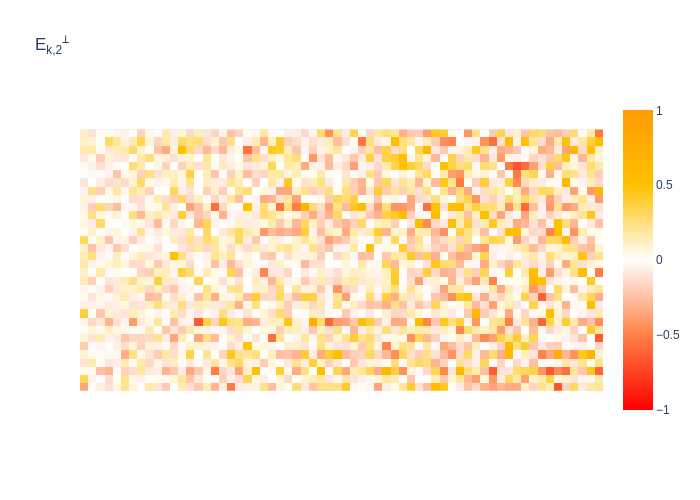

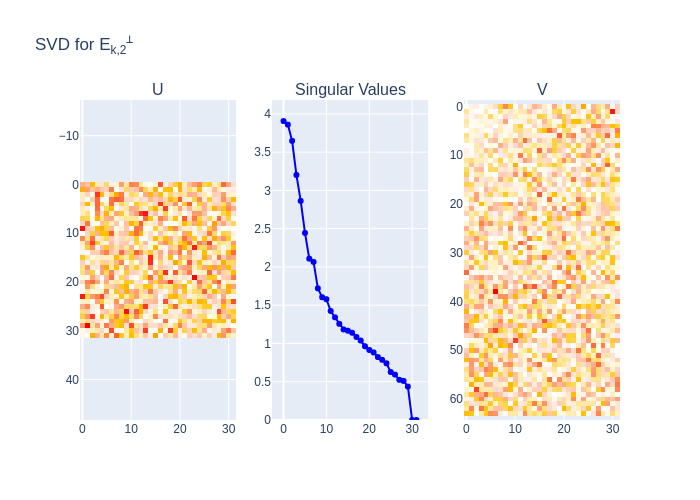

σf₁(EQKE_err)√2 = 12.243626594543457√2 = 17.315101623535156
singular fro values: [10.17265510559082, 4.345831394195557, 4.322939395904541, 10.108353614807129]
√2∏σf₁ = 1931.8204833546513√2 = 2732.006727630296
err_upper_bound: 2732.006831272314
Unused figure keys: ['EQKE1', 'err_accumulator', 'EQKE2', 'EQKE_pos_err', 'EQKE_err_noticks', 'WEqqPerp', 'WQqPerp', 'WKkPerp', 'WEkkPerp']


In [ ]:
# %%


@torch.no_grad()
def display_EQKE_SVD_analysis(
    model: HookedTransformer,
    *,
    QK_colorscale: Colorscale = "Plasma",
    QK_SVD_colorscale: Colorscale = "Picnic_r",
    tok_dtick: Optional[int | float] = None,
    pos_dtick: Optional[int | float] = None,
    plot_with: Literal["plotly", "matplotlib"] = "plotly",
    renderer: Optional[str] = None,
) -> Tuple[dict[str, Union[go.Figure, plt.figure.Figure]], dict[str, float]]:
    title_kind = "html" if plot_with == "plotly" else "latex"
    results = {}
    results_float = {}
    (
        size_direction,
        query_direction,
        size_query_singular_value,
    ), _ = find_size_and_query_direction(model)
    (second_key_direction, second_key_singular_value), (
        second_query_direction,
        second_query_singular_value,
    ) = find_second_singular_contributions(model, size_direction, query_direction)
    (W_Q_U, W_Q_S, W_Q_Vh), (W_Q_contrib, W_Q_err) = split_svd_contributions(
        model.W_Q[0, 0]
    )
    (W_K_U, W_K_S, W_K_Vh), (W_K_contrib, W_K_err) = split_svd_contributions(
        model.W_K[0, 0]
    )
    (
        (EQKE_query_key, err_accumulator),
        EQKE_pos_err,
        (err_upper_bound, (W_E_query_err2, W_Q_err, W_K_errT, W_E_key_err2T)),
    ) = quadratic.decompose_EQKE_error_quadratic(
        model,
        key_direction=size_direction,
        query_direction=query_direction,
        second_key_direction=second_key_direction,
        second_query_direction=second_query_direction,
        W_Q_U=W_Q_U,
        W_K_U=W_K_U,
        sanity_check=True,
    )
    EQKE_exact = (
        EQKE_query_key
        + err_accumulator
        + W_E_query_err2 @ W_Q_err @ W_K_errT @ W_E_key_err2T
    )
    U, S, Vh = torch.linalg.svd(EQKE_exact)
    results_float["EQKEFirstSingularFloat"] = S[0].item()
    results_float["EQKESecondSingularFloat"] = S[1].item()
    results_float["EQKEThirdSingularFloat"] = S[2].item()
    results_float["EQKERatioFirstTwoSingularFloat"] = (S[0] / S[1]).item()

    fig = imshow(
        EQKE_exact,
        colorscale=QK_colorscale,
        title="EQKE",
        xaxis="key token",
        yaxis="query token",
        dtick_x=tok_dtick,
        dtick_y=tok_dtick,
        plot_with=plot_with,
        renderer=renderer,
    )
    results["EQKE"] = fig
    fig = imshow(
        EQKE_query_key.numpy(),
        title="EQKE<sub>1</sub>" if title_kind == "html" else "EQKE$_1$",
        colorscale=QK_colorscale,
        dtick_x=tok_dtick,
        dtick_y=tok_dtick,
        plot_with=plot_with,
        renderer=renderer,
    )
    results["EQKE1"] = fig
    fig = imshow(
        err_accumulator.numpy(),
        title="err_accumulator" if title_kind == "html" else r"err\_accumulator",
        colorscale=QK_colorscale,
        dtick_x=tok_dtick,
        dtick_y=tok_dtick,
        plot_with=plot_with,
        renderer=renderer,
    )
    results["err_accumulator"] = fig
    fig = imshow(
        (EQKE_query_key + err_accumulator),
        title="EQKE<sub>2</sub>" if title_kind == "html" else "EQKE$_2$",
        colorscale=QK_colorscale,
        dtick_x=tok_dtick,
        dtick_y=tok_dtick,
        plot_with=plot_with,
        renderer=renderer,
    )
    results["EQKE2"] = fig
    smath = "" if title_kind == "html" else "$"
    sWE = "W<sub>E</sub>" if title_kind == "html" else "W_E"
    sWpos = "W<sub>pos</sub>" if title_kind == "html" else r"W_{\mathrm{pos}}"
    sWQ = "W<sub>Q</sub>" if title_kind == "html" else r"W_Q"
    sWK = "W<sub>K</sub>" if title_kind == "html" else r"W_K"
    sT = "<sup>T</sup>" if title_kind == "html" else "^T"
    sE = "𝔼" if title_kind == "html" else r"\mathbb{E}"
    s_p = "<sub>p</sub>" if title_kind == "html" else "_p"
    fig = imshow(
        EQKE_pos_err.numpy(),
        title=f"{smath}({sWE} + {sWpos}[-1]){sWQ}{sWK}{sT}({sWpos} - {sE}{s_p}{sWpos}[p]){sT}{smath}",
        colorscale=QK_colorscale,
        dtick_x=pos_dtick,
        dtick_y=tok_dtick,
        plot_with=plot_with,
        renderer=renderer,
    )
    results["EQKE_pos_err"] = fig
    EQKE_err = W_E_query_err2 @ W_Q_err @ W_K_errT @ W_E_key_err2T
    results_float["EQKEErrMaxRowDiffFloat"] = (
        (EQKE_err.max(dim=-1).values - EQKE_err.min(dim=-1).values).max().item()
    )
    results_float["EQKEErrMaxAbsFloat"] = EQKE_err.abs().max().item()
    results_float["EQKEErrMeanDimZeroNormFloat"] = EQKE_err.mean(dim=0).norm().item()
    for k in (
        "EQKEErrMaxRowDiffFloat",
        "EQKEErrMaxAbsFloat",
        "EQKEErrMeanDimZeroNormFloat",
    ):
        print(f"{k}: {results_float[k]}")
    zmax = EQKE_err.abs().max().item()
    fig = imshow(
        EQKE_err.numpy(),
        title="EQKE_err" if title_kind == "html" else r"EQKE\_err",
        xaxis="key token",
        yaxis="query token",
        colorscale=QK_colorscale,
        zmax=zmax,
        zmin=-zmax,
        dtick_x=tok_dtick,
        dtick_y=tok_dtick,
        plot_with=plot_with,
        renderer=renderer,
    )
    results["EQKE_err"] = fig
    fig = imshow(
        EQKE_err.numpy(),
        title="EQKE_err" if title_kind == "html" else r"EQKE\_err",
        xaxis="",
        yaxis="",
        colorscale=QK_colorscale,
        zmax=zmax,
        zmin=-zmax,
        showticklabels=False,
        plot_with=plot_with,
        renderer=renderer,
    )
    results["EQKE_err_noticks"] = fig
    results["EQKE_err_svd"] = analyze_svd(
        (W_E_query_err2 @ W_Q_err @ W_K_errT @ W_E_key_err2T),
        descr="EQKE_err" if title_kind == "html" else r"EQKE\_err",
        colorscale=QK_SVD_colorscale,
        plot_with=plot_with,
        renderer=renderer,
    )
    s1 = torch.linalg.matrix_norm(
        (W_E_query_err2 @ W_Q_err @ W_K_errT @ W_E_key_err2T), ord=2
    )
    results_float["EQKEErrFirstSingularFloat"] = s1.item()
    results_float["EQKEErrFirstSingularSqrtTwoFloat"] = (s1 * np.sqrt(2)).item()
    print(f"σ₁(EQKE_err)√2 = {s1}√2 = {s1*np.sqrt(2)}")
    ss = [
        torch.linalg.matrix_norm(m, ord=2).item()
        for m in (W_E_query_err2, W_Q_err, W_K_errT, W_E_key_err2T)
    ]
    (
        results_float["WEqqPerpFirstSingularFloat"],
        results_float["WQqPerpFirstSingularFloat"],
        results_float["WKkPerpFirstSingularFloat"],
        results_float["WEkkPerpFirstSingularFloat"],
    ) = ss
    print(f"singular values: {ss}")
    print(f"√2∏σ₁ = {np.prod(ss)}√2 = {np.prod(ss)*np.sqrt(2)}")
    results_float["EQKEErrProdFirstSingularFloat"] = np.prod(ss)
    results_float["EQKEErrProdFirstSingularSqrtTwoFloat"] = np.prod(ss) * np.sqrt(2)
    for m, s, key in (
        (
            W_E_query_err2,
            {"html": "E<sub>q,2</sub><sup>⟂</sup>", "latex": r"$E_{q,2}^{\perp}$"},
            "WEqqPerp",
        ),
        (W_Q_err, {"html": "Q<sup>⟂</sup>", "latex": r"$Q^{\perp}$"}, "WQqPerp"),
        (W_K_errT, {"html": "K<sup>⟂</sup>", "latex": r"$K^{\perp}$"}, "WKkPerp"),
        (
            W_E_key_err2T,
            {"html": "E<sub>k,2</sub><sup>⟂</sup>", "latex": r"$E_{k,2}^{\perp}$"},
            "WEkkPerp",
        ),
    ):
        fig = imshow(
            m.numpy(),
            title=s[title_kind],
            colorscale=QK_colorscale,
            zmax=zmax,
            zmin=-zmax,
            showticklabels=False,
            plot_with=plot_with,
            renderer=renderer,
        )
        results[key] = fig
        fig = analyze_svd(
            m,
            scale_by_singular_value=False,
            descr=s[title_kind],
            colorscale=QK_SVD_colorscale,
            plot_with=plot_with,
            renderer=renderer,
        )
        results[key + "-svd"] = fig
    sf1 = torch.linalg.matrix_norm(EQKE_err, ord="fro")
    results_float["EQKEErrFroNormFloat"] = sf1.item()
    results_float["EQKEErrFroNormSqrtTwoFloat"] = (sf1 * np.sqrt(2)).item()
    print(f"σf₁(EQKE_err)√2 = {sf1}√2 = {sf1*np.sqrt(2)}")
    sfs = [
        torch.linalg.matrix_norm(m, ord="fro").item()
        for m in (W_E_query_err2, W_Q_err, W_K_errT, W_E_key_err2T)
    ]
    (
        results_float["WEqqPerpFroNormFloat"],
        results_float["WQqPerpFroNormFloat"],
        results_float["WKkPerpFroNormFloat"],
        results_float["WEkkPerpFroNormFloat"],
    ) = sfs
    print(f"singular fro values: {sfs}")
    print(f"√2∏σf₁ = {np.prod(sfs)}√2 = {np.prod(sfs)*np.sqrt(2)}")
    results_float["EQKEErrProdFroNormFloat"] = np.prod(sfs)
    results_float["EQKEErrProdFroNormSqrtTwoFloat"] = np.prod(sfs) * np.sqrt(2)
    print(f"err_upper_bound: {err_upper_bound}")

    return results, results_float


if DISPLAY_PLOTS:
    figs, values = display_EQKE_SVD_analysis(
        model,
        plot_with=PLOT_WITH,
        QK_colorscale=default_QK_colorscale,
        QK_SVD_colorscale=default_QK_SVD_colorscale,
        tok_dtick=10,
        renderer=RENDERER,
    )
    key_pairs = {
        k: k for k in ("WKkPerp-svd", "WQqPerp-svd", "WEqqPerp-svd", "WEkkPerp-svd")
    } | {"EQKE_err": "EQKE-err", "EQKE_err_svd": "EQKE-err-svd"}
    for key, latex_key in key_pairs.items():
        latex_figures[latex_key] = figs[key]
    latex_values.update(values)
    display_EQKE_SVD_analysis(
        model,
        renderer=RENDERER,
        QK_colorscale=default_QK_colorscale_2024_03_26,
        QK_SVD_colorscale=default_QK_colorscale_2024_03_26,
    )
    print(
        f"Unused figure keys: {[k for k in figs.keys() if k not in key_pairs and k not in latex_figures]}"
    )

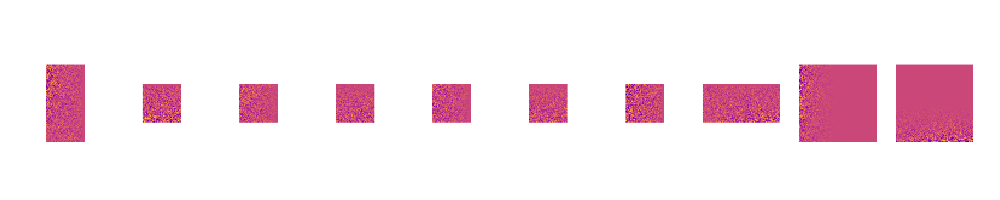

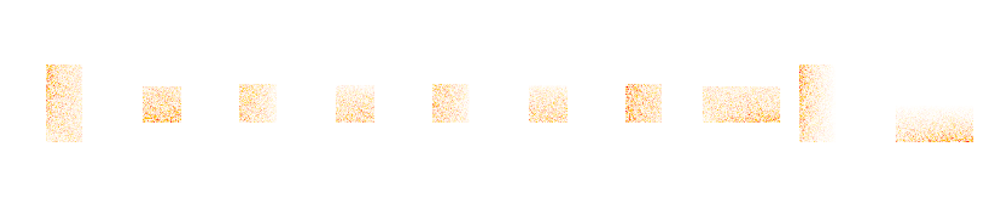

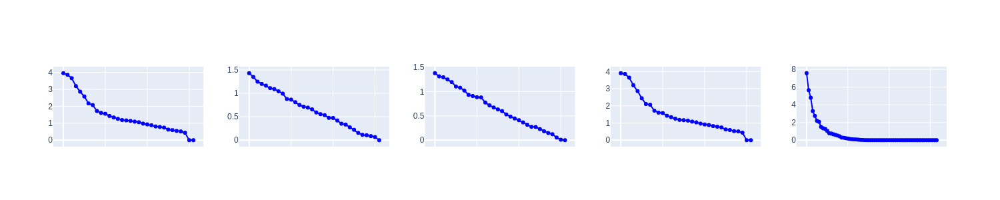

In [ ]:
# %%

if DISPLAY_PLOTS:
    zmax = (W_E_query_err2 @ W_Q_err @ W_K_errT @ W_E_key_err2T).abs().max().item()
    uvs = []
    ss = []
    for m, s in (
        (W_E_query_err2, "E<sub>q,2</sub><sup>⟂</sup>"),
        (W_Q_err, "Q<sup>⟂</sup>"),
        (W_K_errT, "K<sup>⟂</sup>"),
        (W_E_key_err2T, "E<sub>k,2</sub><sup>⟂</sup>"),
        (W_E_query_err2 @ W_Q_err @ W_K_errT @ W_E_key_err2T, "EQKE_err"),
    ):
        U, S, Vh = torch.linalg.svd(m)
        U = U[:, : S.shape[0]] * S[None, : U.shape[1]].sqrt()
        Vh = Vh[: S.shape[0], :] * S[: Vh.shape[0], None].sqrt()
        uvs.extend(((U, f"{s} U"), (Vh, f"{s} Vh")))
        ss.append((S, s))
    pre_uvs = uvs[:]
    num_subplots = len(pre_uvs)
    for colorscale in (None, default_QK_colorscale_2024_03_26):
        fig = make_subplots(rows=1, cols=num_subplots, horizontal_spacing=0.02)
        for i, (mv, us) in enumerate(pre_uvs, start=1):
            fig.add_trace(
                go.Heatmap(
                    z=mv,
                    zmin=-zmax,
                    zmax=zmax,
                    colorscale=colorscale,
                    colorbar=None,
                    showscale=False,
                ),
                row=1,
                col=i,
            )
        fig.update_xaxes(showticklabels=False)
        fig.update_yaxes(showticklabels=False)
        for axis in fig.layout:
            if axis.startswith("xaxis") or axis.startswith("yaxis"):
                fig.layout[axis].scaleanchor = "x1"  # type: ignore
                fig.layout[axis].scaleratio = 1  # type: ignore
        fig.update_layout(height=600, width=300 * num_subplots, plot_bgcolor="white")
        fig.show(RENDERER)
    # for mv, us in uvs:
    #     fig = px.imshow(
    #         mv.numpy(),
    #         title="",
    #         color_continuous_midpoint=0,
    #         zmax=zmax,
    #         zmin=-zmax,
    #     )
    #     # fig.update_traces(colorbar=None)
    #     fig.update_xaxes(showticklabels=False)
    #     fig.update_yaxes(showticklabels=False)
    #     fig.update(layout_coloraxis_showscale=False)
    #     fig.show(RENDERER)
    num_subplots = len(ss)
    fig = make_subplots(rows=1, cols=num_subplots)  # , horizontal_spacing=0.02)
    for i, (s, st) in enumerate(ss, start=1):
        fig.add_trace(
            go.Scatter(
                x=np.arange(len(s)), y=s, mode="lines+markers", line=dict(color="blue")
            ),
            row=1,
            col=i,
        )
    fig.update_layout(
        height=300,  # Adjust as needed
        width=300 * num_subplots,  # Adjust width to fit all subplots side by side
        showlegend=False,  # Optionally hide the legend if it's not needed
    )
    fig.update_xaxes(showticklabels=False)
    # fig.update_yaxes(showticklabels=False)
    fig.show(RENDERER)
    # fig = px.line(s.numpy(), title=f"{st} singular values").show(RENDERER)
    # analyze_svd(m, scale_by_singular_value=True, descr=s, colorscale="plasma", renderer=RENDERER)

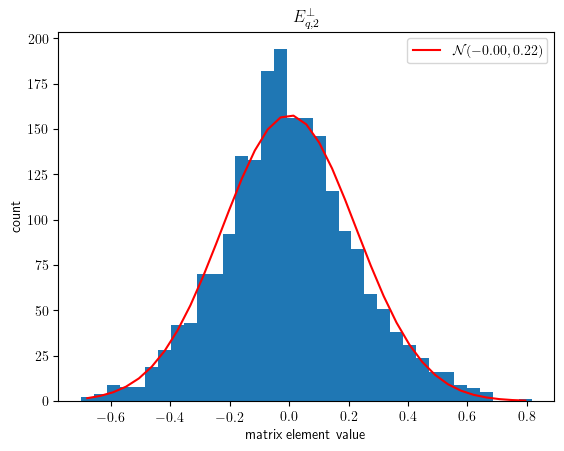

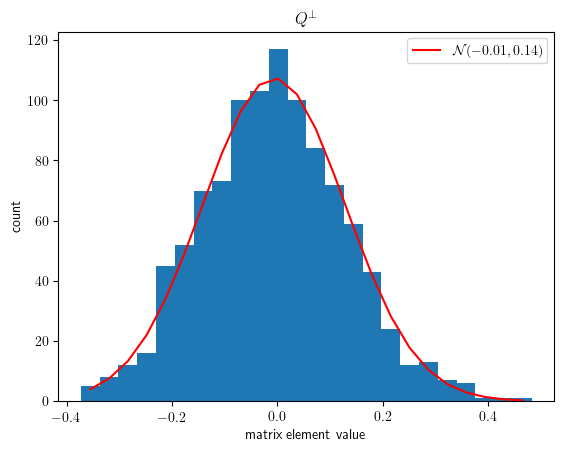

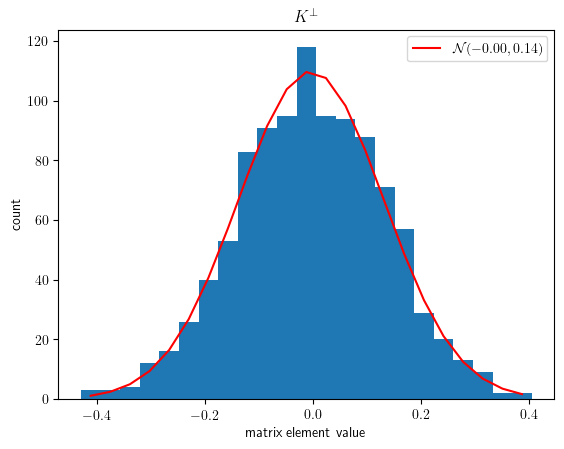

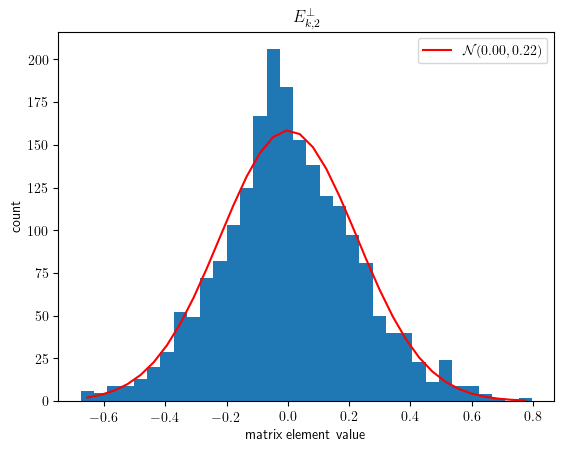

max row diff (n = 100): 1.31 ± 0.13
max row diff (n = 100, m ~ 𝒩(-0.00, 0.22), 𝒩(-0.01, 0.14), 𝒩(-0.00, 0.14), 𝒩(0.00, 0.22)): 1.31 ± 0.14
max row diff (n = 100, m ~ 𝒩(-0.00, 0.22), 𝒩(-0.01, 0.14), 𝒩(-0.00, 0.14), 𝒩(0.00, 0.22)): 1.31 ± 0.14


In [ ]:
# %%


# random resampling of EQKE_err
@torch.no_grad()
def resample_EQKE_err(
    *ms: Tuple[torch.Tensor, Tuple[dict[Literal["html", "latex"], str], str]],
    # QK_colorscale: Colorscale = "Plasma",
    # QK_SVD_colorscale: Colorscale = "Picnic_r",
    seed: int = 1234,
    nsamples: int = 100,
    plot_with: Literal["plotly", "matplotlib"] = "plotly",
    renderer: Optional[str] = None,
) -> Tuple[dict[str, Union[go.Figure, matplotlib.figure.Figure]], dict[str, float]]:
    results: dict = {}
    results_float = {}
    EQKE_err_exact = reduce(torch.matmul, [m for m, s in ms])
    for m, (title, fig_key) in ms:
        m_numpy = m.flatten().numpy()
        edges = np.histogram_bin_edges(m_numpy, bins="auto")
        counts, _ = np.histogram(m_numpy, bins=edges)
        bin_centers = (edges[:-1] + edges[1:]) / 2
        pdf_values = stats.norm.pdf(
            bin_centers, loc=m.mean().item(), scale=m.std().item()
        )
        pdf_scaled = pdf_values * m.numel() * np.diff(edges)
        line_name = r"$\mathcal{N}(%s)$" % pm_round(
            m.mean().item(), m.std().item(), sep=", "
        )
        match plot_with:
            case "plotly":
                fig = px.histogram(
                    {"": m_numpy},
                    nbins=len(edges) - 1,
                    title=title["html"],
                    labels={"variable": "", "value": "matrix element value"},
                )
                # f"𝒩({pm_round(m.mean().item(), m.std().item(), sep=', ')})"
                fig.add_scatter(
                    x=bin_centers,
                    y=pdf_scaled,
                    mode="lines",
                    name=line_name,
                )
                fig.show(renderer)
            case "matplotlib":
                fig, ax = plt.subplots()
                ax.hist(
                    m_numpy,
                    bins=edges,
                )
                ax.plot(
                    bin_centers, pdf_scaled, linestyle="-", color="r", label=line_name
                )
                ax.set_title(title["latex"])
                ax.set_xlabel("matrix element value")
                ax.set_ylabel("count")
                ax.legend()
                plt.show()
        results[fig_key] = fig
    # what if we randomize the order of all matrices without replacement?
    torch.manual_seed(seed)
    results_float["ResampleEQKEErrSeed"] = seed
    results_float["ResampleEQKEErrNumSamples"] = nsamples
    row_diffs = []
    max_row_diffs = []
    for _ in range(nsamples):
        ms_no_replacement = [shuffle_tensor(m) for m, s in ms]
        result = reduce(torch.matmul, ms_no_replacement)
        row_diffs.extend(result.max(dim=-1).values - result.min(dim=-1).values)
        max_row_diffs.append(
            (result.max(dim=-1).values - result.min(dim=-1).values).max().item()
        )
    row_diffs = torch.stack(row_diffs)
    max_row_diffs = torch.tensor(max_row_diffs)
    print(f"max row diff (n = {nsamples}): {pm_mean_std(max_row_diffs)}")
    results_float["ResampleEQKEErrMeanFloat"] = max_row_diffs.mean().item()
    results_float["ResampleEQKEErrStdFloat"] = max_row_diffs.std().item()
    # print(f"row diff: {pm_mean_std(row_diffs)}")
    # sampling from normal
    row_diffs = []
    max_row_diffs = []
    for _ in range(nsamples):
        ms_normal = [torch.randn_like(m) * m.std() + m.mean() for m, s in ms]
        result = reduce(torch.matmul, ms_normal)
        row_diffs.extend(result.max(dim=-1).values - result.min(dim=-1).values)
        max_row_diffs.append(
            (result.max(dim=-1).values - result.min(dim=-1).values).max().item()
        )
    row_diffs = torch.stack(row_diffs)
    max_row_diffs = torch.tensor(max_row_diffs)
    m_descr = ", ".join(
        f"𝒩({pm_round(m.mean().item(), m.std().item(), sep=', ')})" for m, s in ms
    )
    print(f"max row diff (n = {nsamples}, m ~ {m_descr}): {pm_mean_std(max_row_diffs)}")
    results_float["ResampleNormalEQKEErrMeanFloat"] = max_row_diffs.mean().item()
    results_float["ResampleNormalEQKEErrStdFloat"] = max_row_diffs.std().item()
    # print(f"row diff: {pm_mean_std(row_diffs)}")
    return results, results_float


if DISPLAY_PLOTS:
    figs, values = resample_EQKE_err(
        (
            W_E_query_err2,
            (
                {"html": "E<sub>q,2</sub><sup>⟂</sup>", "latex": r"$E_{q,2}^\perp$"},
                "WEqqPerp-hist",
            ),
        ),
        (W_Q_err, ({"html": "Q<sup>⟂</sup>", "latex": r"$Q^\perp$"}, "WQqPerp-hist")),
        (W_K_errT, ({"html": "K<sup>⟂</sup>", "latex": r"$K^\perp$"}, "WKkPerp-hist")),
        (
            W_E_key_err2T,
            (
                {"html": "E<sub>k,2</sub><sup>⟂</sup>", "latex": r"$E_{k,2}^\perp$"},
                "WEkkPerp-hist",
            ),
        ),
        plot_with=PLOT_WITH,
        renderer=RENDERER,
    )
    latex_figures.update(figs)
    latex_values.update(values)

In [ ]:
# %%


@torch.no_grad()
def decompose_EUPU_error_via_svd(
    model: HookedTransformer,
    *,
    W_E_U: Tensor,
    W_U_U: Tensor,
    sanity_check: bool = True,
    atol: float = 1e-4,
) -> Tuple[
    Float[LowRankTensor, "d_vocab d_vocab_out"],  # noqa: F722
    Tuple[
        Float[Tensor, ""],  # noqa: F722
        Tuple[
            Float[Tensor, "d_vocab d_model"],  # noqa: F722
            Float[Tensor, "d_model d_vocab_out"],  # noqa: F722
        ],
    ],
]:
    r"""
    Returns:
        (EUPU_lowrank, (remaining_error_upper_bound, two matrices whose product is the exact remaining error))
    where
        EU is the rank 1 approximation of (W_E + W_pos[-1]) @ W_U
        remaining_error_upper_bound is a bound on the maximum difference between two elements in the same row of the remaining error in EU


    Complexity: O(d_vocab * (d_vocab + d_model) + d_vocab * d_model^2)

    The d_model^2 term comes from having to do SVD to compute remaining_error_upper_bound

    Preconditions:
        (none)
    Postconditions:
        EUPU_lowrank := (W_E_U + W_pos[-1]) @ W_U_U.T
        Define err := (W_E + W_pos[-1]) @ W_U - EU_lowrank
        Then we guarantee:
        . max_{i,j} err_{r, i} - err_{r, j} <= remaining_error_upper_bound
    """
    W_E, W_pos, W_U = (
        model.W_E,
        model.W_pos,
        model.W_U,
    )

    W_E_via_U, W_E_err = factor_contribution(
        W_E + W_pos[-1],
        W_E_U.squeeze(),
        sanity_check=sanity_check,
        checkparams=dict(atol=atol),
    )  # O(d_vocab * d_model)
    W_U_via_U, W_U_err = factor_contribution(
        W_U, W_U_U.squeeze(), sanity_check=sanity_check, checkparams=dict(atol=atol)
    )  # O(d_model * d_vocab_out)
    EU_lowrank = W_E_via_U @ W_U_via_U  # O(d_vocab * d_vocab_out)

    return (
        EU_lowrank,
        bound_max_row_diff_by_SVD(W_E_err, W_U_err),  # type: ignore
    )

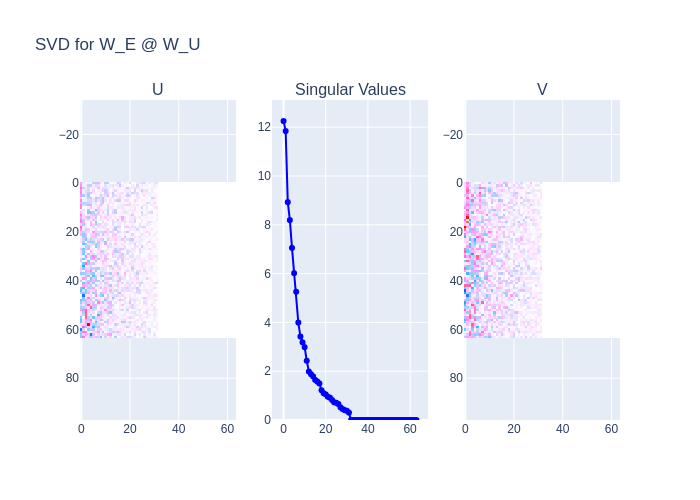

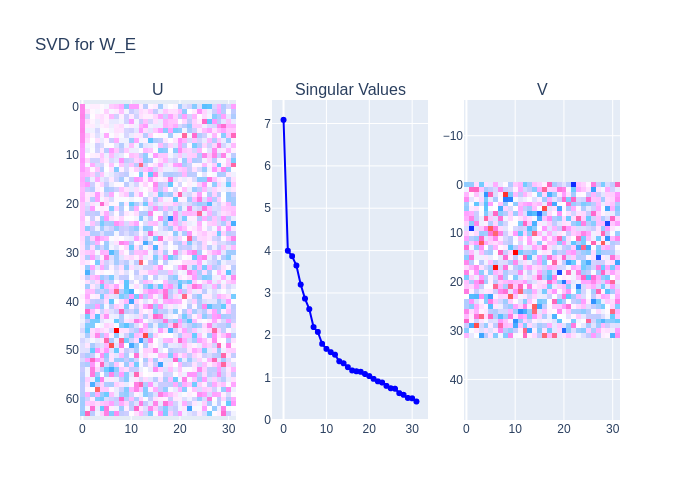

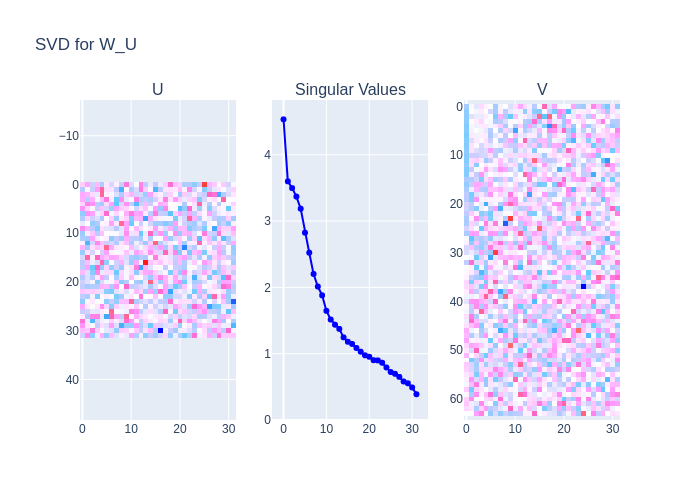

In [ ]:
# %%

if DISPLAY_PLOTS:
    analyze_svd(model.W_E @ model.W_U, descr="W_E @ W_U", renderer=RENDERER)
    analyze_svd(
        model.W_E,
        descr="W_E",
        scale_by_singular_value=False,
        renderer=RENDERER,
    )
    analyze_svd(
        model.W_U,
        descr="W_U",
        scale_by_singular_value=False,
        renderer=RENDERER,
    )

In [ ]:
# %%

(W_E_U, W_E_S, W_E_Vh), (W_E_contrib, W_E_err) = split_svd_contributions(model.W_E)
(W_U_U, W_U_S, W_U_Vh), (W_U_contrib, W_U_err) = split_svd_contributions(model.W_U)
(
    EUPU_lowrank,
    (EUPU_err_upper_bound, (EUPU_W_EP_err, EUPU_W_U_err)),
) = decompose_EUPU_error_via_svd(
    model,
    W_E_U=W_E_U,
    W_U_U=W_U_U,
    sanity_check=True,
)

# %% [markdown]

 ## The average+diff trick

 (Stealing notation from Aryan)

 Suppose we have quantities $f_{x,y}$ and $g_{y,z}$ and we want to pessimize (WLOG, suppose minimize) the quantity $f_{x,y} + g_{y,z}$ over $x$, $y$, and $z$ in time less than $\mathcal{O}(n_x n_y n_z)$, say we allow $\mathcal{O}(n_x n_y + n_y n_z + n_x n_z)$.

 We can of course say
 $$\min_{x,y} f_{x,y} + \min_{y, z} g_{y,z} \le f_{x,y} + g_{y,z}$$
 But we can do better!

 Note that
 $$f_{x,y} = \mathbb{E}_x f_{x,y} + (f_{x,y} - \mathbb{E}_x f_{x,y})$$

 Suppose that $f_{x,y}$ varies much less over $x$ than it does over $y$, and much less than $h_{y,z}$ varies over either of $y$ and $z$.
 This will make the following bound a good approximation, though the bound is sound even without this assumption.
 We can write
 $$
 \begin{align*}
 f_{x,y} + g_{y,z}
 & \ge \min_{x,y,z} [f_{x,y} + g_{y,z}] \\
 & = \min_{x,y,z} [\mathbb{E}_x f_{x,y} + g_{y,z} + f_{x,y} - \mathbb{E}_x f_{x,y}] \\
 & \ge \min_{x,y,z} [\mathbb{E}_x f_{x,y} + g_{y,z}] + \min_{x,y,z}[f_{x,y} - \mathbb{E}_x f_{x,y}] \\
 & = \min_{y,z} [\mathbb{E}_x f_{x,y} + g_{y,z}] + \min_{x,y}[f_{x,y} - \mathbb{E}_x f_{x,y}]
 \end{align*}
 $$

 Example for how this helps with small variation:

 Take any function $k(y)$ and then take
 $$
 \begin{align*}
 f_{x,y} & := k(y) + \varepsilon_1(x, y) \\
 g_{y,z} & := -k(y) + \varepsilon_2(y, z)
 \end{align*}
 $$
 Then we have
 $$
 \begin{align*}
 \min_{x,y,z}[f_{x,y} + g_{y,z}] & = \min_{x,y,z}[\varepsilon_1(x, y) + \varepsilon_2(y, z)] \\
 \min{x,y}f_{x,y} + \min_{y,z}g_{y,z}
 & = \min_{y}k(y) + \min_{y} -k(y) + \min_{x,y}\varepsilon_1(x, y) + \min_{y,z}\varepsilon_2(y, z) \\
 & = \min_{y}k(y) - \max_{y} k(y) + \min_{x,y}\varepsilon_1(x, y) + \min_{y,z}\varepsilon_2(y, z) \\
 \min{x,y}[f_{x,y} - \mathbb{E}_x f_{x,y}] + \min_{y,z}[g_{y,z} + \mathbb{E}_x f_{x,y}]
 & = \min_{x,y}\varepsilon_1(x, y) + \min_{y,z}[\varepsilon_2(y, z) + \mathbb{E}_x\varepsilon_1(x, y)]
 \end{align*}
 $$
 If $\varepsilon_1$ and $\varepsilon_2$ are small compared to $\min_y k(y) - \max_y k(y)$, then using $\mathbb{E}_x f_{x,y}$ gives a much better bound.

 Note, though, that this could be a worse bound if the assumption of small variation does not hold.

# %% [markdown]

 ## Bounding the largest diff within a row of a product of matrices

 Suppose we have matrices $A$, $B$ and we want to compute
 $$\begin{align*}
 &\max_{r,i,j} (AB)_{r,i} - (AB)_{r,j} \\
 &= \max_{r,i,j} \sum_k \left(A_{r,k} B_{k,i} - A_{r,k} B_{k,j}\right) \\
 &= \max_{r,i,j} \sum_k A_{r,k} \left(B_{k,i} - B_{k,j}\right) \\
 &\le \max_r \sum_k \max_{i,j} A_{r,k} \left(B_{k,i} - B_{k,j}\right) \\
 &= \max_r \sum_k A_{r,k}\begin{cases} \max_{i,j}  \left(B_{k,i} - B_{k,j}\right) & \text{if }A_{r,j} \ge 0 \\ \min_{i,j} \left(B_{k,i} - B_{k,j}\right) & \text{if }A_{r,j} <0 \end{cases} \\
 &= \max_r \sum_k A_{r,k}\begin{cases} \max_{i,j}  \left(B_{k,i} - B_{k,j}\right) & \text{if }A_{r,j} \ge 0 \\ -\max_{i,j} \left(B_{k,i} - B_{k,j}\right) & \text{if }A_{r,j} <0 \end{cases} \\
 &= \max_r \sum_k \left|A_{r,k}\max_{i,j}  \left(B_{k,i} - B_{k,j}\right)\right| \\
 &= \max_r \sum_k \left|A_{r,k}\right|\max_{i,j}  \left(B_{k,i} - B_{k,j}\right) \\
 \end{align*}$$

# %% [markdown]

 ## Fusing Bounding the largest diff within a row of a product of matrices with Mean+Diff

 Suppose we have matrices $A$, $B$ and we want to compute
 $$\begin{align*}
 &\max_{r,i,j} (AB)_{r,i} - (AB)_{r,j} \\
 &= \max_{r,i,j} \sum_k \left(A_{r,k} B_{k,i} - A_{r,k} B_{k,j}\right) \\
 &= \max_{r,i,j} \sum_k A_{r,k} \left(B_{k,i} - B_{k,j}\right) \\
 &= \max_{r,i,j} \sum_k \left(\mathbb{E}_rA_{r,k} + \left(A_{r,k} - \mathbb{E}_rA_{r,k}\right)\right) \left(B_{k,i} - B_{k,j}\right) \\
 &= \max_{i,j} \left(\sum_k \mathbb{E}_rA_{r,k}\left(B_{k,i} - B_{k,j}\right) + \max_r \sum_k \left(A_{r,k} - \mathbb{E}_rA_{r,k}\right) \left(B_{k,i} - B_{k,j}\right)\right) \\
 &\le \left(\max_{i,j} \sum_k \mathbb{E}_rA_{r,k}\left(B_{k,i} - B_{k,j}\right)\right) + \max_r \sum_k \max_{i,j}\left(A_{r,k} - \mathbb{E}_rA_{r,k}\right) \left(B_{k,i} - B_{k,j}\right) \\
 &\le \left(\max_{i,j} \sum_k \mathbb{E}_rA_{r,k}\left(B_{k,i} - B_{k,j}\right)\right) + \max_r \sum_k \left|A_{r,k} - \mathbb{E}_rA_{r,k}\right| \max_{i,j}\left(B_{k,i} - B_{k,j}\right) \\
 \end{align*}$$

In [ ]:
# %%

# # %% [markdown]
# # \[\begin{align*}
# # \text{max\_diff}[q, m, c]
# #  &= \max_{k \ne m} (\text{EVOU}[q, k] - \text{EVOU}[q, m]) \text{attn}[q, m, c] + \max_{0 \le n \le m - \text{min\_gap}[q, m, c]} (\text{EVOU}[q, m - n] - \text{EVOU}[q, m]) \text{attn}[q, m - n, c] \\
# # \end{align*}\]

In [ ]:
# %%

min_gap = 1
extreme_right_attention = quadratic.compute_extreme_right_attention_quadratic(
    EQKE_query_key + err_accumulator, min_gap=20
)
min_right_attention = extreme_right_attention[0]
print(
    (min_right_attention[~min_right_attention.isnan()] > err_upper_bound).sum().item()
)
extreme_right_attention_adjusted = extreme_right_attention.clone()
extreme_right_attention_adjusted[0] -= err_upper_bound
extreme_right_attention_adjusted[1] += err_upper_bound
extreme_right_attention_softmaxed = (
    quadratic.compute_extreme_softmaxed_right_attention_quadratic(
        extreme_right_attention_adjusted,
        EQKE_pos_err,
        min_gap=1,
        attn_scale=model.blocks[0].attn.attn_scale,
    )
)

0


In [ ]:
# %%

W_EP: Float[Tensor, "d_vocab d_model"] = (  # noqa: F722
    (model.W_E + model.W_pos.mean(dim=0, keepdim=True)).detach().clone()
)
W_U: Float[Tensor, "d_model d_vocab_out"] = model.W_U.detach().clone()  # noqa: F722
W_EP_svd_query = analysis_quadratic.W_EP_direction_for_tricks(W_EP=W_EP, W_U=W_U)
W_EP_mean_query = W_EP.mean(dim=0)

In [ ]:
# %%

min_gap = 20
extreme_right_attention = quadratic.compute_extreme_right_attention_quadratic(
    EQKE_query_key + err_accumulator, min_gap=min_gap
)
min_extreme_right_attention = extreme_right_attention[0]
print(
    f"Complexity of compute_extreme_right_attention_quadratic: {complexity_of(quadratic.compute_extreme_right_attention_quadratic)}"
)  # O(d_vocab^2)
print(
    (min_right_attention[~min_right_attention.isnan()] > err_upper_bound.min())
    .sum()
    .item()
)
extreme_right_attention_adjusted = extreme_right_attention.clone()
extreme_right_attention_adjusted[0] -= err_upper_bound
extreme_right_attention_adjusted[1] += err_upper_bound
extreme_right_attention_softmaxed = (
    quadratic.compute_extreme_softmaxed_right_attention_quadratic(
        extreme_right_attention_adjusted,
        EQKE_pos_err,
        min_gap=min_gap,
        attn_scale=model.blocks[0].attn.attn_scale,
    )
)
print(
    f"Complexity of compute_extreme_softmaxed_right_attention: {complexity_of(quadratic.compute_extreme_softmaxed_right_attention_quadratic)}"
)  # O(d_vocab^2 * n_ctx^2)
EUPU: Float[Tensor, "d_vocab_q d_vocab_out"] = EU_PU(model)  # noqa: F722
print(f"Complexity of EU_PU: {complexity_of(EU_PU)}")  # O(d_vocab^2 * d_model)
EVOU: Float[Tensor, "d_vocab d_vocab_out"] = all_EVOU(model)  # noqa: F722
print(f"Complexity of EVOU: {complexity_of(all_EVOU)}")  # O(d_vocab^2 * d_model)
PVOU: Float[Tensor, "n_ctx d_vocab_out"] = all_PVOU(model)  # noqa: F722
print(f"Complexity of PVOU: {complexity_of(all_PVOU)}")  # O(n_ctx * d_vocab * d_model)
largest_wrong_logit: Float[
    Tensor, "d_vocab_q d_vocab_max n_ctx_nonmax_copies"  # noqa: F722
] = quadratic.compute_largest_wrong_logit_quadratic(
    extreme_right_attention_softmaxed,
    W_EP=W_EP,
    W_U=W_U,
    EVOU=EVOU,
    PVOU=PVOU,
    min_gap=min_gap,
)
print(
    f"Complexity of compute_largest_wrong_logit_quadratic: {complexity_of(quadratic.compute_largest_wrong_logit_quadratic)}"
)  # O(d_vocab^2 * n_ctx^2)

Complexity of compute_extreme_right_attention_quadratic: O(d_vocab^2 n_ctx)
0
Complexity of compute_extreme_softmaxed_right_attention: O(d_vocab^2 * n_ctx^2)
Complexity of EU_PU: O(d_vocab^2 * d_model)
Complexity of EVOU: O(d_vocab * (d_model * d_head + d_model * d_vocab_out)) ~ O(d_vocab^2 * d_model)
Complexity of PVOU: O(n_ctx * (d_model * d_head + d_model * d_vocab_out)) ~ O(n_ctx * d_vocab * d_model)
Complexity of compute_largest_wrong_logit_quadratic: O(d_vocab^2 * n_ctx^2) (+ d_vocab * d_model^2 if W_EP_direction is None and tricks.EUPU_handling == "svd_query+max_diff")


In [ ]:
# %%

try_all_configurations: bool = True  # @param {type:"boolean"}
use_tricks: bool = True  # @param {type:"boolean"}
if try_all_configurations:
    all_configs = list(enumerate_dataclass_values(LargestWrongLogitQuadraticConfig))
elif use_tricks:
    all_configs = [LargestWrongLogitQuadraticConfig()]
else:
    all_configs = [LargestWrongLogitQuadraticConfig.OFF]

# %% [markdown]

 # Sub-cubic Proofs

trick cfg:   0%|          | 0/100 [00:00<?, ?it/s]

Tricks: EUPU-mean-query+max-diff--attn-mean-query+diff--attn-err-svd
err_upper_bound: 20.745256423950195
Tricks: EUPU-mean-query+max-diff--attn-mean-query+diff--attn-err-max-diff
err_upper_bound.max(): 7.9421796798706055
Tricks: EUPU-mean-query+max-diff--attn-mean-query+diff--attn-err-max-diff-subproduct
err_upper_bound.max(): 5.671478271484375
Tricks: EUPU-mean-query+max-diff--attn-mean-query+diff--attn-err-max-diff-subproduct-recursive
err_upper_bound.max(): 97.0572280883789
Tricks: EUPU-mean-query+max-diff--attn-mean-query+diff--attn-err-mean+max-diff
err_upper_bound.max(): 8.053634643554688
Tricks: EUPU-mean-query+max-diff--attn-mean-query+diff--attn-err-mean+max-diff-subproduct
err_upper_bound.max(): 5.657204627990723
Tricks: EUPU-mean-query+max-diff--attn-mean-query+diff--attn-err-mean+max-diff-subproduct-recursive
err_upper_bound.max(): 96.76378631591797
Tricks: EUPU-mean-query+max-diff--attn-mean-query+diff--attn-err-mean-recursive+max-diff-subproduct-recursive
err_upper_bound.

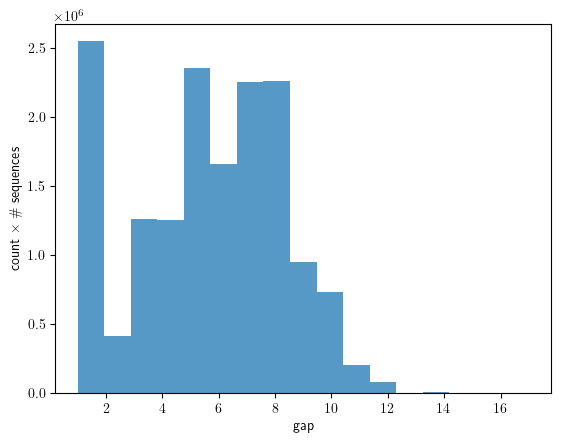

EUPUMeanQueryMaxDiffAttnMeanQueryDiffAttnErrMaxDiff: most (99.91251230239868%) sequences are <= 9 (based on + 1.5 std)


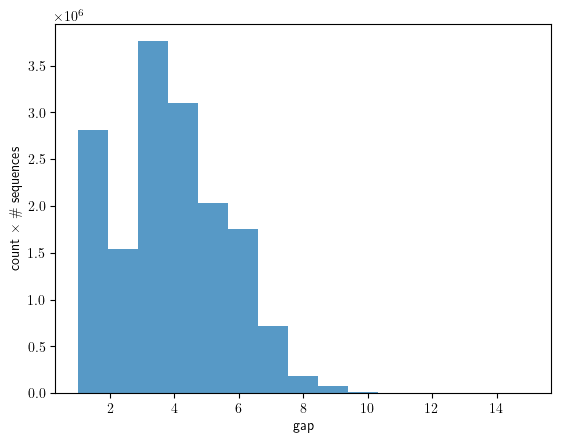

EUPUMeanQueryMaxDiffAttnMeanQueryDiffAttnErrMaxDiffSubproduct: most (99.92383122444153%) sequences are <= 9 (based on + 1.5 std)


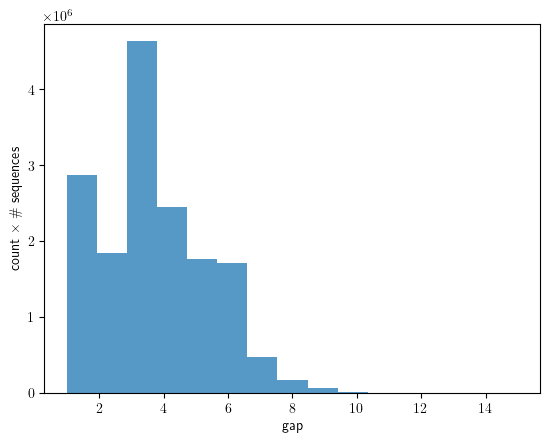

EUPUMeanQueryMaxDiffAttnMeanQueryDiffAttnErrMaxDiffSubproductRecursive: most (100.0%) sequences are <= 69 (based on + 1.5 std)


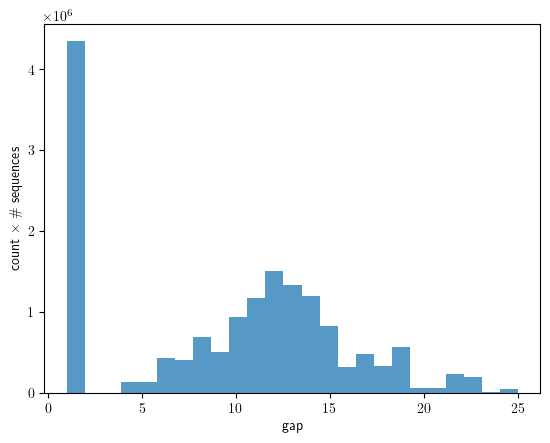

EUPUMeanQueryMaxDiffAttnMeanQueryDiffAttnErrMeanMaxDiff: most (99.91251230239868%) sequences are <= 9 (based on + 1.5 std)


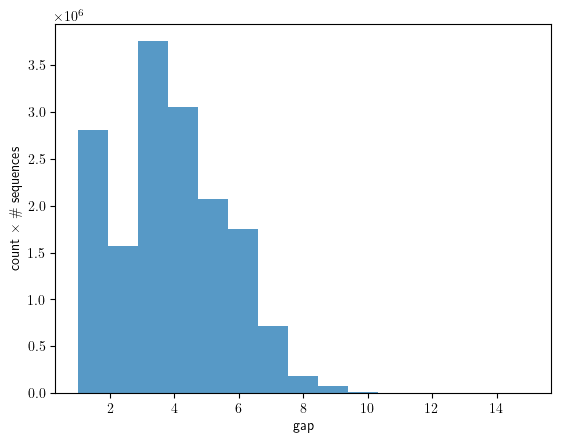

EUPUMeanQueryMaxDiffAttnMeanQueryDiffAttnErrMeanMaxDiffSubproduct: most (99.92383122444153%) sequences are <= 9 (based on + 1.5 std)


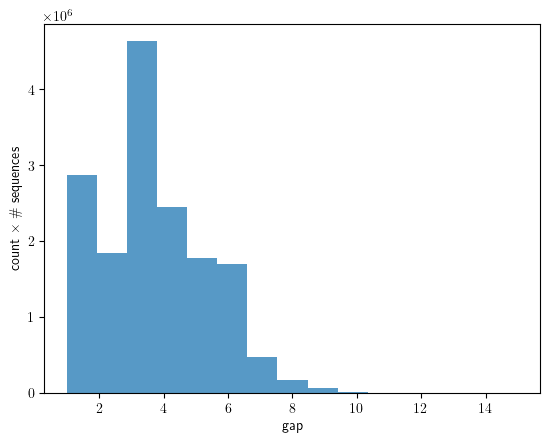

EUPUMeanQueryMaxDiffAttnMeanQueryDiffAttnErrMeanMaxDiffSubproductRecursive: most (100.0%) sequences are <= 69 (based on + 1.5 std)


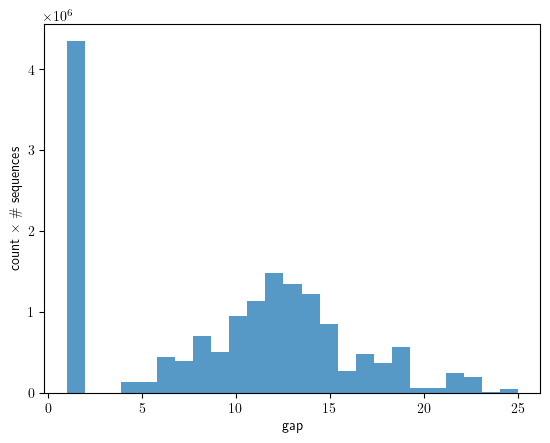

EUPUMeanQueryMaxDiffAttnMeanQueryDiffAttnErrMeanRecursiveMaxDiffSubproductRecursive: most (100.0%) sequences are <= 70 (based on + 1.5 std)


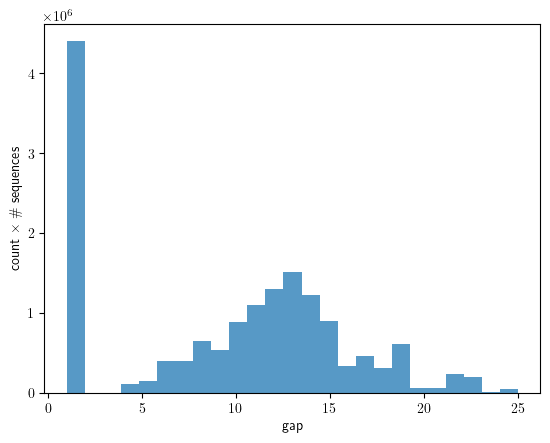

EUPUMeanQueryMaxDiffAttnMeanQueryDiffAttnErrExactEqkeMaxDiffExact: most (99.56252574920654%) sequences are <= 8 (based on + 1.5 std)


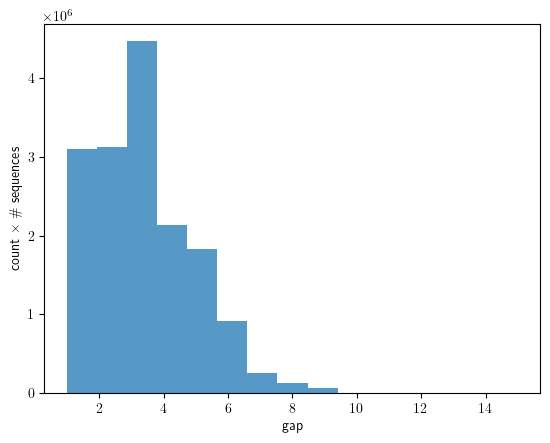

EUPUMeanQueryMaxDiffAttnMeanQueryDiffAttnErrMaxDiffExact: most (99.53174591064453%) sequences are <= 8 (based on + 1.5 std)


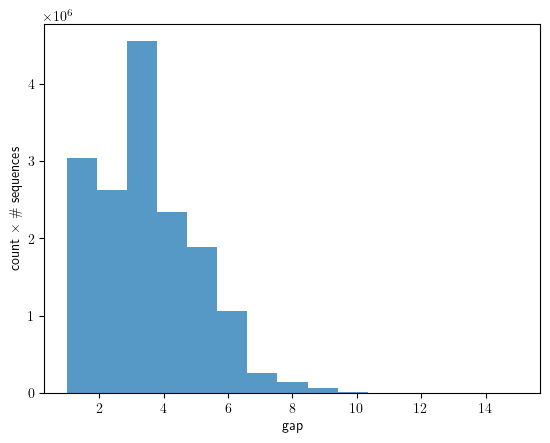

EUPUMeanQueryMaxDiffAttnDropAverageQueryPerOutputLogitReasoningAttnErrSvd: most (100.0%) sequences are <= 15 (based on + 1.5 std)


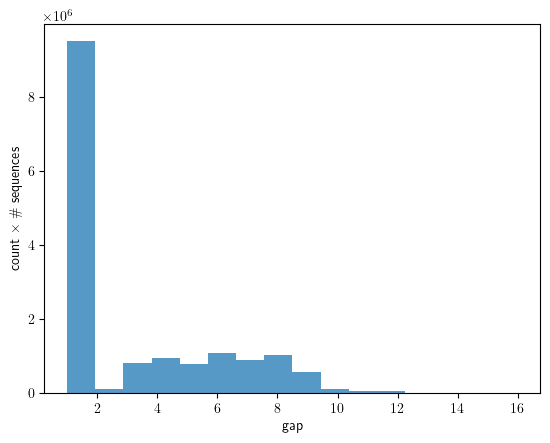

EUPUMeanQueryMaxDiffAttnDropAverageQueryPerOutputLogitReasoningAttnErrMaxDiff: most (99.374920129776%) sequences are <= 8 (based on + 1.5 std)


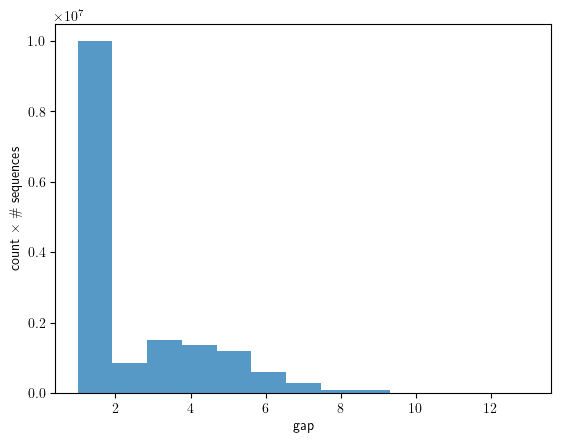

EUPUMeanQueryMaxDiffAttnDropAverageQueryPerOutputLogitReasoningAttnErrMaxDiffSubproduct: most (99.20617938041687%) sequences are <= 7 (based on + 1.5 std)


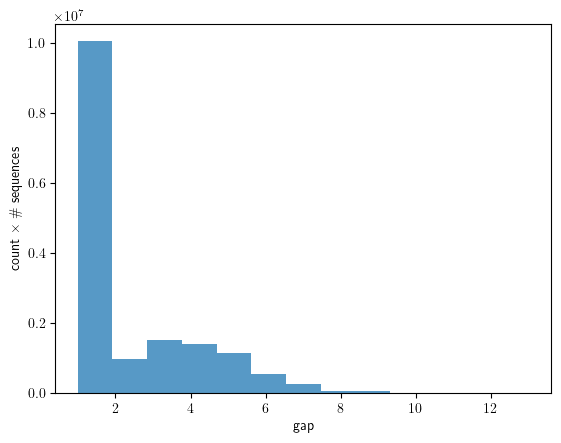

EUPUMeanQueryMaxDiffAttnDropAverageQueryPerOutputLogitReasoningAttnErrMaxDiffSubproductRecursive: most (100.0%) sequences are <= 50 (based on + 1.5 std)


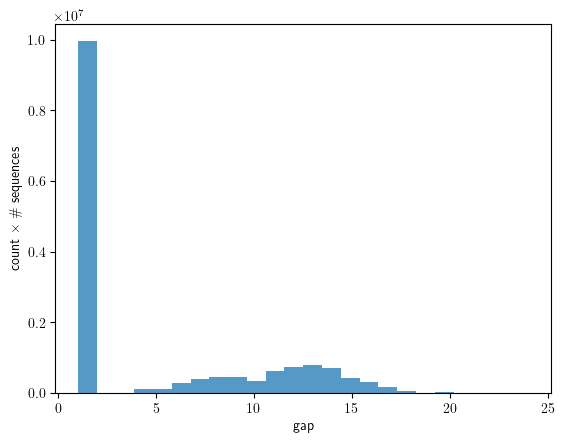

EUPUMeanQueryMaxDiffAttnDropAverageQueryPerOutputLogitReasoningAttnErrMeanMaxDiff: most (99.374920129776%) sequences are <= 8 (based on + 1.5 std)


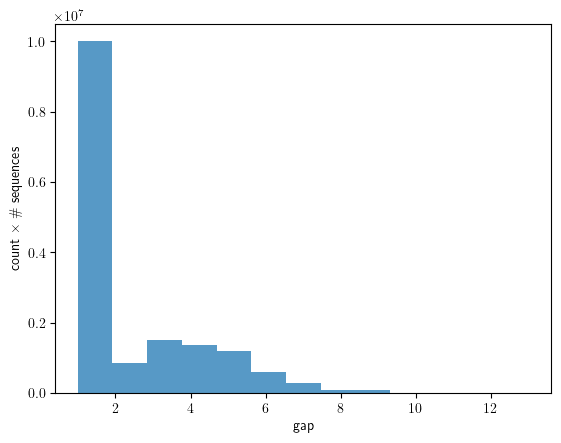

EUPUMeanQueryMaxDiffAttnDropAverageQueryPerOutputLogitReasoningAttnErrMeanMaxDiffSubproduct: most (99.20617938041687%) sequences are <= 7 (based on + 1.5 std)


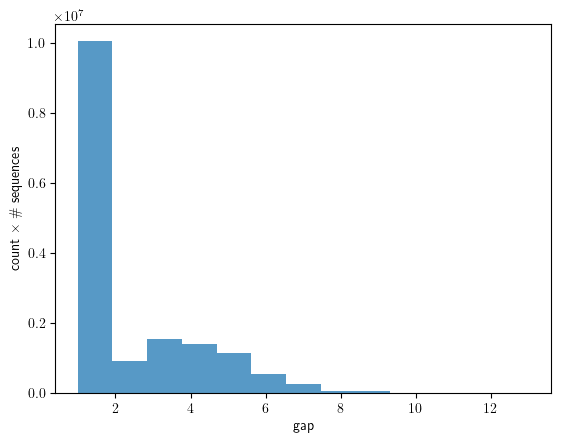

EUPUMeanQueryMaxDiffAttnDropAverageQueryPerOutputLogitReasoningAttnErrMeanMaxDiffSubproductRecursive: most (100.0%) sequences are <= 50 (based on + 1.5 std)


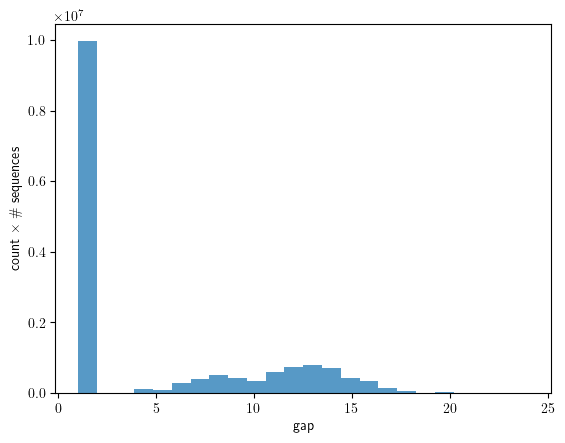

EUPUMeanQueryMaxDiffAttnDropAverageQueryPerOutputLogitReasoningAttnErrMeanRecursiveMaxDiffSubproductRecursive: most (100.0%) sequences are <= 50 (based on + 1.5 std)


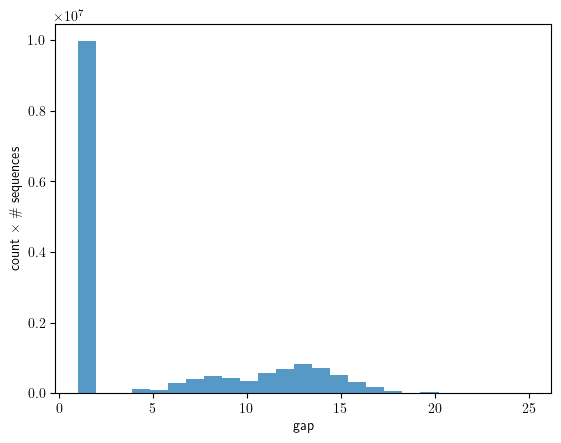

EUPUMeanQueryMaxDiffAttnDropAverageQueryPerOutputLogitReasoningAttnErrExactEqkeMaxDiffExact: most (98.36000204086304%) sequences are <= 6 (based on + 1.5 std)


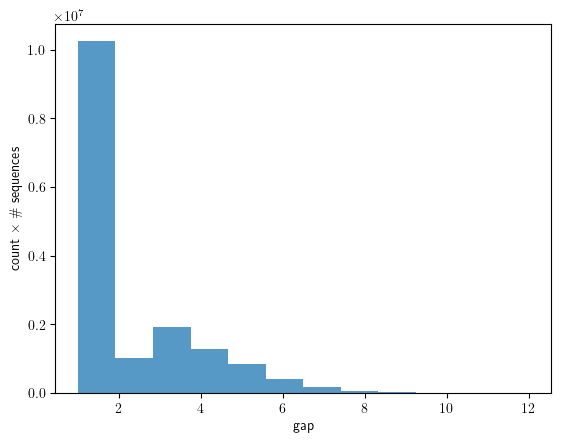

EUPUMeanQueryMaxDiffAttnDropAverageQueryPerOutputLogitReasoningAttnErrMaxDiffExact: most (99.37493801116943%) sequences are <= 7 (based on + 1.5 std)


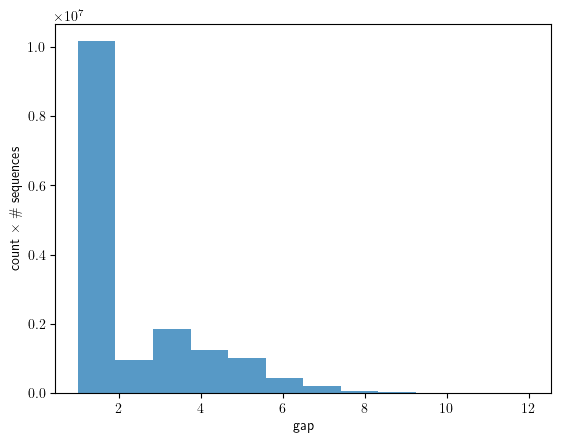

EUPUSvdQueryMaxDiffAttnMeanQueryDiffAttnErrSvd: most (100.0%) sequences are <= 1 (based on + 1.5 std)
All gaps are: {1}
EUPUSvdQueryMaxDiffAttnMeanQueryDiffAttnErrMaxDiff: most (100.0%) sequences are <= 1 (based on + 1.5 std)
All gaps are: {1}
EUPUSvdQueryMaxDiffAttnMeanQueryDiffAttnErrMaxDiffSubproduct: most (100.0%) sequences are <= 1 (based on + 1.5 std)
All gaps are: {1}
EUPUSvdQueryMaxDiffAttnMeanQueryDiffAttnErrMaxDiffSubproductRecursive: most (100.0%) sequences are <= 1 (based on + 1.5 std)
All gaps are: {1}
EUPUSvdQueryMaxDiffAttnMeanQueryDiffAttnErrMeanMaxDiff: most (100.0%) sequences are <= 1 (based on + 1.5 std)
All gaps are: {1}
EUPUSvdQueryMaxDiffAttnMeanQueryDiffAttnErrMeanMaxDiffSubproduct: most (100.0%) sequences are <= 1 (based on + 1.5 std)
All gaps are: {1}
EUPUSvdQueryMaxDiffAttnMeanQueryDiffAttnErrMeanMaxDiffSubproductRecursive: most (100.0%) sequences are <= 1 (based on + 1.5 std)
All gaps are: {1}
EUPUSvdQueryMaxDiffAttnMeanQueryDiffAttnErrMeanRecursiveMaxDiffSub

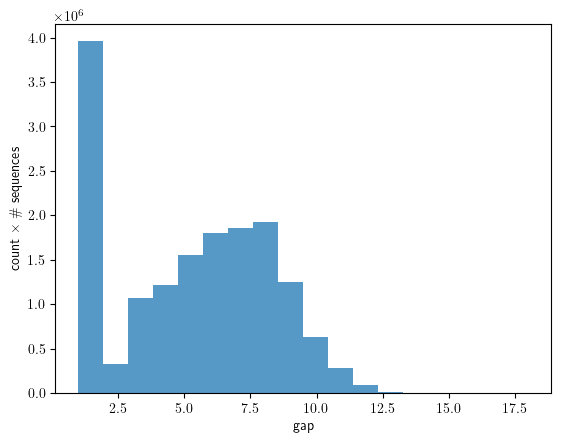

EUPUMaxDiffAttnMeanQueryDiffAttnErrMaxDiff: most (99.94848370552063%) sequences are <= 10 (based on + 1.5 std)


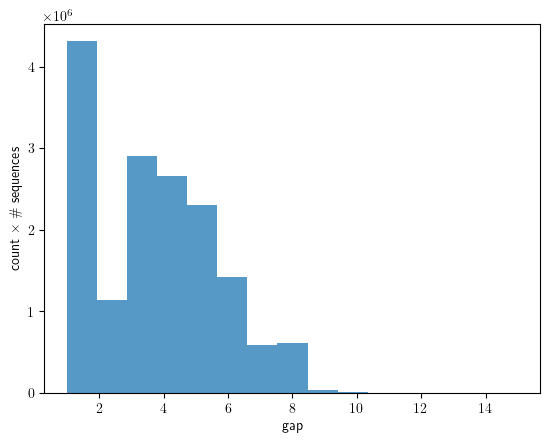

EUPUMaxDiffAttnMeanQueryDiffAttnErrMaxDiffSubproduct: most (99.9688982963562%) sequences are <= 10 (based on + 1.5 std)


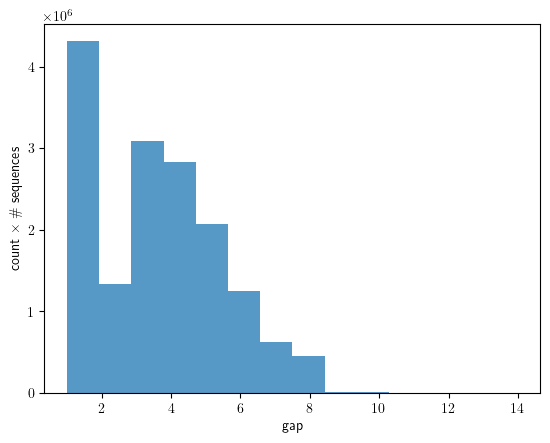

EUPUMaxDiffAttnMeanQueryDiffAttnErrMaxDiffSubproductRecursive: most (100.0%) sequences are <= 73 (based on + 1.5 std)


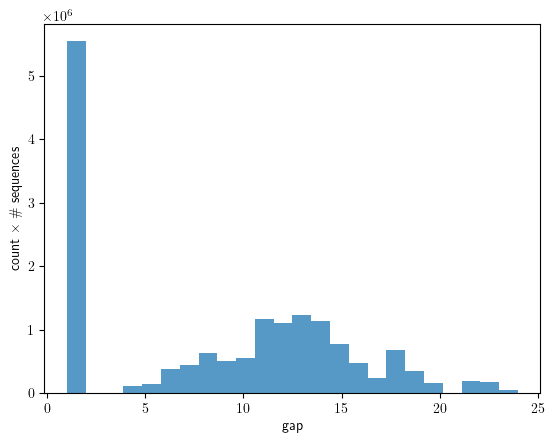

EUPUMaxDiffAttnMeanQueryDiffAttnErrMeanMaxDiff: most (99.94848370552063%) sequences are <= 10 (based on + 1.5 std)


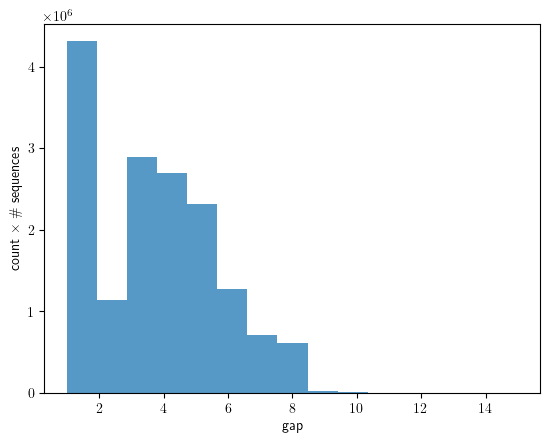

EUPUMaxDiffAttnMeanQueryDiffAttnErrMeanMaxDiffSubproduct: most (99.9688982963562%) sequences are <= 10 (based on + 1.5 std)


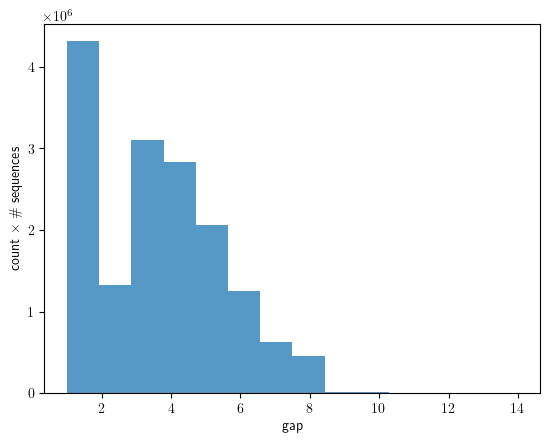

EUPUMaxDiffAttnMeanQueryDiffAttnErrMeanMaxDiffSubproductRecursive: most (100.0%) sequences are <= 73 (based on + 1.5 std)


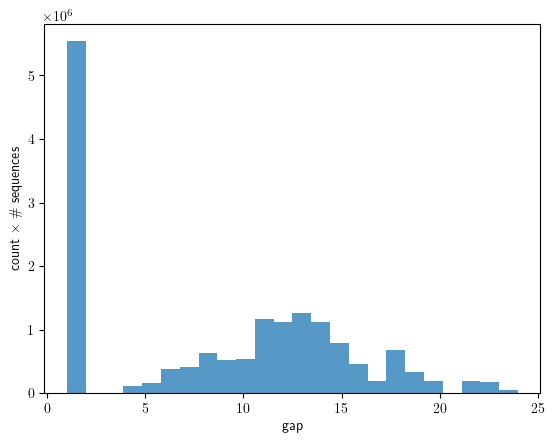

EUPUMaxDiffAttnMeanQueryDiffAttnErrMeanRecursiveMaxDiffSubproductRecursive: most (100.0%) sequences are <= 74 (based on + 1.5 std)


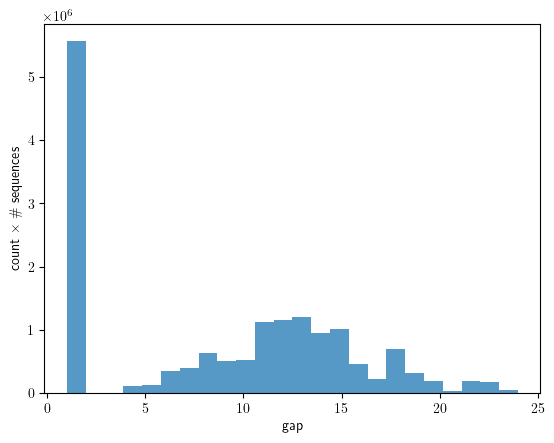

EUPUMaxDiffAttnMeanQueryDiffAttnErrExactEqkeMaxDiffExact: most (99.87424612045288%) sequences are <= 8 (based on + 1.5 std)


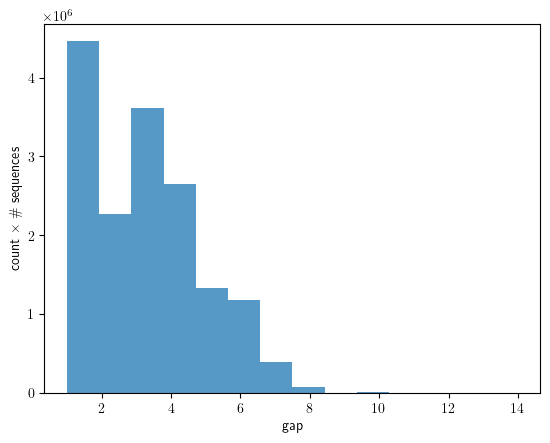

EUPUMaxDiffAttnMeanQueryDiffAttnErrMaxDiffExact: most (99.91233944892883%) sequences are <= 9 (based on + 1.5 std)


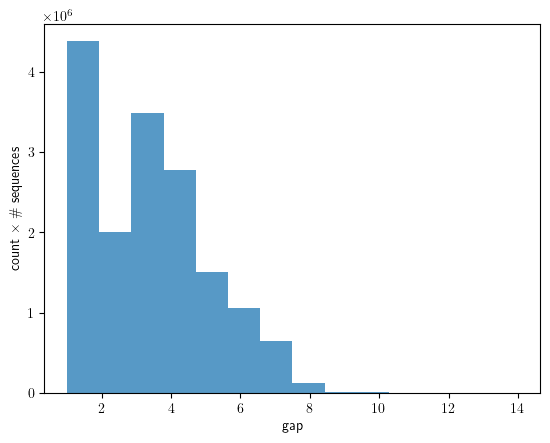

EUPUMaxDiffAttnDropAverageQueryPerOutputLogitReasoningAttnErrSvd: most (100.0%) sequences are <= 14 (based on + 1.5 std)


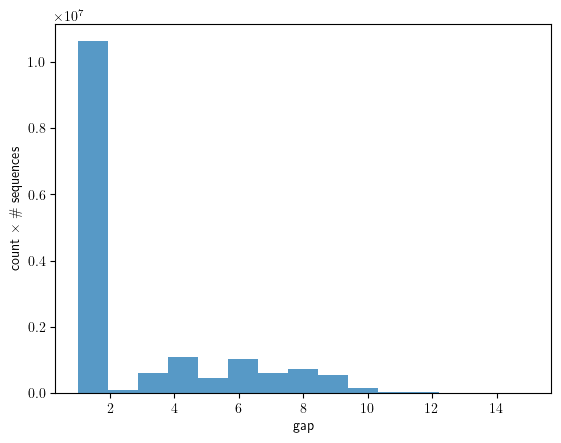

EUPUMaxDiffAttnDropAverageQueryPerOutputLogitReasoningAttnErrMaxDiff: most (98.62757325172424%) sequences are <= 7 (based on + 1.5 std)


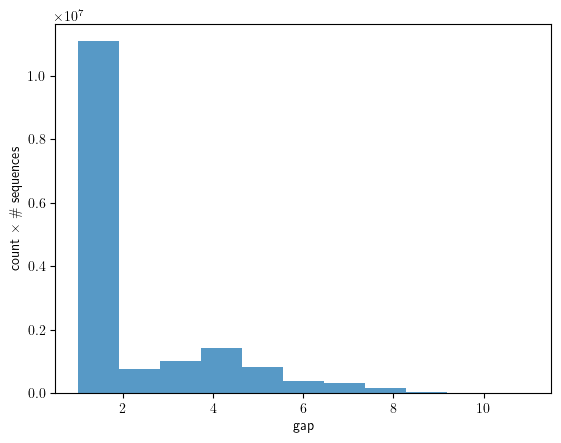

EUPUMaxDiffAttnDropAverageQueryPerOutputLogitReasoningAttnErrMaxDiffSubproduct: most (99.01850819587708%) sequences are <= 7 (based on + 1.5 std)


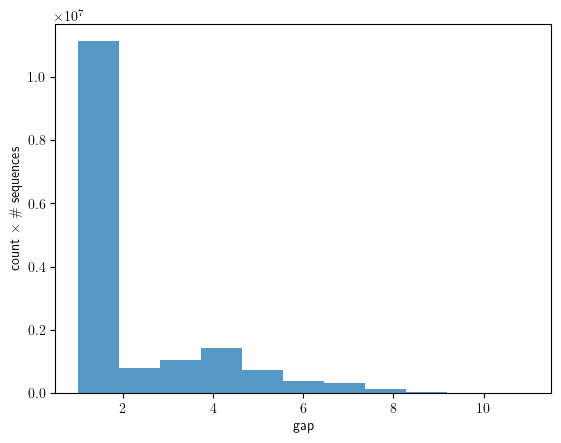

EUPUMaxDiffAttnDropAverageQueryPerOutputLogitReasoningAttnErrMaxDiffSubproductRecursive: most (100.0%) sequences are <= 44 (based on + 1.5 std)


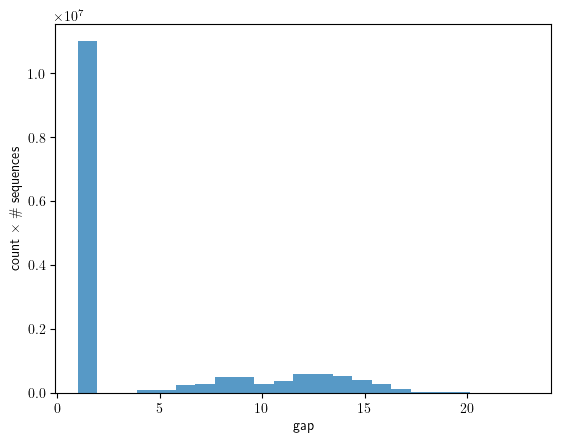

EUPUMaxDiffAttnDropAverageQueryPerOutputLogitReasoningAttnErrMeanMaxDiff: most (98.62757325172424%) sequences are <= 7 (based on + 1.5 std)


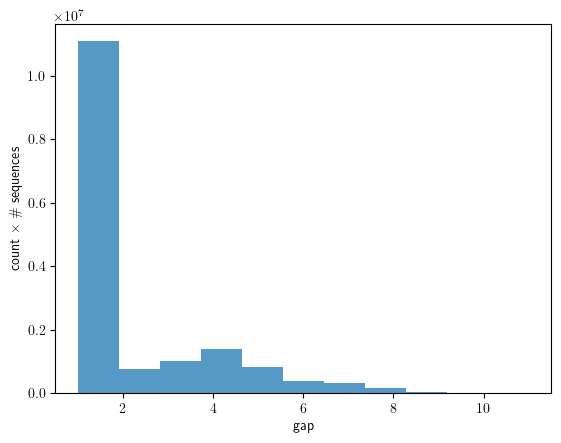

EUPUMaxDiffAttnDropAverageQueryPerOutputLogitReasoningAttnErrMeanMaxDiffSubproduct: most (99.01850819587708%) sequences are <= 7 (based on + 1.5 std)


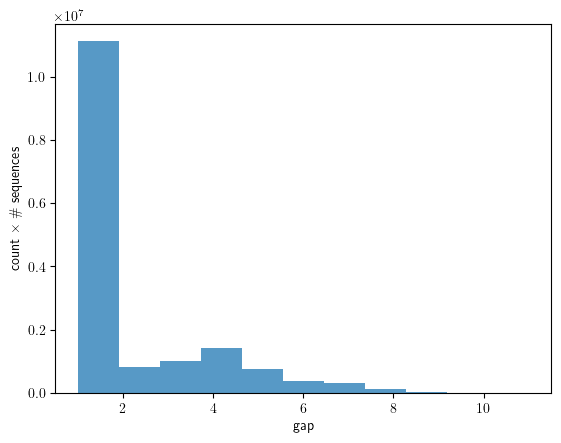

EUPUMaxDiffAttnDropAverageQueryPerOutputLogitReasoningAttnErrMeanMaxDiffSubproductRecursive: most (100.0%) sequences are <= 44 (based on + 1.5 std)


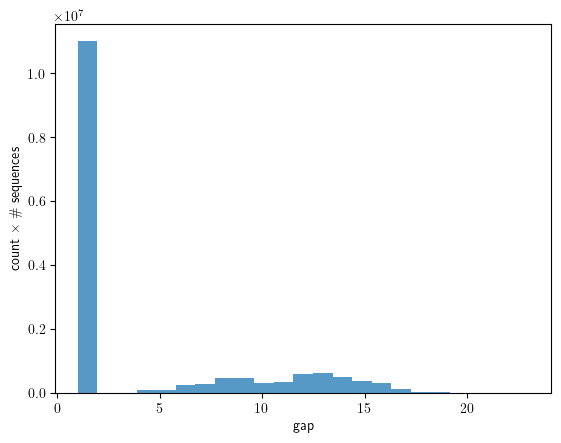

EUPUMaxDiffAttnDropAverageQueryPerOutputLogitReasoningAttnErrMeanRecursiveMaxDiffSubproductRecursive: most (100.0%) sequences are <= 45 (based on + 1.5 std)


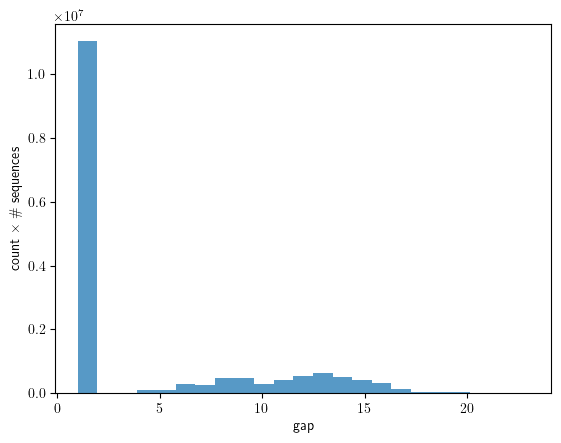

EUPUMaxDiffAttnDropAverageQueryPerOutputLogitReasoningAttnErrExactEqkeMaxDiffExact: most (97.96004891395569%) sequences are <= 6 (based on + 1.5 std)


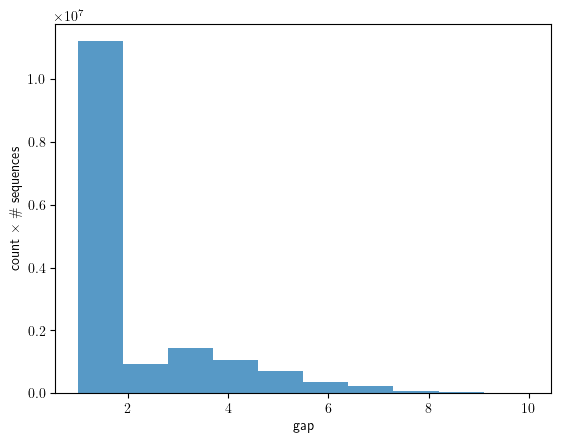

EUPUMaxDiffAttnDropAverageQueryPerOutputLogitReasoningAttnErrMaxDiffExact: most (97.56256341934204%) sequences are <= 6 (based on + 1.5 std)


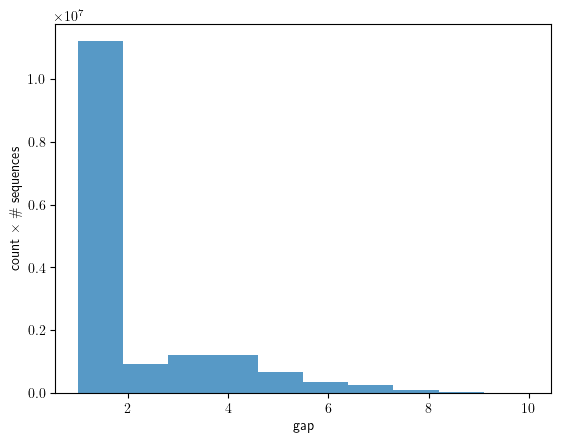

EUPUMaxDiffExactAttnMeanQueryDiffAttnErrSvd: most (100.0%) sequences are <= 11 (based on + 1.5 std)


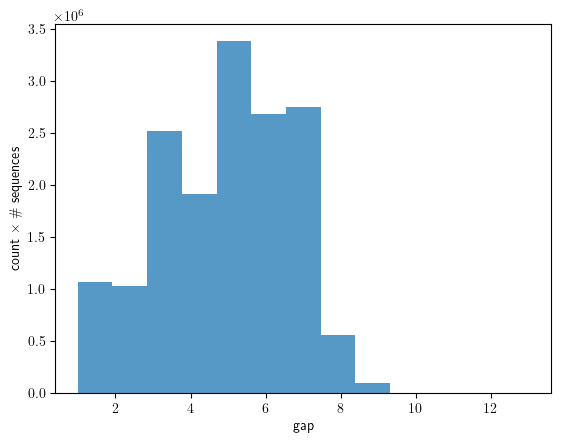

EUPUMaxDiffExactAttnMeanQueryDiffAttnErrMaxDiff: most (99.98000264167786%) sequences are <= 6 (based on + 1.5 std)


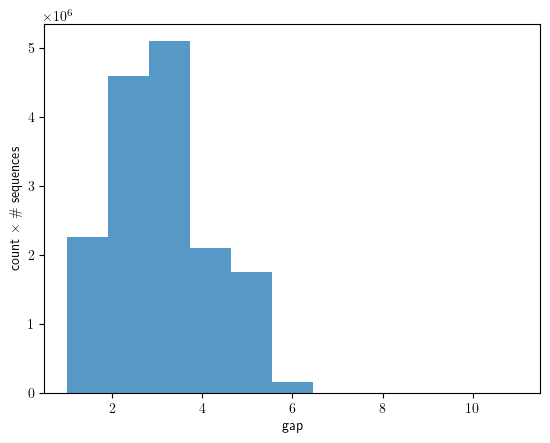

EUPUMaxDiffExactAttnMeanQueryDiffAttnErrMaxDiffSubproduct: most (99.11051392555237%) sequences are <= 5 (based on + 1.5 std)


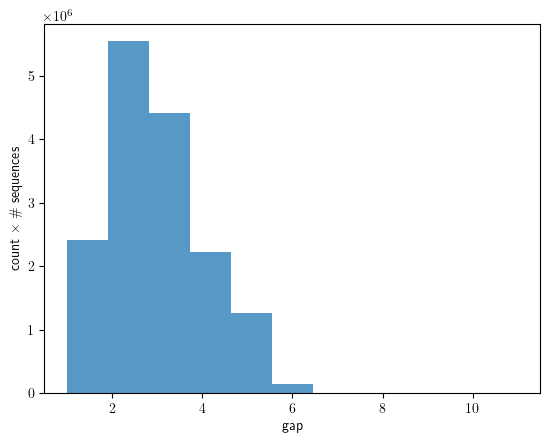

EUPUMaxDiffExactAttnMeanQueryDiffAttnErrMaxDiffSubproductRecursive: most (100.0%) sequences are <= 50 (based on + 1.5 std)


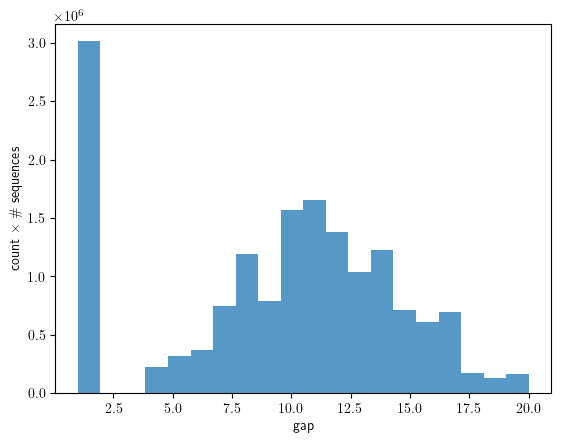

EUPUMaxDiffExactAttnMeanQueryDiffAttnErrMeanMaxDiff: most (99.98000264167786%) sequences are <= 6 (based on + 1.5 std)


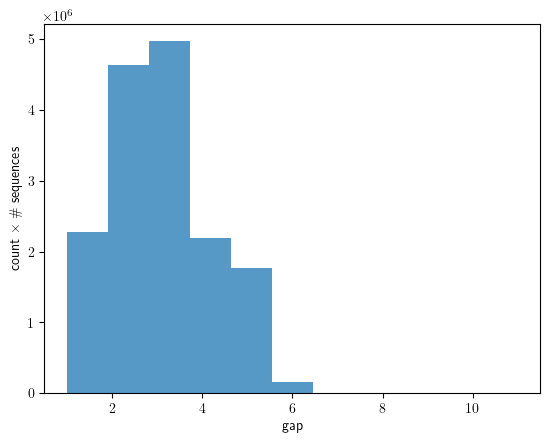

EUPUMaxDiffExactAttnMeanQueryDiffAttnErrMeanMaxDiffSubproduct: most (99.11051392555237%) sequences are <= 5 (based on + 1.5 std)


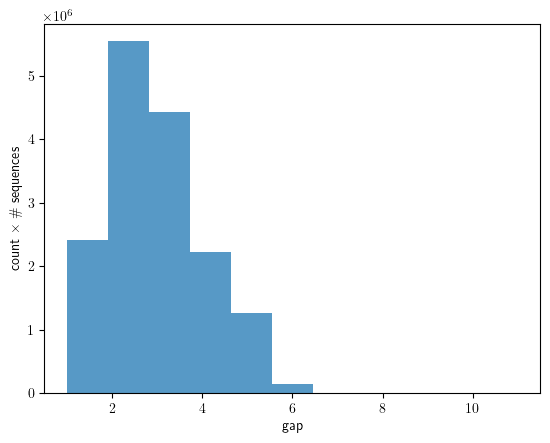

EUPUMaxDiffExactAttnMeanQueryDiffAttnErrMeanMaxDiffSubproductRecursive: most (100.0%) sequences are <= 50 (based on + 1.5 std)


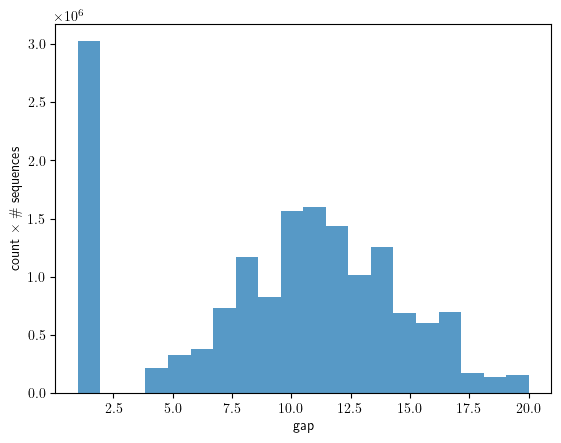

EUPUMaxDiffExactAttnMeanQueryDiffAttnErrMeanRecursiveMaxDiffSubproductRecursive: most (100.0%) sequences are <= 51 (based on + 1.5 std)


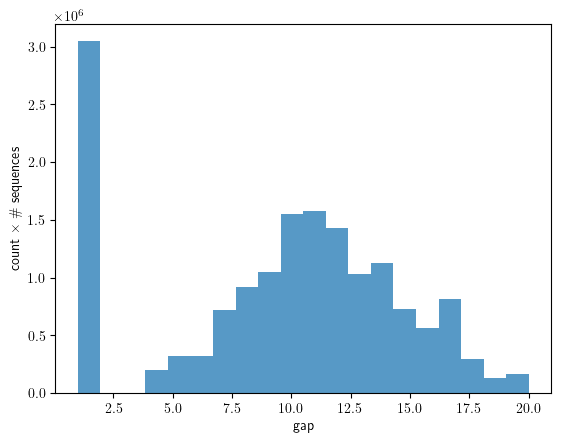

EUPUMaxDiffExactAttnMeanQueryDiffAttnErrExactEqkeMaxDiffExact: most (96.94347977638245%) sequences are <= 4 (based on + 1.5 std)


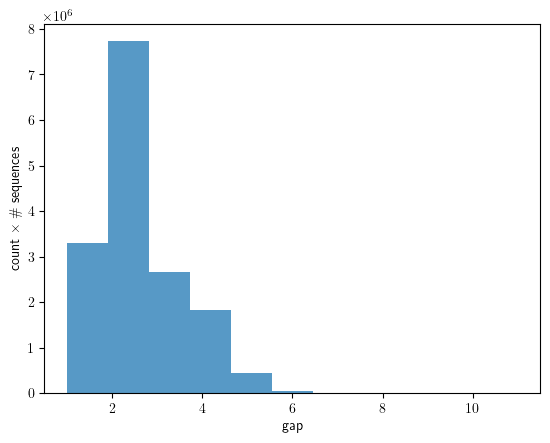

EUPUMaxDiffExactAttnMeanQueryDiffAttnErrMaxDiffExact: most (99.3118941783905%) sequences are <= 5 (based on + 1.5 std)


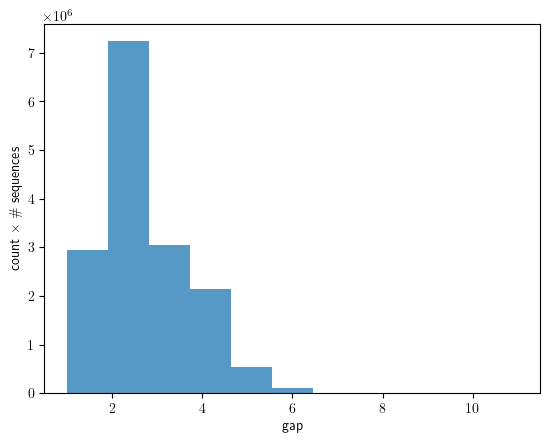

EUPUMaxDiffExactAttnDropAverageQueryPerOutputLogitReasoningAttnErrSvd: most (100.0%) sequences are <= 13 (based on + 1.5 std)


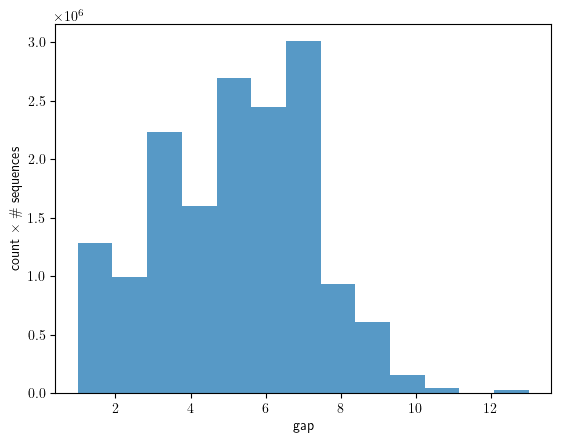

EUPUMaxDiffExactAttnDropAverageQueryPerOutputLogitReasoningAttnErrMaxDiff: most (99.8161256313324%) sequences are <= 7 (based on + 1.5 std)


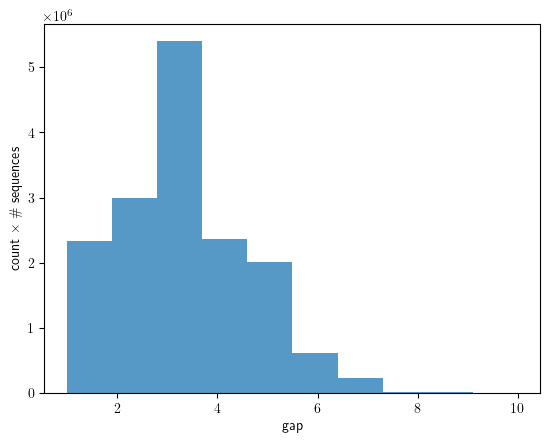

EUPUMaxDiffExactAttnDropAverageQueryPerOutputLogitReasoningAttnErrMaxDiffSubproduct: most (98.81035685539246%) sequences are <= 6 (based on + 1.5 std)


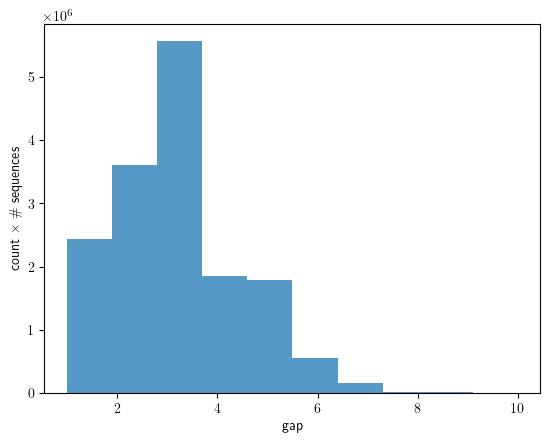

EUPUMaxDiffExactAttnDropAverageQueryPerOutputLogitReasoningAttnErrMaxDiffSubproductRecursive: most (100.0%) sequences are <= 55 (based on + 1.5 std)


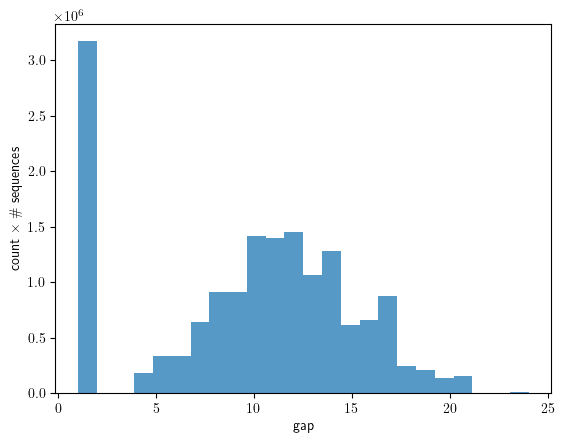

EUPUMaxDiffExactAttnDropAverageQueryPerOutputLogitReasoningAttnErrMeanMaxDiff: most (99.8161256313324%) sequences are <= 7 (based on + 1.5 std)


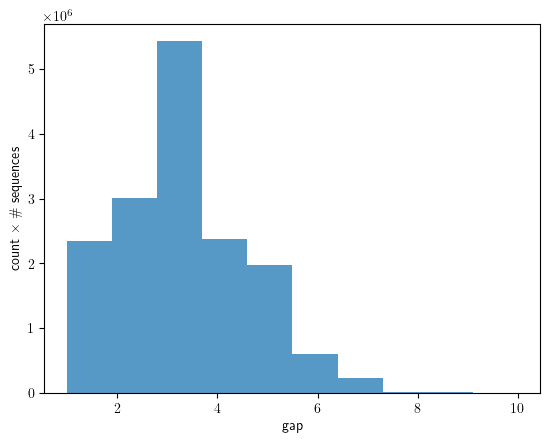

EUPUMaxDiffExactAttnDropAverageQueryPerOutputLogitReasoningAttnErrMeanMaxDiffSubproduct: most (98.81035685539246%) sequences are <= 6 (based on + 1.5 std)


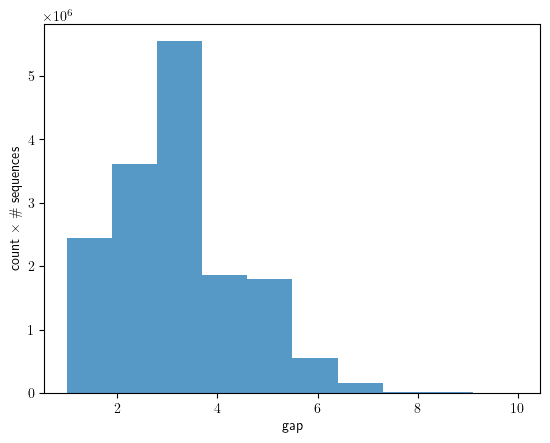

EUPUMaxDiffExactAttnDropAverageQueryPerOutputLogitReasoningAttnErrMeanMaxDiffSubproductRecursive: most (100.0%) sequences are <= 54 (based on + 1.5 std)


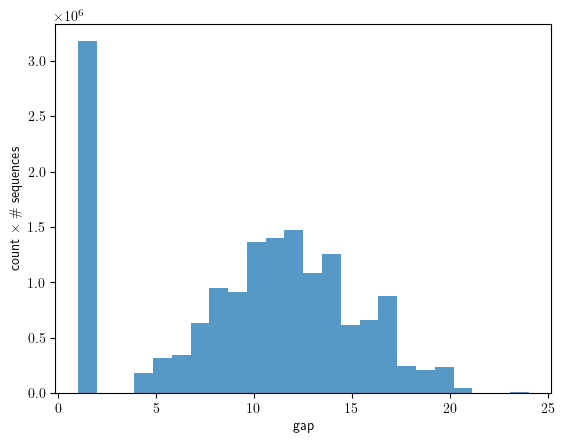

EUPUMaxDiffExactAttnDropAverageQueryPerOutputLogitReasoningAttnErrMeanRecursiveMaxDiffSubproductRecursive: most (100.0%) sequences are <= 55 (based on + 1.5 std)


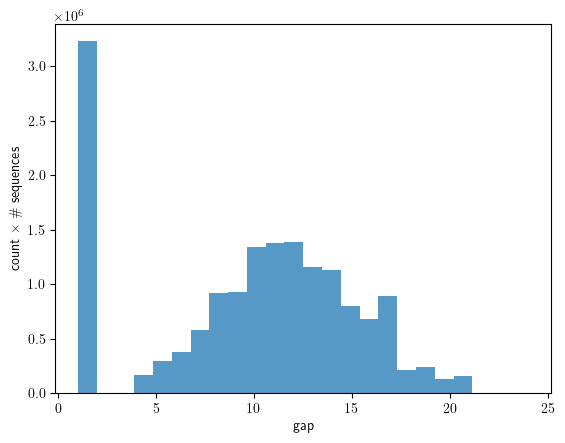

EUPUMaxDiffExactAttnDropAverageQueryPerOutputLogitReasoningAttnErrExactEqkeMaxDiffExact: most (99.56966042518616%) sequences are <= 6 (based on + 1.5 std)


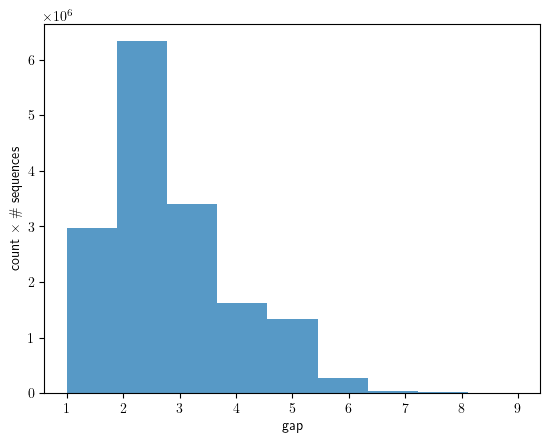

EUPUMaxDiffExactAttnDropAverageQueryPerOutputLogitReasoningAttnErrMaxDiffExact: most (99.46637153625488%) sequences are <= 6 (based on + 1.5 std)


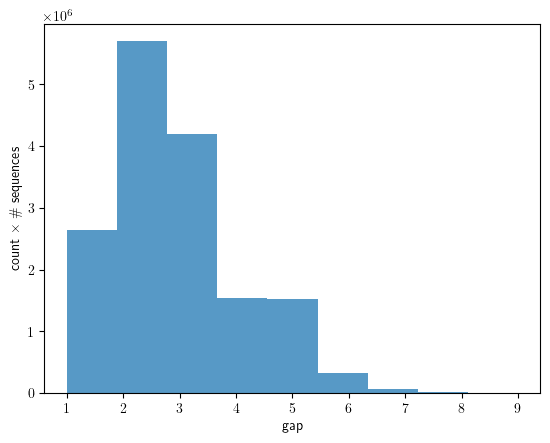

EUPUGlobalMaxDiffExactAttnMeanQueryDiffAttnErrSvd: most (99.98088479042053%) sequences are <= 11 (based on + 1.5 std)


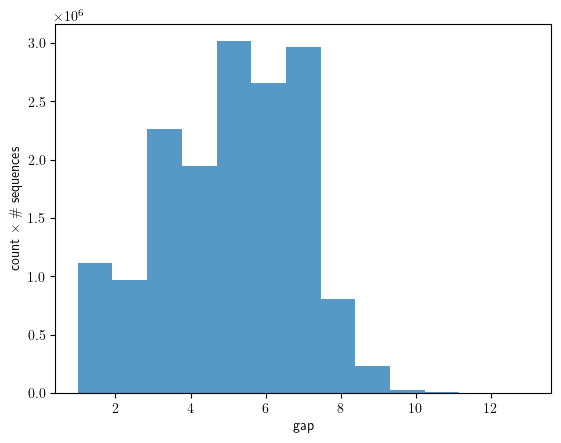

EUPUGlobalMaxDiffExactAttnMeanQueryDiffAttnErrMaxDiff: most (99.77216124534607%) sequences are <= 6 (based on + 1.5 std)


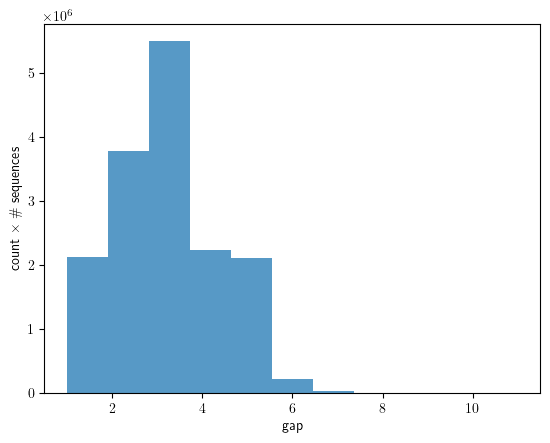

EUPUGlobalMaxDiffExactAttnMeanQueryDiffAttnErrMaxDiffSubproduct: most (99.90198016166687%) sequences are <= 6 (based on + 1.5 std)


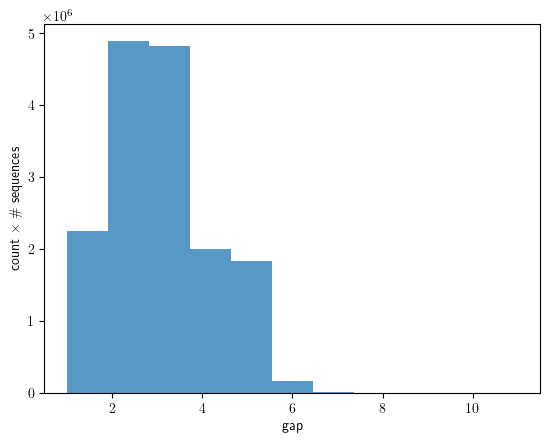

EUPUGlobalMaxDiffExactAttnMeanQueryDiffAttnErrMaxDiffSubproductRecursive: most (100.0%) sequences are <= 51 (based on + 1.5 std)


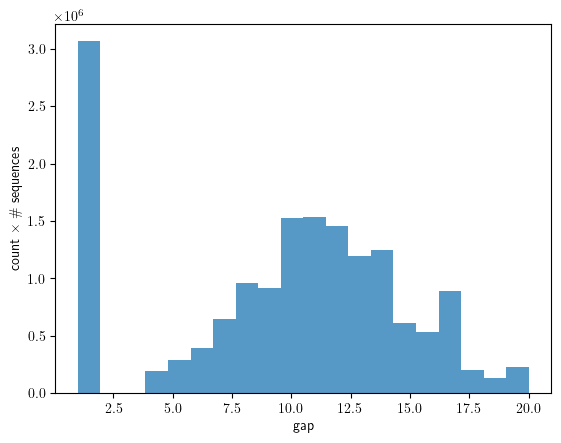

EUPUGlobalMaxDiffExactAttnMeanQueryDiffAttnErrMeanMaxDiff: most (99.77216124534607%) sequences are <= 6 (based on + 1.5 std)


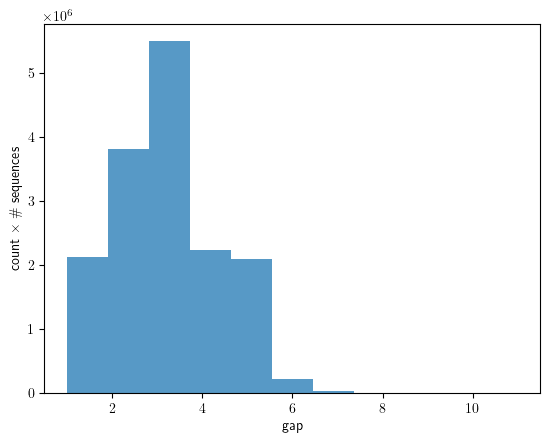

EUPUGlobalMaxDiffExactAttnMeanQueryDiffAttnErrMeanMaxDiffSubproduct: most (99.90198016166687%) sequences are <= 6 (based on + 1.5 std)


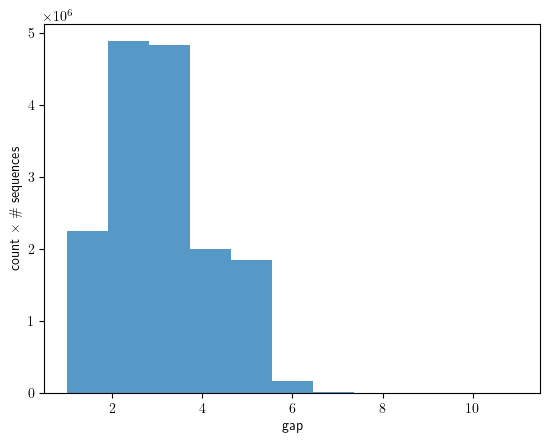

EUPUGlobalMaxDiffExactAttnMeanQueryDiffAttnErrMeanMaxDiffSubproductRecursive: most (100.0%) sequences are <= 51 (based on + 1.5 std)


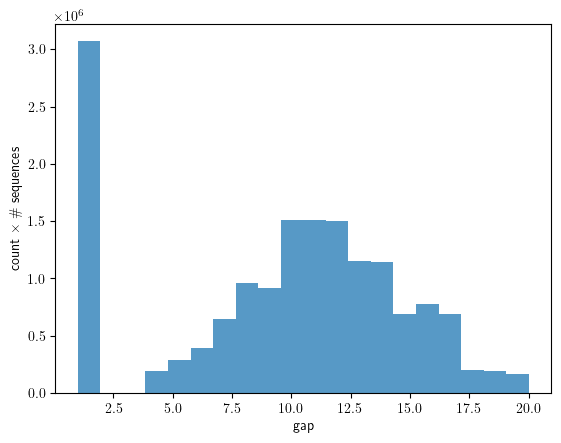

EUPUGlobalMaxDiffExactAttnMeanQueryDiffAttnErrMeanRecursiveMaxDiffSubproductRecursive: most (100.0%) sequences are <= 52 (based on + 1.5 std)


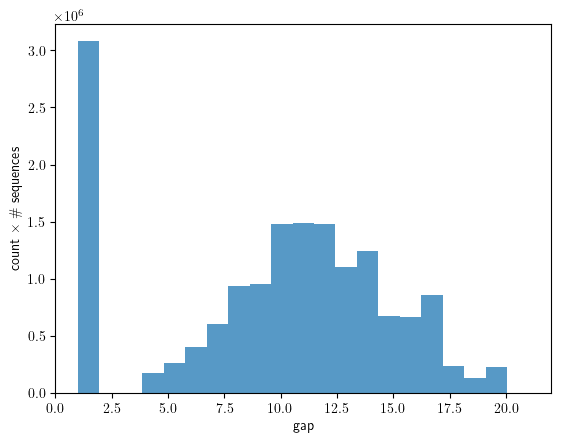

EUPUGlobalMaxDiffExactAttnMeanQueryDiffAttnErrExactEqkeMaxDiffExact: most (99.18633699417114%) sequences are <= 5 (based on + 1.5 std)


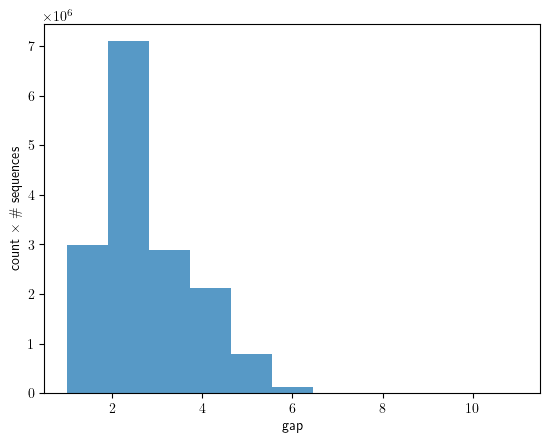

EUPUGlobalMaxDiffExactAttnMeanQueryDiffAttnErrMaxDiffExact: most (99.04389381408691%) sequences are <= 5 (based on + 1.5 std)


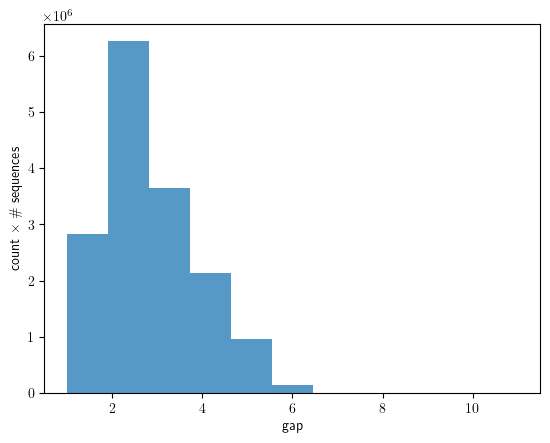

EUPUGlobalMaxDiffExactAttnDropAverageQueryPerOutputLogitReasoningAttnErrSvd: most (100.0%) sequences are <= 15 (based on + 1.5 std)


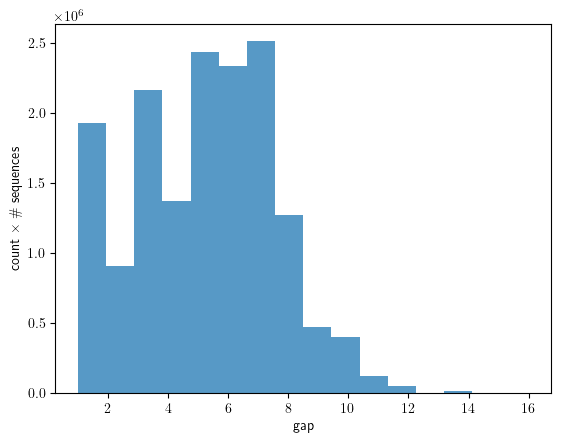

EUPUGlobalMaxDiffExactAttnDropAverageQueryPerOutputLogitReasoningAttnErrMaxDiff: most (99.69943761825562%) sequences are <= 8 (based on + 1.5 std)


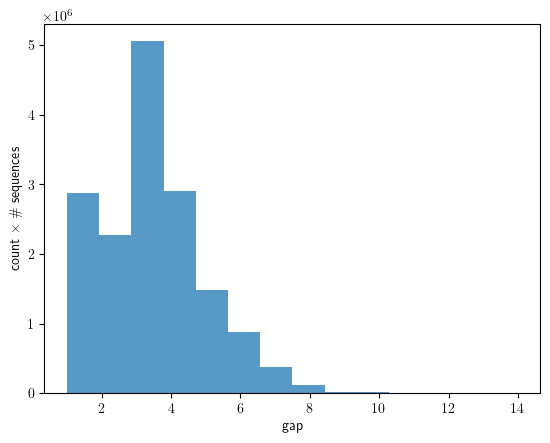

EUPUGlobalMaxDiffExactAttnDropAverageQueryPerOutputLogitReasoningAttnErrMaxDiffSubproduct: most (99.25682544708252%) sequences are <= 7 (based on + 1.5 std)


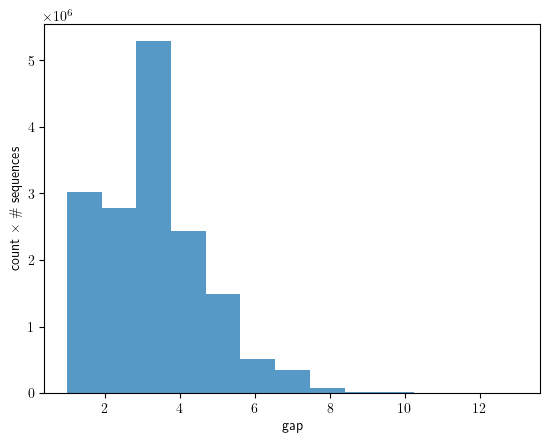

EUPUGlobalMaxDiffExactAttnDropAverageQueryPerOutputLogitReasoningAttnErrMaxDiffSubproductRecursive: most (100.0%) sequences are <= 58 (based on + 1.5 std)


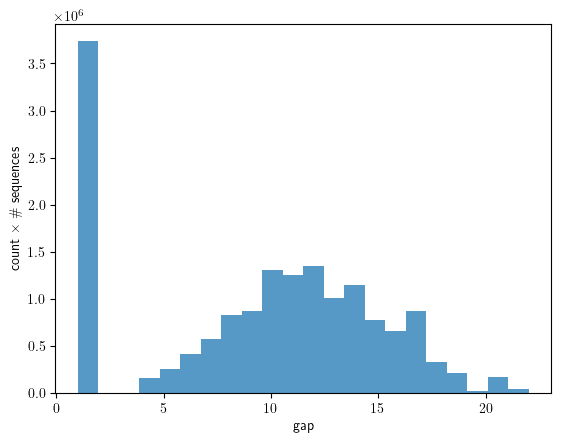

EUPUGlobalMaxDiffExactAttnDropAverageQueryPerOutputLogitReasoningAttnErrMeanMaxDiff: most (99.72240328788757%) sequences are <= 8 (based on + 1.5 std)


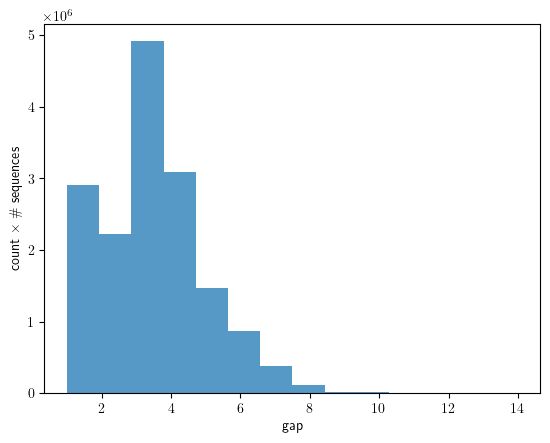

EUPUGlobalMaxDiffExactAttnDropAverageQueryPerOutputLogitReasoningAttnErrMeanMaxDiffSubproduct: most (99.25682544708252%) sequences are <= 7 (based on + 1.5 std)


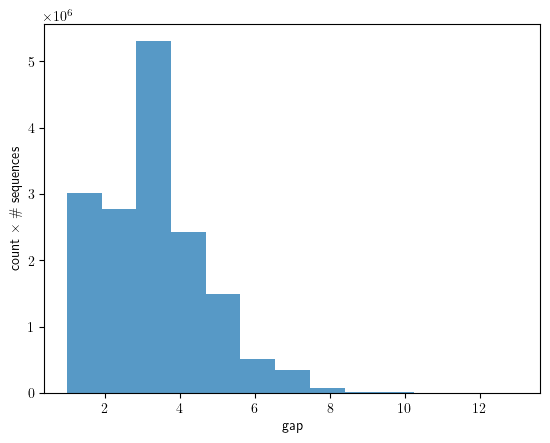

EUPUGlobalMaxDiffExactAttnDropAverageQueryPerOutputLogitReasoningAttnErrMeanMaxDiffSubproductRecursive: most (100.0%) sequences are <= 58 (based on + 1.5 std)


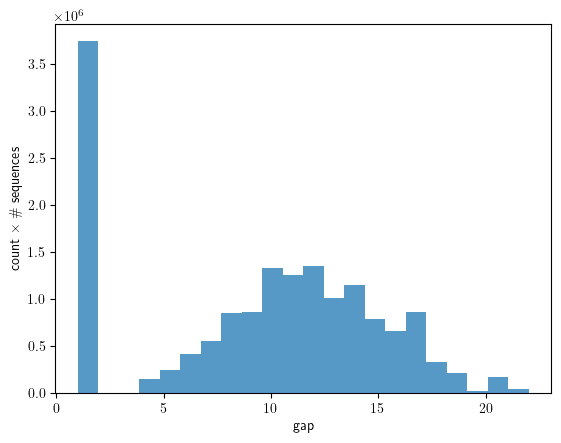

EUPUGlobalMaxDiffExactAttnDropAverageQueryPerOutputLogitReasoningAttnErrMeanRecursiveMaxDiffSubproductRecursive: most (100.0%) sequences are <= 59 (based on + 1.5 std)


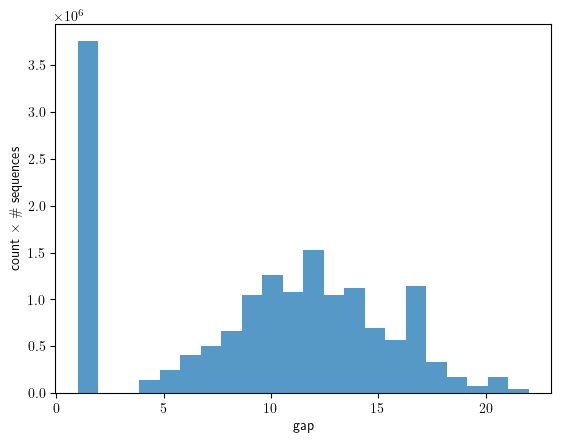

EUPUGlobalMaxDiffExactAttnDropAverageQueryPerOutputLogitReasoningAttnErrExactEqkeMaxDiffExact: most (98.10628294944763%) sequences are <= 6 (based on + 1.5 std)


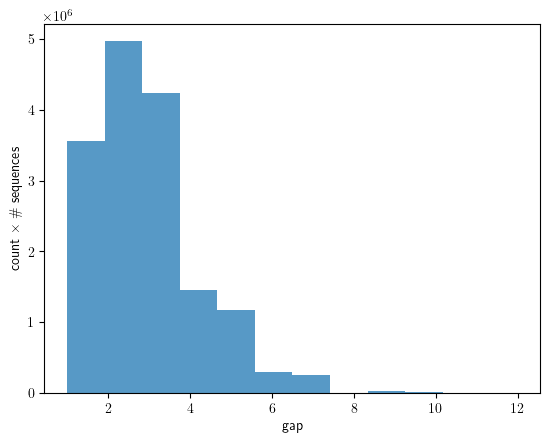

EUPUGlobalMaxDiffExactAttnDropAverageQueryPerOutputLogitReasoningAttnErrMaxDiffExact: most (97.8272795677185%) sequences are <= 6 (based on + 1.5 std)


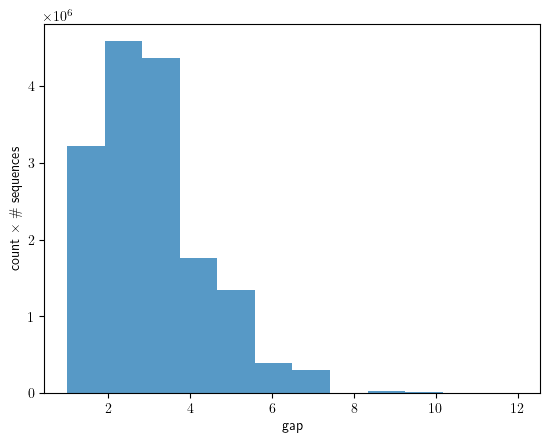

In [ ]:
# %%

subcubic_instruction_count_map: dict[
    LargestWrongLogitQuadraticConfig, InstructionCount
] = {}
subcubic_perf_instruction_count_map: dict[
    LargestWrongLogitQuadraticConfig, PerfCounter
] = {}


def _subcubic_count_verify_proof(
    model: HookedTransformer,
    tricks: LargestWrongLogitQuadraticConfig,
    *,
    sanity_check_instructions: bool = False,
    **kwargs,
) -> Tuple[InstructionCount, dict[str, Any]]:
    # must be outside PatchTorch to avoid triu, tril
    cmodel = CountHookedTransformer(model)
    with PatchTorch():
        with instructions.set_sanity_check(sanity_check_instructions):
            with CountTensorOperations() as subcubic_instruction_count:
                results = subcubic.verify_proof(
                    cmodel,
                    tricks=tricks,
                    **kwargs,
                    print_complexity=False,
                    print_results=False,
                    sanity_check=False,
                    # print_types=True,
                )
    return subcubic_instruction_count, results


# must be outside PatchTorch to avoid triu, tril
cmodel = CountHookedTransformer(model)
# err_exact = W_E_query_err2 @ W_Q_err @ W_K_errT @ W_E_key_err2T
min_gaps_lists = {}
with torch.no_grad():
    W_EP_direction_kwargs = analysis_quadratic.W_EP_direction_for_tricks_kwargs(model)
    find_min_gaps_kwargs = analysis_subcubic.find_min_gaps_with_EQKE_kwargs(model)
    size_and_query_directions_kwargs = analysis_quadratic.find_EKQE_error_directions(
        model
    )
    with memoshelve(
        (
            lambda cfg: (
                cfg,
                *analysis_subcubic.find_min_gaps_with_EQKE(
                    model=model,
                    **find_min_gaps_kwargs,  # type: ignore
                    **size_and_query_directions_kwargs,
                    tricks=cfg,
                    position=1,
                    leave=(cfg is all_configs[-1]),
                    desc=cfg.short_description(),
                    record_time=True,
                ),
            )
        ),
        # cache={},
        filename=cache_dir
        / f"{Path(__file__).name}.find_min_gaps-{cfg_hash_for_filename}",
    )() as find_min_gaps_for:
        min_gaps_lists = [
            find_min_gaps_for(cfg)
            for cfg in tqdm(
                all_configs,
                position=0,
                desc=f"trick cfg".strip(),
            )
        ]

    for tricks, min_gaps, _proof_search_duration in min_gaps_lists:
        postkey = tricks.short_description(latex=True)
        print(f"========================================\nTricks: {tricks}")
        # this is not part of the proof checking; the proof is correct regardless of what value is returned, so we don't count the complexity
        W_EP_direction = analysis_quadratic.W_EP_direction_for_tricks(
            **W_EP_direction_kwargs, tricks=tricks
        )

        def _verify_proof(tricks: LargestWrongLogitQuadraticConfig):
            return subcubic.verify_proof(
                model,
                W_EP_direction=W_EP_direction,
                **size_and_query_directions_kwargs,  # type: ignore
                min_gaps=min_gaps,
                tricks=tricks,
                sanity_check=False,
                include_perf=PERF_WORKING,
            )

        with memoshelve(
            _verify_proof,
            filename=cache_dir
            / f"{Path(__file__).name}.subcubic_verify_proof{'' if not PERF_WORKING else '-with-perf'}-{cfg_hash_for_filename}",
            get_hash_mem=(lambda x: x[0]),
            get_hash=str,
        )() as verify_proof:
            proof_results = verify_proof(tricks)

        if PERF_WORKING:
            subcubic_perf_instruction_count_map[tricks] = proof_results[
                "proofinstructions"
            ]
            latex_values |= latex_values_of_counter(
                f"Subcubic{postkey}", proof_results["proofinstructions"]
            )

        with memoshelve(
            partial(
                _subcubic_count_verify_proof,
                model,
                W_EP_direction=(
                    CountTensor.from_numpy(W_EP_direction)
                    if W_EP_direction is not None
                    else W_EP_direction
                ),
                **{k: CountTensor.from_numpy(v) if isinstance(v, torch.Tensor) else v for k, v in size_and_query_directions_kwargs.items()},  # type: ignore
                min_gaps=min_gaps,
                sanity_check_instructions=False,
            ),
            filename=cache_dir
            / f"{Path(__file__).name}.subcubic_count_verify_proof{'' if not PERF_WORKING else '-with-perf'}-{cfg_hash_for_filename}",
            get_hash_mem=(lambda x: x[0]),
            get_hash=str,
        )() as count_verify_proof:
            # count_verify_proof = partial(
            #     _subcubic_count_verify_proof,
            #     model,
            #     W_EP_direction=(
            #         CountTensor.from_numpy(W_EP_direction)
            #         if W_EP_direction is not None
            #         else W_EP_direction
            #     ),
            #     **{k: CountTensor.from_numpy(v) if isinstance(v, torch.Tensor) else v for k, v in size_and_query_directions_kwargs.items()},  # type: ignore
            #     min_gaps=min_gaps,
            #     sanity_check_instructions=False,
            # )
            (
                subcubic_instruction_count,
                subcubic_proof_instruction_count_results,
            ) = count_verify_proof(tricks)

        subcubic_instruction_count_map[tricks] = subcubic_instruction_count
        latex_values |= latex_values_of_instruction_count(
            f"Subcubic{postkey}", subcubic_instruction_count
        )

        err_upper_bound = proof_results["err_upper_bound"]
        prooftime = proof_results["prooftime"]
        accuracy_bound = proof_results["accuracy_lower_bound"]
        total_sequences = proof_results["total_sequences"]
        left_behind = proof_results["left_behind"]

        try:
            err_upper_bound_key = f"SubcubicErrUpperBound{tricks.transform_description(tricks.attention_error_handling, latex=True)}Float"
            err_upper_bound_value = err_upper_bound.item()
            print(f"err_upper_bound: {err_upper_bound_value}")
        except Exception:
            # print(f"err_upper_bound: {err_upper_bound}")
            err_upper_bound_key = f"SubcubicErrUpperBoundMax{tricks.transform_description(tricks.attention_error_handling, latex=True)}Float"
            err_upper_bound_value = err_upper_bound.max().item()
            print(f"err_upper_bound.max(): {err_upper_bound_value}")

        if (
            err_upper_bound_key in latex_values
            and latex_values[err_upper_bound_key] != err_upper_bound_value
        ):
            print(
                f"Warning: overwriting {err_upper_bound_key} from {latex_values[err_upper_bound_key]} to {err_upper_bound_value}"
            )
        latex_values[err_upper_bound_key] = err_upper_bound_value

        latex_values[f"SubcubicAccuracy{postkey}Float"] = accuracy_bound
        latex_values[f"SubcubicProofTime{postkey}Float"] = prooftime
        latex_values[f"SubcubicDroppedSequences{postkey}"] = left_behind
        latex_values[f"SubcubicDroppedSequencesFrac{postkey}Float"] = (
            left_behind / total_sequences
        )

    if DISPLAY_PLOTS:
        d_vocab_q, d_vocab_max, n_ctx_nonmax_copies = min_gaps_lists[0][1].shape
        weights = torch.zeros(
            (d_vocab_q, d_vocab_max, n_ctx_nonmax_copies), dtype=torch.long
        )
        for max_tok in range(d_vocab_max):
            cur_n_ctx_nonmax_copies = 1 if max_tok == 0 else n_ctx_nonmax_copies
            for n_copies_nonmax in range(cur_n_ctx_nonmax_copies):
                weights[: max_tok + 1, max_tok, n_copies_nonmax] = (
                    max_tok - 1
                ) ** n_copies_nonmax * math.comb(model.cfg.n_ctx - 1, n_copies_nonmax)
            weights[:max_tok, max_tok, n_ctx_nonmax_copies - 1] = 0
            # for q_tok in range(max_tok+1):
            #     if (
            #         # (q_tok > max_tok) or
            #          (
            #             n_copies_nonmax == n_ctx_nonmax_copies - 1
            #             and max_tok != q_tok
            #         )
            #         # or (max_tok == 0 and n_copies_nonmax > 0)
            #     ):
            #         weights[q_tok, max_tok, n_copies_nonmax] = 0
            # if max_tok == 0:
            #     assert q_tok == max_tok
            #     assert n_copies_nonmax == 0
        weights[1, 1, 0] = 1
        for tricks, v, _proof_search_time in min_gaps_lists:
            postkey = tricks.short_description(latex=False)
            postlatexkey = tricks.short_description(latex=True)
            v = v.flatten().detach().cpu()
            mean = np.average(v.numpy(), weights=weights.flatten().numpy())
            std = np.average(
                (v - mean).numpy() ** 2,
                weights=weights.flatten().numpy(),
            )
            num_std = 1.5
            most_below_value = int(math.ceil(mean + num_std * std))
            frac_below = (
                weights.flatten()[v <= most_below_value].sum() / weights.sum()
            ).item()
            latex_values[f"SubcubicGapMostBelowValue{postlatexkey}"] = most_below_value
            latex_values[f"SubcubicGapMostBelowValueNumStd{postlatexkey}Float"] = (
                num_std
            )
            latex_values[
                f"SubcubicGapMostBelowValueSequenceFrac{postlatexkey}Float"
            ] = frac_below
            print(
                f"{postlatexkey}: most ({frac_below*100}%) sequences are <= {most_below_value} (based on + {num_std} std)"
            )
            if v.max().item() == 1:
                print(f"All gaps are: {set(v.numpy())}")
                continue
            try:
                shash = "#" if PLOT_WITH == "plotly" else r"\#"
                fig = weighted_histogram(
                    v.numpy(),
                    weights.flatten().detach().numpy(),
                    xaxis="gap",
                    yaxis=f"count × {shash} sequences",
                    num_bins=v.max().item(),
                    plot_with=PLOT_WITH,
                    renderer=RENDERER,
                )
                latex_figures[f"SubcubicGapHistogram{postkey}"] = fig
            except Exception as e:
                etype, value, tb = sys.exc_info()
                if value is None:
                    traceback.print_exception(e)
                else:
                    for line in traceback.TracebackException(
                        type(value), value, tb, capture_locals=True
                    ).format():
                        print(line, file=sys.stderr)

In [ ]:
# %%

HAS_CSVS = False
if not BRUTE_FORCE_CSV_PATH.exists():
    print(
        f"Warning: {BRUTE_FORCE_CSV_PATH} does not exist; instruction count summary statistics will be skipped"
    )
elif not CUBIC_CSV_PATH.exists():
    print(
        f"Warning: {CUBIC_CSV_PATH} does not exist; instruction count summary statistics will be skipped"
    )
elif not SUBCUBIC_CSV_PATH.exists():
    print(
        f"Warning: {SUBCUBIC_CSV_PATH} does not exist; instruction count summary statistics will be skipped"
    )
elif not SUBCUBIC_ANALYSIS_CSV_PATH.exists():
    print(
        f"Warning: {SUBCUBIC_ANALYSIS_CSV_PATH} does not exist; instruction count summary statistics will be skipped"
    )
else:
    HAS_CSVS = True
    brute_force_df = pd.read_csv(BRUTE_FORCE_CSV_PATH)
    cubic_df = pd.read_csv(CUBIC_CSV_PATH)
    subcubic_df = pd.read_csv(SUBCUBIC_CSV_PATH)
    subcubic_analysis_df = pd.read_csv(SUBCUBIC_ANALYSIS_CSV_PATH)

In [ ]:
# %%

# Approximating effective dimensionality
d_vocab, n_ctx = model.cfg.d_vocab, model.cfg.n_ctx
latex_values["BruteForceEffectiveDimensionalityEstimate"] = brute_force_ed = (
    d_vocab ** (n_ctx + 1)
)
EUPU_cost = d_vocab**2
PVOU_cost = n_ctx * d_vocab
EPQKE_cost = d_vocab**2
EPQKP_cost = d_vocab * n_ctx
EVOU_cost = d_vocab**2
latex_values["CubicEffectiveDimensionalityEstimate"] = cubic_ed = (
    EUPU_cost + PVOU_cost + EPQKE_cost + EPQKP_cost + EVOU_cost
)

In [ ]:
# %%

if HAS_CSVS:
    brute_force_ext_df = brute_force_df.copy()
    if "BruteForceInstructionCount" not in latex_values:
        print("Warning: falling back on old value for BruteForceInstructionCount")
    brute_force_ext_df["proof-flop-estimate"] = latex_values.get(
        "BruteForceInstructionCount", 876123000832
    )
    brute_force_ext_df["normalized-accuracy-bound"] = (
        brute_force_ext_df["accuracy"] / brute_force_ext_df["accuracy"]
    )
    brute_force_ext_df["accuracy-bound"] = brute_force_ext_df["accuracy"]
    brute_force_ext_df["group"] = "brute-force"
    brute_force_ext_df["effective-dimension-estimate"] = brute_force_ed
    brute_force_ext_df["leading-complexity"] = "brute-force"
    brute_force_ext_df["tricks"] = ""

    cubic_ext_df = cubic_df.merge(brute_force_df[["seed", "accuracy"]], on="seed")
    if "CubicInstructionCount" not in latex_values:
        print("Warning: falling back on old value for CubicInstructionCount")
    cubic_ext_df["proof-flop-estimate"] = latex_values.get(
        "CubicInstructionCount", 35181664
    )
    cubic_ext_df["normalized-accuracy-bound"] = (
        cubic_ext_df["accuracy-bound"] / cubic_ext_df["accuracy"]
    )
    cubic_ext_df["group"] = "cubic"
    cubic_ext_df["leading-complexity"] = "cubic"
    cubic_ext_df["effective-dimension-estimate"] = cubic_ed
    cubic_ext_df["tricks"] = ""

    subcubic_PVOU_cost = d_vocab
    subcubic_EPQKP_cost = 0

    subcubic_ext_df = subcubic_df.merge(brute_force_df[["seed", "accuracy"]], on="seed")
    subcubic_ext_df["normalized-accuracy-bound"] = (
        subcubic_ext_df["accuracy-bound"] / subcubic_ext_df["accuracy"]
    )
    warned = False

    @cache
    def parse_tricks_legacy(tricks):
        if tricks.startswith("ExactEQKE"):
            global warned
            if not warned:
                print(f"Warning: legacy {tricks}")
            warned = True
            tricks = tricks[len("ExactEQKE") :]
            assert tricks.endswith("AttnErrMaxDiffExact"), tricks
            tricks = (
                tricks[: -len("AttnErrMaxDiffExact")] + "AttnErrExactEqkeMaxDiffExact"
            )
        return LargestWrongLogitQuadraticConfig.parse(tricks, latex=True)

    def subcubic_approx_effective_dimension(row, df):
        _, model = runtime_models[row["seed"]]
        tricks = parse_tricks_legacy(row["tricks"])
        return (
            int(tricks.effective_dimension_estimate(model.cfg))
            + subcubic_PVOU_cost
            + subcubic_EPQKP_cost
            + EVOU_cost
        )

    def leading_complexity(row, df):
        tricks = parse_tricks_legacy(row["tricks"])
        return (
            "almost-quadratic"
            if tricks.is_quadratic
            else (
                "model-squared-vocab"
                if tricks.is_subcubic_no_quadratic_vocab
                else "subcubic" if tricks.is_subcubic else "fake-cubic"
            )
        )

    def subcubic_group(row, df):
        tricks = parse_tricks_legacy(row["tricks"])
        EUPU_str = (
            "direct-quadratic"
            if tricks.EUPU_handling_quadratic
            else (
                "direct-model-squared-vocab"
                if tricks.EUPU_handling_subcubic_no_quadratic_vocab
                else None if tricks.EUPU_handling_subcubic else "direct-cubic"
            )
        )
        EPQKE_str = (
            "attention-quadratic"
            if tricks.attention_error_handling_quadratic
            and tricks.attention_handling_quadratic
            else (
                "attention-model-squared-vocab"
                if tricks.attention_error_handling_subcubic_no_quadratic_vocab
                and tricks.attention_handling_subcubic_no_quadratic_vocab
                else (
                    None
                    if tricks.attention_error_handling_subcubic
                    and tricks.attention_handling_subcubic
                    else "attention-cubic-reference"
                )
            )
        )
        strs = [s for s in (EPQKE_str, EUPU_str) if s is not None]
        return "subcubic" + (f" ({', '.join(strs)})" if strs else "")

    subcubic_ext_df["group"] = subcubic_ext_df.apply(
        subcubic_group, args=(subcubic_ext_df,), axis=1
    )
    subcubic_ext_df["effective-dimension-estimate"] = subcubic_ext_df.apply(
        subcubic_approx_effective_dimension, args=(subcubic_ext_df,), axis=1
    )
    subcubic_ext_df["leading-complexity"] = subcubic_ext_df.apply(
        leading_complexity, args=(subcubic_ext_df,), axis=1
    )

    # Combine all data into a single DataFrame
    combined_df = pd.concat(
        [
            subcubic_ext_df[
                [
                    "proof-flop-estimate",
                    "normalized-accuracy-bound",
                    "accuracy-bound",
                    "seed",
                    "effective-dimension-estimate",
                    "leading-complexity",
                    "group",
                    "tricks",
                ]
            ],
            brute_force_ext_df[
                [
                    "proof-flop-estimate",
                    "normalized-accuracy-bound",
                    "accuracy-bound",
                    "seed",
                    "effective-dimension-estimate",
                    "leading-complexity",
                    "group",
                    "tricks",
                ]
            ],
            cubic_ext_df[
                [
                    "proof-flop-estimate",
                    "normalized-accuracy-bound",
                    "accuracy-bound",
                    "seed",
                    "effective-dimension-estimate",
                    "leading-complexity",
                    "group",
                    "tricks",
                ]
            ],
        ],
        ignore_index=True,
    )

    def is_frontier(row, df):
        seed_group = df[df["seed"] == row["seed"]]
        for _, other in seed_group.iterrows():
            if (
                other["normalized-accuracy-bound"] > row["normalized-accuracy-bound"]
                and other["proof-flop-estimate"] < row["proof-flop-estimate"]
            ):
                return False
        return True

    combined_df["frontier"] = combined_df.apply(
        is_frontier, args=(combined_df,), axis=1
    )

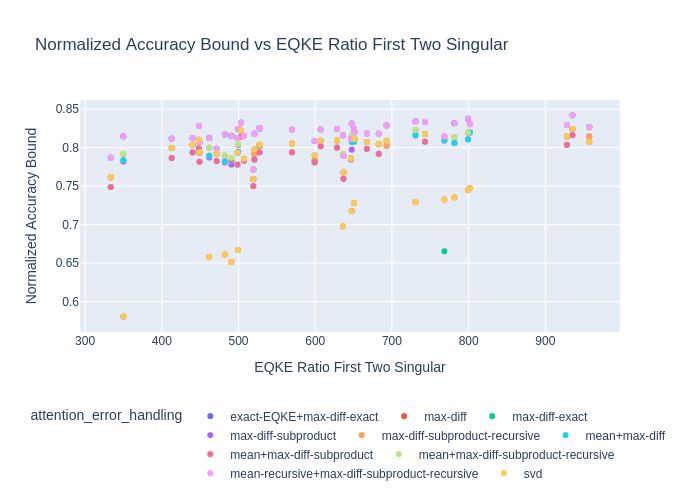

In [ ]:
# %%

if HAS_CSVS:
    subcubic_sing_df = subcubic_ext_df.merge(
        subcubic_analysis_df[["seed", "EQKERatioFirstTwoSingularFloat"]], on="seed"
    )[["seed", "normalized-accuracy-bound", "tricks", "EQKERatioFirstTwoSingularFloat"]]
    tricks = set(subcubic_sing_df["tricks"])
    for trick in tricks:
        if "AttnErrExactEqke" in trick:
            subcubic_sing_df = subcubic_sing_df[subcubic_sing_df["tricks"] != trick]
    subcubic_sing_df["attention_error_handling"] = subcubic_ext_df.apply(
        (
            lambda row: LargestWrongLogitQuadraticConfig.parse(
                row["tricks"], latex=True
            ).attention_error_handling.replace("_", "-")
        ),
        axis=1,
    )
    subcubic_sing_df["attention_handling"] = subcubic_ext_df.apply(
        (
            lambda row: LargestWrongLogitQuadraticConfig.parse(
                row["tricks"], latex=True
            ).attention_handling.replace("_", "-")
        ),
        axis=1,
    )
    subcubic_sing_df["EUPU_handling"] = subcubic_ext_df.apply(
        (
            lambda row: LargestWrongLogitQuadraticConfig.parse(
                row["tricks"], latex=True
            ).EUPU_handling.replace("_", "-")
        ),
        axis=1,
    )
    subcubic_sing_df = subcubic_sing_df.loc[
        subcubic_sing_df.groupby(["seed", "attention_error_handling"])[
            "normalized-accuracy-bound"
        ].idxmax()
    ]

    fig = px.scatter(
        subcubic_sing_df[
            [
                "normalized-accuracy-bound",
                "EQKERatioFirstTwoSingularFloat",
                "attention_error_handling",
            ]
        ],
        y="normalized-accuracy-bound",
        x="EQKERatioFirstTwoSingularFloat",
        color="attention_error_handling",
        title="Normalized Accuracy Bound vs EQKE Ratio First Two Singular",
        labels={
            "normalized-accuracy-bound": "Normalized Accuracy Bound",
            "EQKERatioFirstTwoSingularFloat": "EQKE Ratio First Two Singular",
        },
    )
    # fig.update_layout(showlegend=False)
    fig.update_layout(
        legend=dict(orientation="h", yanchor="top", y=-0.3, xanchor="center", x=0.5)
    )
    # Show the plot
    fig.show("png")

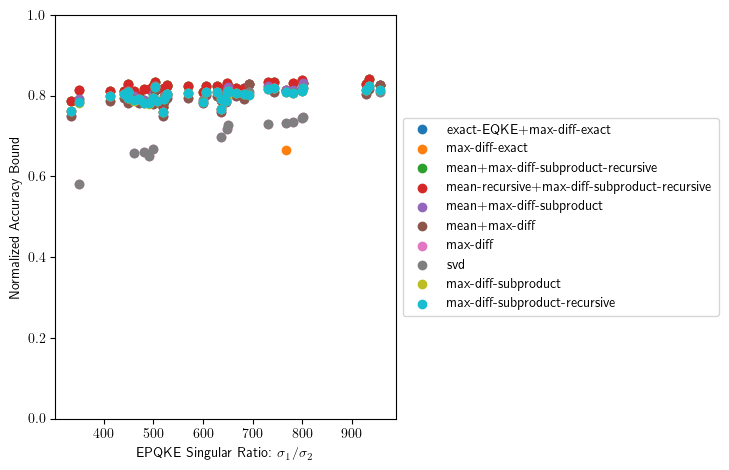

In [ ]:
# %%

if HAS_CSVS:
    subcubic_sing_df = subcubic_ext_df.merge(
        subcubic_analysis_df[["seed", "EQKERatioFirstTwoSingularFloat"]], on="seed"
    )[["seed", "normalized-accuracy-bound", "tricks", "EQKERatioFirstTwoSingularFloat"]]
    tricks = set(subcubic_sing_df["tricks"])
    for trick in tricks:
        if "AttnErrExactEqke" in trick:
            subcubic_sing_df = subcubic_sing_df[subcubic_sing_df["tricks"] != trick]
    subcubic_sing_df["attention_error_handling"] = subcubic_ext_df.apply(
        (
            lambda row: LargestWrongLogitQuadraticConfig.parse(
                row["tricks"], latex=True
            ).attention_error_handling.replace("_", "-")
        ),
        axis=1,
    )
    subcubic_sing_df["attention_handling"] = subcubic_ext_df.apply(
        (
            lambda row: LargestWrongLogitQuadraticConfig.parse(
                row["tricks"], latex=True
            ).attention_handling.replace("_", "-")
        ),
        axis=1,
    )
    subcubic_sing_df["EUPU_handling"] = subcubic_ext_df.apply(
        (
            lambda row: LargestWrongLogitQuadraticConfig.parse(
                row["tricks"], latex=True
            ).EUPU_handling.replace("_", "-")
        ),
        axis=1,
    )
    subcubic_sing_df = subcubic_sing_df.loc[
        subcubic_sing_df.groupby(["seed", "attention_error_handling"])[
            "normalized-accuracy-bound"
        ].idxmax()
    ]

    # Group by 'attention_error_handling' and calculate the max 'normalized-accuracy-bound' for sorting groups
    df = subcubic_sing_df[
        [
            "normalized-accuracy-bound",
            "EQKERatioFirstTwoSingularFloat",
            "attention_error_handling",
        ]
    ].sort_values(
        by=[
            "attention_error_handling",
            "normalized-accuracy-bound",
            "EQKERatioFirstTwoSingularFloat",
        ]
    )
    # Group by 'attention_error_handling' and calculate the max 'normalized-accuracy-bound' for each group
    max_bound_by_group = df.groupby("attention_error_handling")[
        "normalized-accuracy-bound"
    ].max()

    # Sort the groups by max 'normalized-accuracy-bound'
    sorted_groups = max_bound_by_group.sort_values(ascending=False)

    # Extract the sorted list of 'attention_error_handling' categories
    sorted_attn_err_handling = sorted_groups.index.tolist()

    latex_externalize_tables["NormalizedAccuracyBoundVsEPQKESingularRatio"] = True
    latex_figures["NormalizedAccuracyBoundVsEPQKESingularRatio"] = fig = scatter(
        df,
        yrange=(0, 1),
        y="normalized-accuracy-bound",
        x="EQKERatioFirstTwoSingularFloat",
        color="attention_error_handling",
        # title='Normalized Accuracy Bound vs EQKE Ratio First Two Singular',
        yaxis="Normalized Accuracy Bound",
        xaxis=r"EPQKE Singular Ratio: $\sigma_1 / \sigma_2$",
        # labels={
        #     'normalized-accuracy-bound': 'Normalized Accuracy Bound',
        #     'EQKERatioFirstTwoSingularFloat': 'EQKE Ratio First Two Singular'
        # }
        color_order=sorted_attn_err_handling,
        renderer=RENDERER,
        plot_with=PLOT_WITH,
    )
    # fig.update_layout(showlegend=False)
    # fig.update_layout(
    #     legend=dict(
    #         orientation="h",
    #         yanchor="top",
    #         y=-0.3,
    #         xanchor="center",
    #         x=0.5
    #     )
    # )
    # # Show the plot
    # fig.show('png')

In [ ]:
# %%

if HAS_CSVS:
    for descr, df in (
        (
            "all subcubic",
            subcubic_ext_df[subcubic_ext_df["leading-complexity"] != "fake-cubic"][
                "proof-flop-estimate"
            ],
        ),
        (
            "mainly subcubic",
            subcubic_ext_df[subcubic_ext_df["leading-complexity"] == "subcubic"][
                "proof-flop-estimate"
            ],
        ),
        (
            "almost quadratic",
            subcubic_ext_df[
                subcubic_ext_df["leading-complexity"] == "almost-quadratic"
            ]["proof-flop-estimate"],
        ),
    ):
        prekey = (
            f"ProofFlopEstimate{''.join([s.capitalize() for s in descr.split(' ')])}"
        )
        latex_values[f"{prekey}Mean"] = df.mean()
        latex_values[f"{prekey}StdDev"] = df.std()
        print(f"{descr}: {pm_mean_std(df)}")

all subcubic: 2852000 ± 794000
mainly subcubic: 2974000 ± 630000
almost quadratic: 2040000 ± 123000


In [ ]:
# %%

if HAS_CSVS:
    df_sorted = combined_df.sort_values(by="normalized-accuracy-bound", ascending=False)
    category_order = df_sorted["group"].unique().tolist()
    category_name_remap = {
        "brute-force": f"brute force (acc: {pm_mean_std(brute_force_df['accuracy'])})",
        "cubic": f"cubic (rel acc: {pm_mean_std(cubic_ext_df['normalized-accuracy-bound'])})",
    }
    max_rows = subcubic_ext_df.loc[
        subcubic_ext_df.groupby(["seed", "group"])["normalized-accuracy-bound"].idxmax()
    ]
    result = (
        max_rows.groupby("group")["normalized-accuracy-bound"]
        .agg(["mean", "std"])
        .reset_index()
    )
    for group_name in category_order:
        if group_name not in category_name_remap:
            avg, std = result[result["group"] == group_name][["mean", "std"]].iloc[0]
            new_group_name = group_name[len("subcubic (") : -1]
            new_group_name = "subcubic" if not new_group_name else new_group_name
            new_group_name = new_group_name.replace(
                "model-squared-vocab", r"$d_{\mathrm{model}}^2d_{\mathrm{vocab}}$"
            )
            category_name_remap[group_name] = (
                f"{new_group_name} (rel acc: {pm_round(avg, std)})"
            )

In [ ]:
# %%


def double_singleton_groups(data: pd.DataFrame, column: str) -> pd.DataFrame:
    # hack around https://github.com/nschloe/tikzplotlib/issues/594
    group_counts = data[column].value_counts()
    single_row_groups = group_counts[group_counts == 1].index
    for group in single_row_groups:
        single_row = data[data[column] == group]
        data = pd.concat([data, single_row], ignore_index=True)
    return data


# PLOT_WITH = "matplotlib"

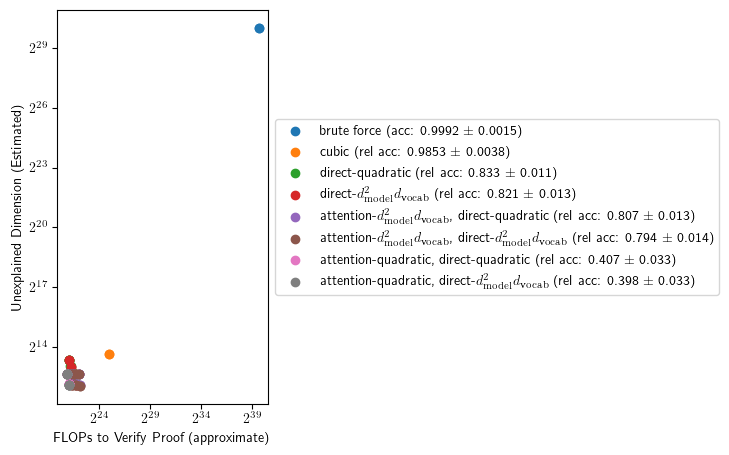

In [ ]:
# %%

if HAS_CSVS:
    latex_externalize_tables["EffectiveDimensionVsFLOP"] = True
    data = combined_df[
        ["proof-flop-estimate", "effective-dimension-estimate", "group"]
    ].copy()
    data = double_singleton_groups(data.drop_duplicates(), column="group")
    data = data.sort_values(
        by=["group", "proof-flop-estimate", "effective-dimension-estimate"]
    )
    data["group"] = data["group"].map(category_name_remap)
    latex_externalize_tables["EffectiveDimensionVsFLOP"] = True
    latex_figures["EffectiveDimensionVsFLOP"] = fig = scatter(
        data,
        x="proof-flop-estimate",
        y="effective-dimension-estimate",
        color="group",
        title="",
        log_x=2,
        log_y=2,
        reverse_xaxis=False,
        color_order=[category_name_remap[c] for c in category_order],
        xaxis="FLOPs to Verify Proof (approximate)",
        yaxis="Unexplained Dimension (Estimated)",
        plot_with=PLOT_WITH,
        renderer=RENDERER,
    )

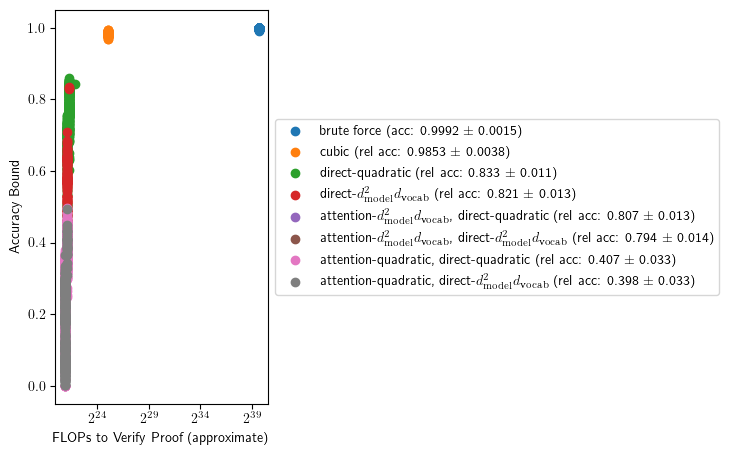

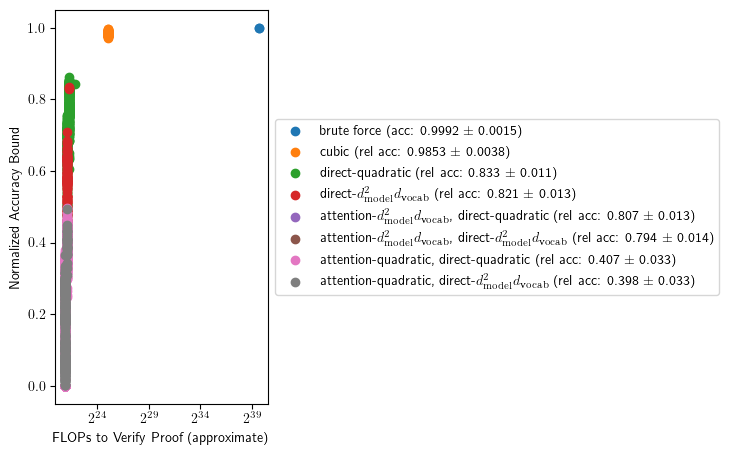

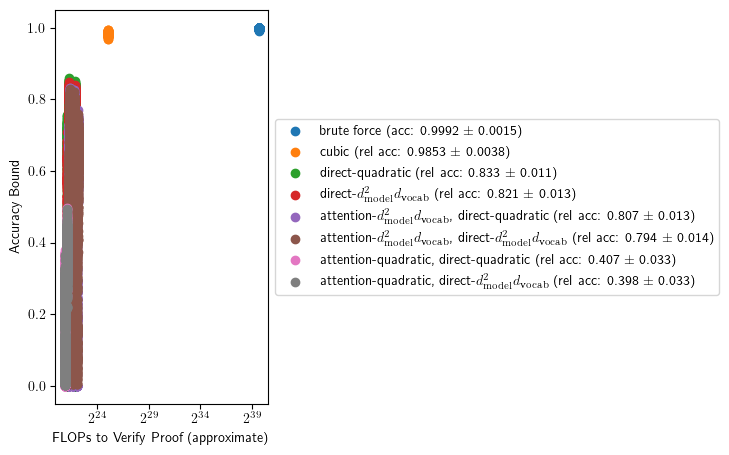

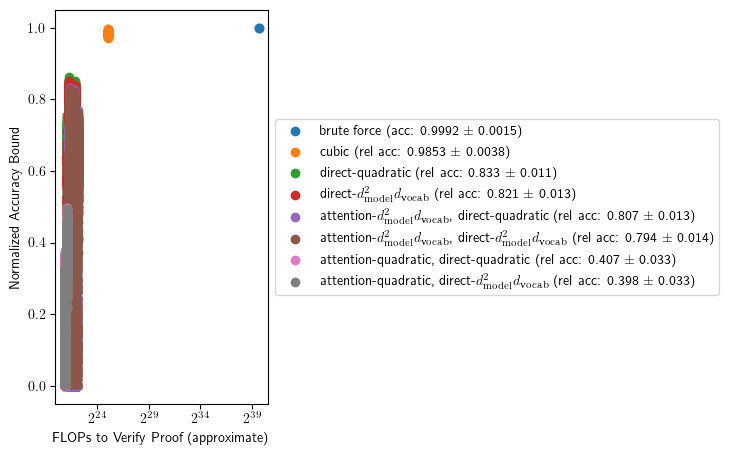

In [ ]:
# %%

if HAS_CSVS:
    for frontier_only in (True, False):
        for norm, normt in (("", ""), ("normalized-", "Normalized ")):
            key = f"{normt.strip()}AccuracyBoundVsFLOPs{'FrontierOnly' if frontier_only else ''}"
            data = (
                combined_df[combined_df["frontier"] == True]
                if frontier_only
                else combined_df
            )
            data = data[
                ["proof-flop-estimate", f"{norm}accuracy-bound", "group"]
            ].copy()
            data = double_singleton_groups(data.drop_duplicates(), column="group")
            data = data.sort_values(
                by=["group", f"{norm}accuracy-bound", "proof-flop-estimate"]
            )
            data["group"] = data["group"].map(category_name_remap)
            latex_externalize_tables[key] = True
            latex_figures[key] = fig = scatter(
                data,
                x="proof-flop-estimate",
                y=f"{norm}accuracy-bound",
                color="group",
                title="",  # "Pareto Frontier" if frontier_only else "",
                log_x=2,
                reverse_xaxis=False,
                xaxis="FLOPs to Verify Proof (approximate)",
                yaxis=f"{normt}Accuracy Bound",
                color_order=[category_name_remap[c] for c in category_order],
                plot_with=PLOT_WITH,
                renderer=RENDERER,
            )

In [ ]:
# %%

if HAS_CSVS:
    for norm, normt in (("", ""), ("normalized-", "Normalized ")):

        data = combined_df[
            [
                "proof-flop-estimate",
                f"{norm}accuracy-bound",
                "group",
                "frontier",
                "tricks",
            ]
        ].copy()
        # data["group"] = data["group"].map({k:k[:7] for k in set(data["group"])})
        fig = px.scatter(
            data,
            x="proof-flop-estimate",
            y=f"{norm}accuracy-bound",
            symbol="group",
            title=f"Scatter Plot of Proof Flop Estimate vs {normt}Accuracy Bound (Logarithmic X-Axis)",
            log_x=True,
            color="tricks",
            # symbol_map={True: "diamond", False: "circle"},
            # legend=False,
        )
        fig.update_layout(showlegend=False)
        # Flip the x-axis
        fig.update_layout(xaxis=dict(autorange="reversed"))

        fig.show()

# TRAIN_CSV_PATH = ALL_MODELS_PATH / "all-models-train-values.csv"
# TRAIN_CSV_PATH.parent.mkdir(exist_ok=True, parents=True)
# BRUTE_FORCE_CSV_PATH = (
#     ALL_MODELS_PATH / "all-models-brute-force-values.csv"
# )
# BRUTE_FORCE_CSV_PATH.parent.mkdir(exist_ok=True, parents=True)
# CUBIC_CSV_PATH = ALL_MODELS_PATH / "all-models-cubic-values.csv"
# CUBIC_CSV_PATH.parent.mkdir(exist_ok=True, parents=True)
# SUBCUBIC_CSV_PATH = ALL_MODELS_PATH / "all-models-subcubic-values.csv"
# SUBCUBIC_CSV_PATH.parent.mkdir(exist_ok=True, parents=True)

In [ ]:
# %%

latex_values["HEADSHA"] = git.get_head_sha(short=False)
latex_values["HEADSHASHORT"] = git.get_head_sha(short=True)

with open(LATEX_VALUES_PATH, "w") as f:
    f.write(to_latex_defs(latex_values))

with open(LATEX_GIT_DIFF_PATH, "w") as f:
    f.write(git.get_diff())

In [ ]:
# %%

# @title export LaTeX code
with open(LATEX_TIKZPLOTLIB_PREAMBLE_PATH, "w") as f:
    f.write(
        re.sub(
            r"\\documentclass{[^}]*}" + "\n*", "", tikzplotlib.Flavors.latex.preamble()
        )
        + r"""
% for line breaks
\pgfplotsset{title/.append style={align=center}}
"""
    )

In [ ]:
# %%

# @title export LaTeX figures
title_reps = {
    "W_E": r"\WE ",
    r"W_{\text{pos}}": r"\Wpos ",
    r"W_{\mathrm{pos}}": r"\Wpos ",
    r"W_Q": r"\WQ ",
    r"W_K": r"\WK ",
    r"d_{\text{head}}": r"\dhead ",
    r"d_{\mathrm{head}}": r"\dhead ",
    r"W_V": r"\WV ",
    r"W_O": r"\WO",
    r"W_U": r"\WU ",
    r"\text{EQKE}": r"\EPQKE ",
    r"\mathrm{EQKE}": r"\EPQKE ",
    r"\text{EQKP}": r"\EPQKP ",
    r"\mathrm{EQKP}": r"\EPQKP ",
    r"d_{\mathrm{model}}": r"\dmodel ",
    r"d_{\mathrm{vocab}}": r"\dvocab ",
}


@contextmanager
def texify_title(
    fig: go.Figure, replace_with_macros: bool = True, show: bool = False, renderer=None
):
    orig_title = fig.layout.title.text  # type: ignore
    new_title = None
    if orig_title is not None and (
        any(ch in orig_title for ch in "𝔼x̄") or r"$\mathbb{E}$" in orig_title
    ):
        print(f"Replacing 𝔼 in {orig_title}...")
        new_title = (
            orig_title.replace("𝔼", r"\mathbb{E}")
            .replace("x̄", r"\overline{x}")
            .replace("±", r"\pm ")
            .replace("σ", r"\sigma ")
            # .replace("½", r"\sfrac{1}{2}")
        )
        for word in (
            "None",
            "dim",
            "OV",
            "EQKE",
            "EVOU",
            ".diag",
            " (weighted by sequence count)",
            " (excluding diagonal)",
            "; range",
            "max",
            "min",
            "head",
        ):
            new_title = new_title.replace(word, r"\text{%s}" % word)
        new_title = re.sub(r"<sub>([^<]*)</sub>", r"_{\1}", new_title)
        new_title = re.sub(r"<sup>([^<]*)</sup>", r"^{\1}", new_title)
        new_title = new_title.replace("{pos}", r"{\text{pos}}")
        lines = new_title.split("<br>")
        if len(lines) > 1 and ":=" not in lines[0]:
            lines = [r"\text{%s}" % lines[0]] + lines[1:]
        elif ": " in lines[0]:
            lines = lines[0].split(": ")
            lines = [r"\text{%s: }%s" % (lines[0], ": ".join(lines[1:]))]
        new_title = r"\\".join(lines)
        new_title = f"${new_title}$"
        if replace_with_macros:
            for search, rep in title_reps.items():
                new_title = new_title.replace(search, rep)

        print(new_title)
    try:
        if new_title is not None:
            fig.update_layout(title_text=new_title)
            if show:
                fig.show(renderer)
        yield fig
    finally:
        if new_title is not None:
            fig.update_layout(title_text=orig_title)


@contextmanager
def texify_matplotlib_title(
    fig: matplotlib.figure.Figure, show: bool = False, replace_with_macros: bool = True
):
    def texify(s: Optional[str]) -> Optional[str]:
        if s is None:
            return None
        orig_s = s
        s = s.replace("\n", "\\\\\n")
        if replace_with_macros:
            for search, rep in title_reps.items():
                s = s.replace(search, rep)
        if s != orig_s:
            return s
        return None

    orig_suptitle = fig._suptitle.get_text() if fig._suptitle else None
    orig_titles = [ax.get_title() for ax in fig.axes if fig.axes]
    orig_xlabels = [ax.get_xlabel() for ax in fig.axes if fig.axes]
    orig_ylabels = [ax.get_ylabel() for ax in fig.axes if fig.axes]
    orig_legend_handles_labels = [
        ax.get_legend_handles_labels() if ax.get_legend() else ([], [])
        for ax in fig.axes
    ]
    new_suptitle = texify(orig_suptitle)
    new_titles = [texify(t) for t in orig_titles]
    new_xlabels = [texify(t) for t in orig_xlabels]
    new_ylabels = [texify(t) for t in orig_ylabels]
    new_legend_handles_labels = [
        (handles, [(texify(label) or label) for label in labels])
        for handles, labels in orig_legend_handles_labels
    ]
    try:
        if new_suptitle is not None:
            fig.suptitle(new_suptitle)
        if fig.axes:
            for (
                ax,
                new_title,
                new_xlabel,
                new_ylabel,
                (new_leg_handles, new_leg_labels),
            ) in zip(
                fig.axes,
                new_titles,
                new_xlabels,
                new_ylabels,
                new_legend_handles_labels,
            ):
                if new_title is not None:
                    ax.set_title(new_title)
                if new_xlabel is not None:
                    ax.set_xlabel(new_xlabel)
                if new_ylabel is not None:
                    ax.set_ylabel(new_ylabel)
                if new_leg_labels:
                    ax.legend(new_leg_handles, new_leg_labels)
        yield fig
    finally:
        if new_suptitle is not None:
            fig.suptitle(orig_suptitle)
        if fig.axes:
            for (
                ax,
                orig_title,
                orig_xlabel,
                orig_ylabel,
                (orig_leg_handles, orig_leg_labels),
            ) in zip(
                fig.axes,
                orig_titles,
                orig_xlabels,
                orig_ylabels,
                orig_legend_handles_labels,
            ):
                if orig_title is not None:
                    ax.set_title(orig_title)
                if orig_xlabel is not None:
                    ax.set_xlabel(orig_xlabel)
                if orig_ylabel is not None:
                    ax.set_ylabel(orig_ylabel)
                if orig_leg_labels:
                    ax.legend(orig_leg_handles, orig_leg_labels)


errs = []
for file_path in chain(
    LATEX_FIGURE_PATH.glob("*.png"), LATEX_FIGURE_PATH.glob("*.dat")
):
    file_path.unlink()
    print(f"Deleted: {file_path}")
for k, fig in latex_figures.items():
    if isinstance(fig, go.Figure):
        fig.update_layout(font_family="Computer Modern")  # Use LaTeX fonts
        unsupported_by_tikzplotly = any(
            isinstance(trace, go.Heatmap) for trace in fig.data
        )
        # if not unsupported_by_tikzplotly:
        #     p = LATEX_FIGURE_PATH / f"{k}.tex"
        #     print(f"Saving {p}...")
        #     p.parent.mkdir(parents=True, exist_ok=True)
        #     tikzplotly.save(p, fig)
        with texify_title(fig, replace_with_macros=False) as fig:
            if True or unsupported_by_tikzplotly:
                for ext in (".pdf", ".svg"):
                    p = LATEX_FIGURE_PATH / f"{k}{ext}"
                    print(f"Saving {p}...")
                    p.parent.mkdir(parents=True, exist_ok=True)
                    fig.write_image(p)
                    if ext == ".pdf":
                        try:
                            subprocess.run(["pdfcrop", p, p], check=True)
                        except FileNotFoundError as e:
                            print(f"Warning: {e}")
                            errs.append(e)
    elif isinstance(fig, matplotlib.figure.Figure):
        p = LATEX_FIGURE_PATH / f"{k}.tex"
        p.parent.mkdir(parents=True, exist_ok=True)
        if latex_externalize_tables.get(k, False):
            if not latex_only_externalize_tables.get(k, False):
                p = LATEX_FIGURE_PATH / f"{k}ExternalTables.tex"
            print(f"Saving {p}...")
            with texify_matplotlib_title(fig) as fig:
                tikzplotlib.save(
                    p, fig, externalize_tables=latex_externalize_tables.get(k, False)
                )
        p = LATEX_FIGURE_PATH / f"{k}.tex"
        print(f"Saving {p}...")
        with texify_matplotlib_title(fig, replace_with_macros=True) as fig:
            tikzplotlib.save(p, fig, externalize_tables=False)
        for ext in (".pdf", ".svg"):
            p = LATEX_FIGURE_PATH / f"{k}{ext}"
            print(f"Saving {p}...")
            p.parent.mkdir(parents=True, exist_ok=True)
            fig.savefig(p)
            if ext == ".pdf":
                try:
                    subprocess.run(["pdfcrop", p, p], check=True)
                except FileNotFoundError as e:
                    print(f"Warning: {e}")
                    errs.append(e)
    else:
        raise TypeError(f"Unsupported figure {fig} of type {type(fig)}")

for f in LATEX_FIGURE_PATH.glob("*.png"):
    try:
        image_utils.pngcrush(f)
    except FileNotFoundError as e:
        print(f"Warning: {e}")
        errs.append(e)

    try:
        image_utils.optipng(f)
    except FileNotFoundError as e:
        print(f"Warning: {e}")
        errs.append(e)

for e in errs:
    raise e

Deleted: /home/gbmi/guarantees-based-mechanistic-interpretability/notebooks/max_of_4/figures/PVOU-scatter-000.png
Deleted: /home/gbmi/guarantees-based-mechanistic-interpretability/notebooks/max_of_4/figures/WKkPerp-svd-000.png
Deleted: /home/gbmi/guarantees-based-mechanistic-interpretability/notebooks/max_of_4/figures/EVOU-000.png
Deleted: /home/gbmi/guarantees-based-mechanistic-interpretability/notebooks/max_of_4/figures/WKkPerp-svd-001.png
Deleted: /home/gbmi/guarantees-based-mechanistic-interpretability/notebooks/max_of_4/figures/EVOU-centered-000.png
Deleted: /home/gbmi/guarantees-based-mechanistic-interpretability/notebooks/max_of_4/figures/EQKP-000.png
Deleted: /home/gbmi/guarantees-based-mechanistic-interpretability/notebooks/max_of_4/figures/EQKE-SVD-000.png
Deleted: /home/gbmi/guarantees-based-mechanistic-interpretability/notebooks/max_of_4/figures/EQKE-SVD-001.png
Deleted: /home/gbmi/guarantees-based-mechanistic-interpretability/notebooks/max_of_4/figures/PVOU-000.png
Deleted